In [1]:
from imblearn.metrics import geometric_mean_score
import numpy as np
import keras
import gc
from keras.constraints import max_norm
import tensorflow as tf
from keras import backend as K
from keras.models import Sequential
from keras.layers import Dense,Dropout,BatchNormalization,LeakyReLU
from keras import optimizers,regularizers
from keras.callbacks import ReduceLROnPlateau,EarlyStopping
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from imblearn.over_sampling import SMOTE, ADASYN
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn import metrics
import time
from datetime import datetime, timedelta
np.random.seed(13)
from sklearn import svm
import pandas as pd
import matplotlib.pyplot as plt
import math
from __future__ import division
from sklearn.model_selection import KFold
from sklearn.preprocessing import normalize


files=['AAPL','AMZN','PEP','GOOGL','MSFT','FB','INTC','CSCO','CMCSA','NVDA','NFLX','BKNG','ADBE','AMGN','TXN','AVGO','PYPL','GILD','COST','QCOM']       
#files=['AAPL','AMZN','GOOGL','MSFT','FB','INTC','CSCO','CMCSA','NVDA','NFLX','ADBE','AMGN','TXN','AVGO','PYPL','GILD','COST','QCOM']       
dates=list()
prices=list()
sentiment=list()
for file in files:
    param = {
        'q': file, # Stock symbol (ex: "AAPL")
        'i': "900", # Interval size in seconds ("86400" = 1 day intervals)
        'x': "NASD", # INDEXNASDAQStock exchange symbol on which stock is traded (ex: "NASD")
        'p': "2Y" # Period (Ex: "1Y" = 1 year)
        }
    sentimentVector =  pd.read_csv('/home/andrea/Desktop/NLFF/intrinioDatasetUpdated/Sentiment/'+file+'.csv')
    price= pd.read_csv('/home/andrea/Desktop/NLFF/TechnicalDatasetUpdated/'+file+'.csv')
    #sentimentVector =  pd.read_csv('/home/andrea/Desktop/NLFF/intrinioDataset/SentimentFul/'+file+'.csv')
    #price= pd.read_csv('/home/andrea/Desktop/NLFF/TechnicalDataset/indexes'+file+'.csv')
    #alignment of data
    maxdata=max(sentimentVector['initTime'])
    mindata=min(sentimentVector['initTime'])
    price['Unnamed: 0'] = [datetime.strptime(row, '%Y-%m-%d %H:%M:%S') for row in price['Unnamed: 0']]
    price['Unnamed: 0'] = [row-timedelta(hours=8) for row in price['Unnamed: 0']]
    price=price[price['Unnamed: 0']>=mindata]
    price=price[price['Unnamed: 0']<=maxdata]
    print(file)
    dates.append(price['Unnamed: 0'])
    sentimentVector=sentimentVector.drop(['Unnamed: 0', 'initTime' ], axis=1)
    meanvector=np.concatenate((sentimentVector,sentimentVector.rolling(5).mean()),axis=1)
    meanvector=np.concatenate((meanvector,sentimentVector.rolling(10).mean()),axis=1)
    meanvector=np.concatenate((meanvector,sentimentVector.rolling(15).mean()),axis=1)
    meanvector=np.concatenate((meanvector,sentimentVector.rolling(20).mean()),axis=1)
    price=price.drop(['Unnamed: 0'],axis=1)
    #['macd','macds', 'boll_ub', 'boll_lb','rsi_6','rsi_12','vr_6_sma','wr_10','wr_6''close_10_sma''tr''middle_{}_sma'
    #df['dma'] = df['close_10_sma'] - df['close_50_sma'] pdi'] = cls._get_pdi(df, 14)df['mdi'] = cls._get_mdi(df, 14)
    #df['dx'] = cls._get_dx(df, 14) df['adx'] = df['dx_6_ema'] df['adxr'] = df['adx_6_ema']]
    #
    sentiment.append(meanvector)
    prices.append(price)

/home/andrea/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


AAPL
AMZN
PEP
GOOGL
MSFT
FB
INTC
CSCO
CMCSA
NVDA
NFLX
BKNG
ADBE
AMGN
TXN
AVGO
PYPL
GILD
COST
QCOM


In [2]:
def smote(x,y):
    X_resampled, y_resampled = SMOTE().fit_sample(x, y)
    #print('check',sum(y_resampled)/len(y_resampled))
    return X_resampled,y_resampled
def balance(x,y):
    posindex=np.where( y == 1 )
    negindex=np.where( y == 0 )
    xt=[]
    yt=[]
    yindex=[]
    nindex=min(len(posindex[0]),len(negindex[0]))

    #for i in range(1,nindex):
    yt=np.concatenate((y[posindex[0][0:nindex]],y[negindex[0][0:nindex]]))
    xt=np.concatenate((x[posindex[0][0:nindex]],x[negindex[0][0:nindex]]))
    
    return xt,yt

def balanceup(x,y):
    posindex=np.where( y == 1 )
    negindex=np.where( y == 0 )
    xt=[]
    yt=[]
    yindex=[]
    
    if(len(posindex[0])!=0 and len(negindex[0])!=0):
       
        nindex=max(len(posindex[0]),len(negindex[0]))
        mini=min(len(posindex[0]),len(negindex[0]))
        diff=nindex-mini
        u=0
        for i in range(0,mini):
            yt.append(y[posindex[0][i]])
            yt.append(y[negindex[0][i]])
            xt.append(x[posindex[0][i]])
            xt.append(x[negindex[0][i]])
        #print('first',sum(yt)/len(yt)) 
        if(len(posindex[0])>len(negindex[0])):
            toextract=negindex
            enter=posindex
        else:
            toextract=posindex
            enter=negindex
        if(diff!=0 and len(toextract[0])!=0):
            for i in range(0,diff):
                r=np.random.randint(0,len(toextract))
                yt.append(y[toextract[0][r]])
                xt.append(x[toextract[0][r]])
                yt.append(y[enter[0][mini+i]])
                xt.append(x[enter[0][mini+i]])
    else:
        #print('Unbalance')
        u=1
        xt=x
        yt=y
    #print(sum(yt)/len(yt))              
    return xt,yt,u
                    

In [3]:
def buildModel(l,n,d,le):
    opt=optimizers.SGD(lr=le, decay=1e-6, momentum=0.9, nesterov=True)
    model = Sequential()  
    model.add(Dense(n, input_dim=40,kernel_constraint=max_norm(1),activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU()) 
    model.add(Dropout(d))
    model.add(Dense(math.floor(n/2),kernel_constraint=max_norm(1), activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU())
    model.add(Dropout(d))
    model.add(Dense(math.floor(n/4),kernel_constraint=max_norm(1), activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU()) 
    model.add(Dense(1, activation='sigmoid')) 
    
    model.compile(optimizer=opt,loss='binary_crossentropy', metrics=['accuracy'])
    #o
    return model
def reset_weights(model):
    session=K.get_session()
    for layer in model.layers:
        if(hasattr(layer,'kernel_initializer')):
            layer.kernel.initializer.run(session=session)
           


Working on... AAPL
15.571701720841297
0.005338458253266777
working on d,u and l,le 0.5 64 0.01 0.001


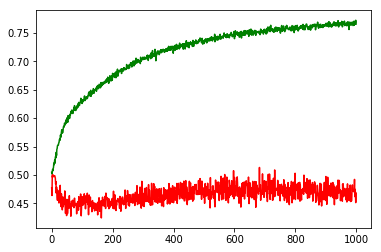

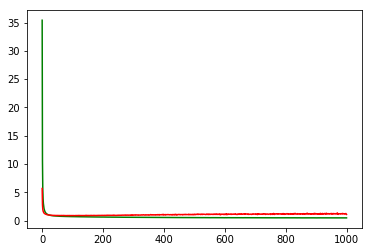

working on d,u and l,le 0.5 64 0.01 0.0001


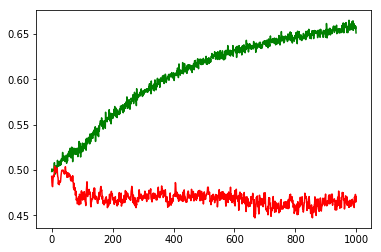

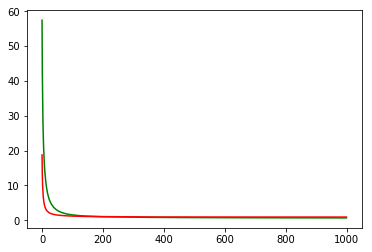

working on d,u and l,le 0.5 64 0.01 1e-05


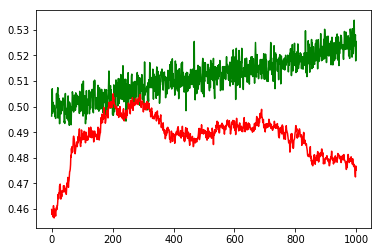

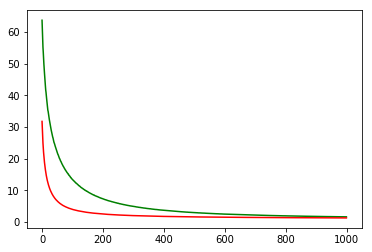

working on d,u and l,le 0.5 64 0.05 0.001


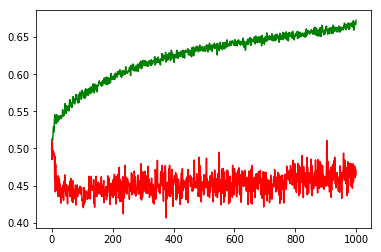

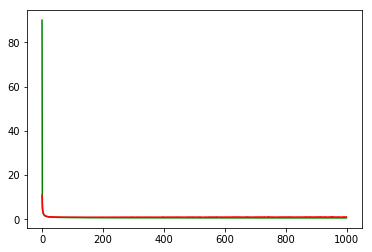

working on d,u and l,le 0.5 64 0.05 0.0001


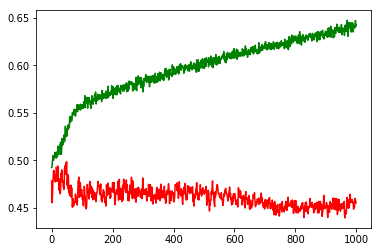

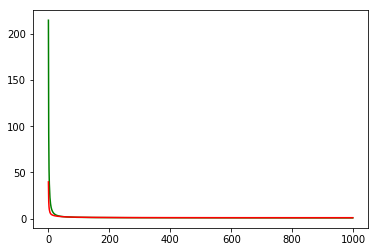

working on d,u and l,le 0.5 64 0.05 1e-05


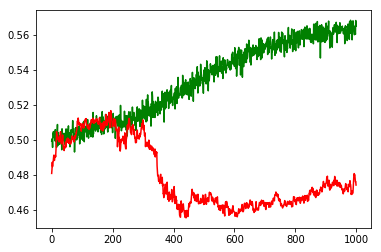

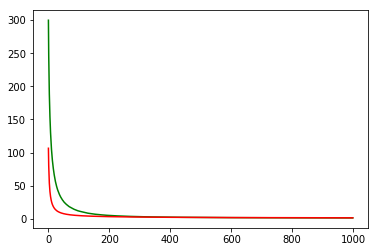

working on d,u and l,le 0.5 128 0.01 0.001


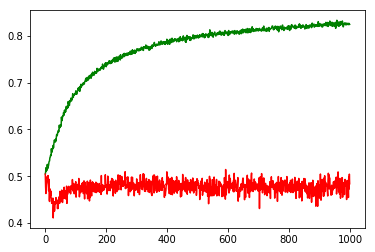

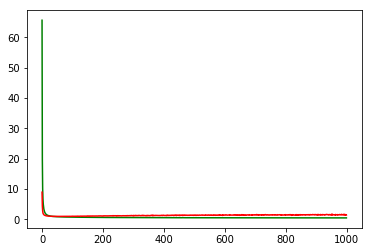

working on d,u and l,le 0.5 128 0.01 0.0001


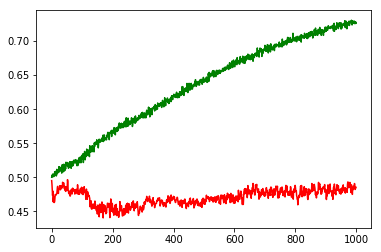

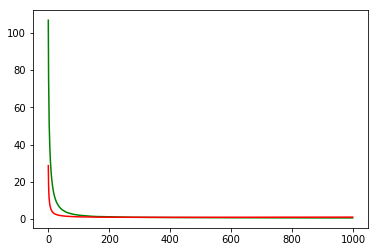

working on d,u and l,le 0.5 128 0.01 1e-05


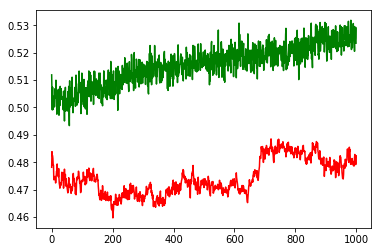

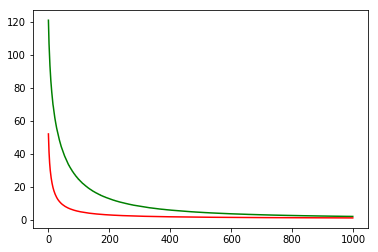

working on d,u and l,le 0.5 128 0.05 0.001


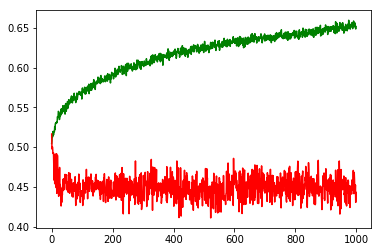

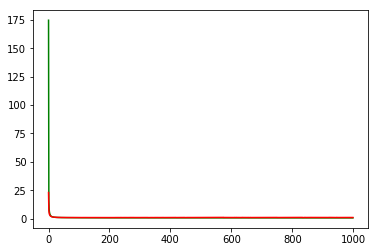

working on d,u and l,le 0.5 128 0.05 0.0001


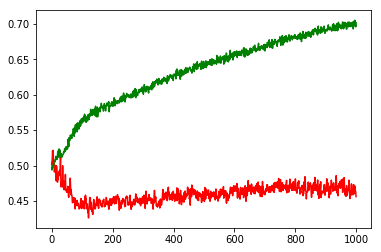

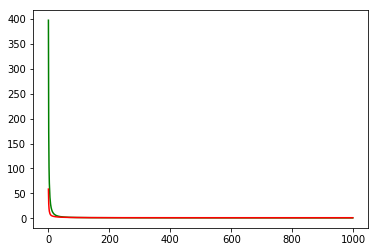

working on d,u and l,le 0.5 128 0.05 1e-05


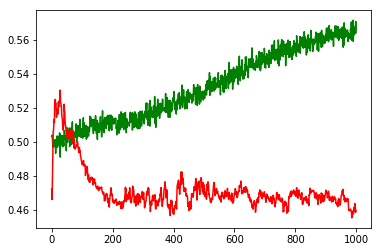

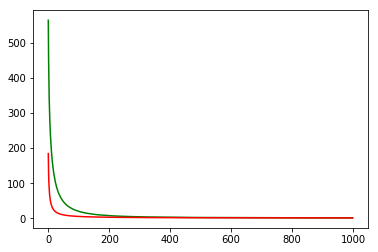

working on d,u and l,le 0.5 256 0.01 0.001


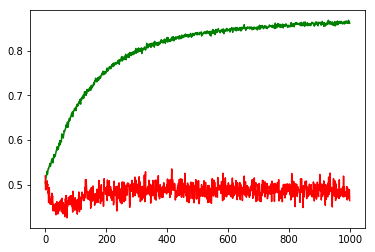

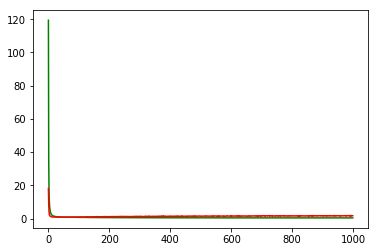

working on d,u and l,le 0.5 256 0.01 0.0001


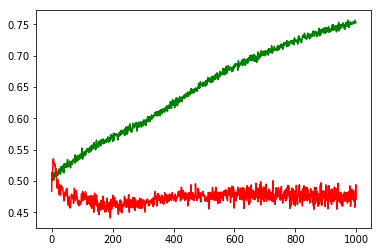

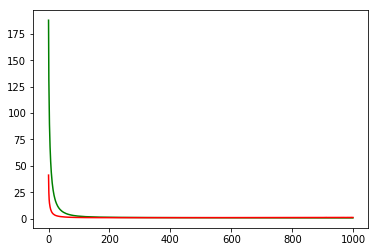

working on d,u and l,le 0.5 256 0.01 1e-05


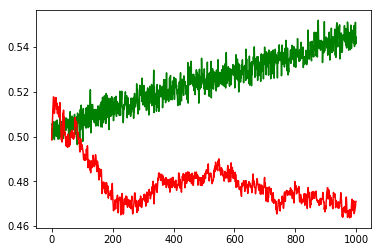

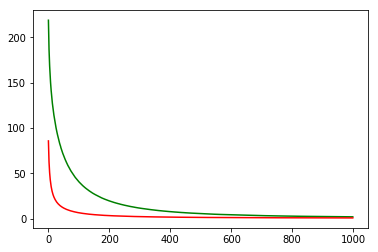

working on d,u and l,le 0.5 256 0.05 0.001


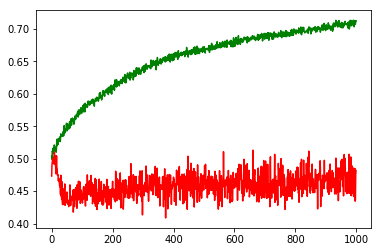

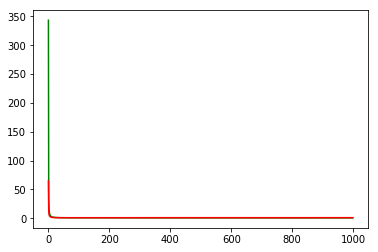

working on d,u and l,le 0.5 256 0.05 0.0001


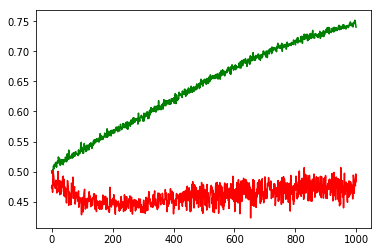

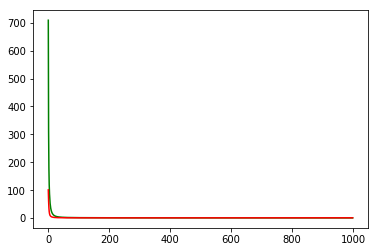

working on d,u and l,le 0.5 256 0.05 1e-05


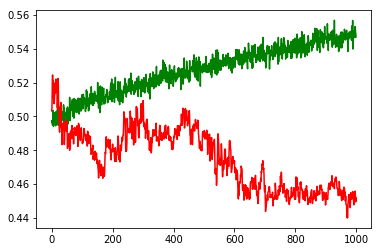

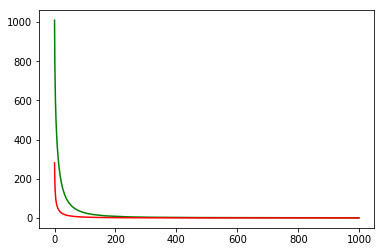

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.0001
Chart for BEST MODEL FOR: AAPL


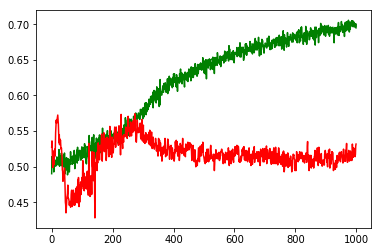

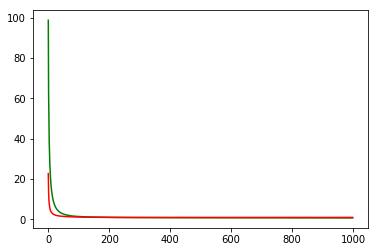

F1,score 0.5667485667485668
G-score: 0.528616343555862
Accuracy 0.5318584077126157
Window: 140
[[255 251]
 [278 346]]
Vol pos 2.761709288568864
Vol neg 3.6426297536336105
Real Percentage of gain: 26.59956508045114
Percentage of gain: -0.23642819224981665
Total gain: -267.1638572422928
000000000000000000000000000000000000000000000000
Percentile:  0
[[201 177]
 [143 232]]
753/753 [==============================] - 0s 30us/step
[0.7060790331873444, 0.5750332009269896]
Percentile:  1
[[20 48]
 [39 45]]
152/152 [==============================] - 0s 42us/step
[1.136665099545529, 0.42763157816309677]
Percentile:  2
[[34 26]
 [33 46]]
139/139 [==============================] - 0s 44us/step
[0.8997941420232649, 0.5755395683453237]
Percentile:  3
[[ 0  0]
 [35 14]]
49/49 [==============================] - 0s 56us/step
[0.8654646131457114, 0.28571429179639235]
Percentile:  4
[[ 0  0]
 [28  7]]
35/35 [==============================] - 0s 107us/step
[1.0423435824257987, 0.2]
00000000000000000000000

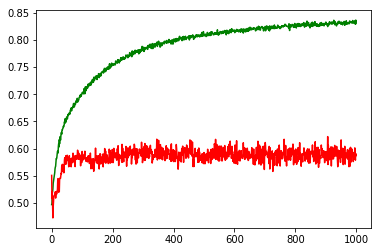

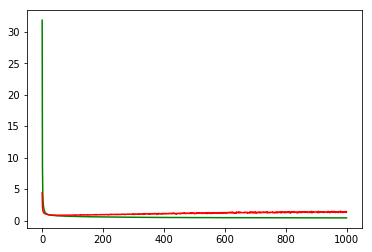

working on d,u and l,le 0.5 64 0.01 0.0001


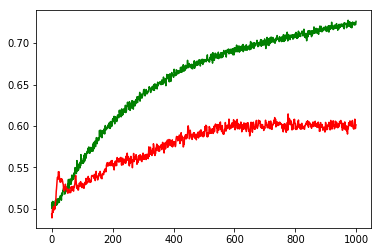

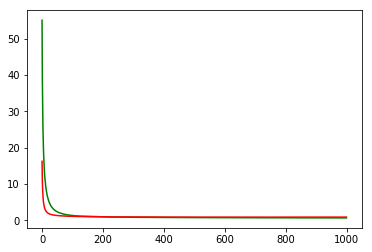

working on d,u and l,le 0.5 64 0.01 1e-05


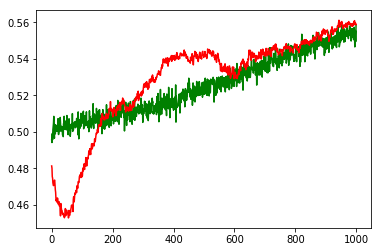

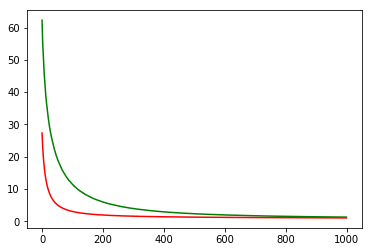

working on d,u and l,le 0.5 64 0.05 0.001


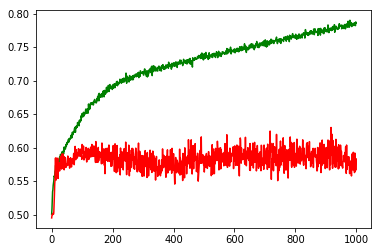

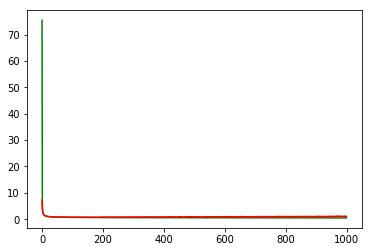

working on d,u and l,le 0.5 64 0.05 0.0001


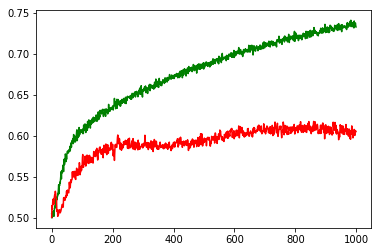

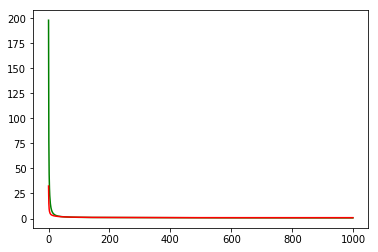

working on d,u and l,le 0.5 64 0.05 1e-05


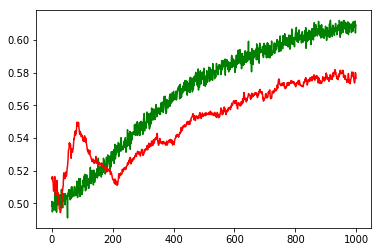

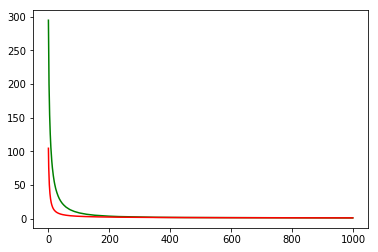

working on d,u and l,le 0.5 128 0.01 0.001


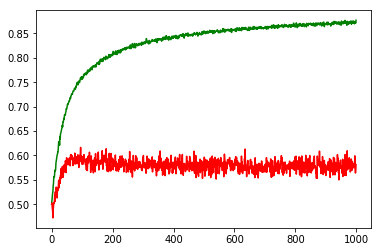

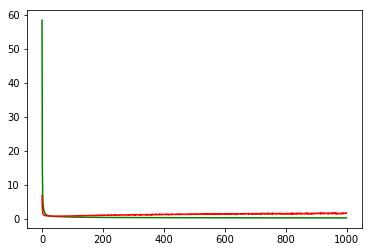

working on d,u and l,le 0.5 128 0.01 0.0001


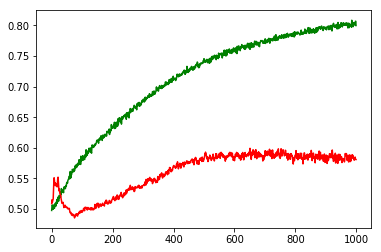

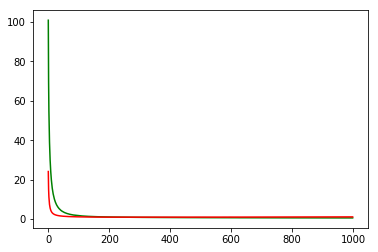

working on d,u and l,le 0.5 128 0.01 1e-05


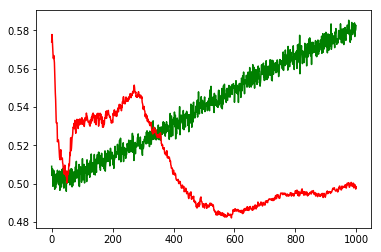

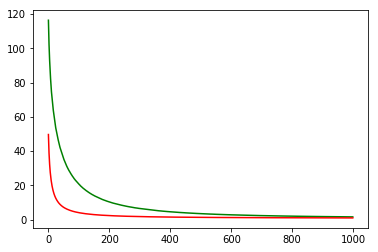

working on d,u and l,le 0.5 128 0.05 0.001


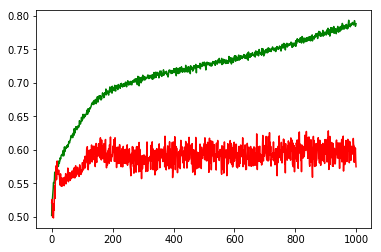

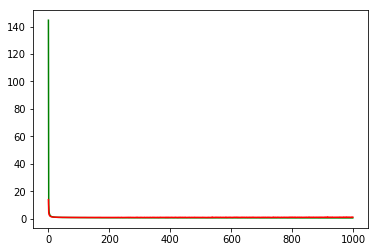

working on d,u and l,le 0.5 128 0.05 0.0001


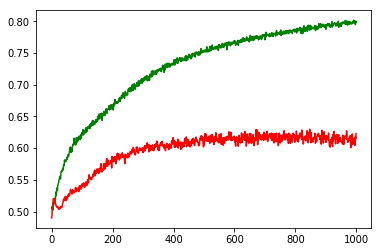

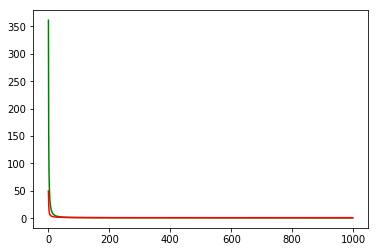

working on d,u and l,le 0.5 128 0.05 1e-05


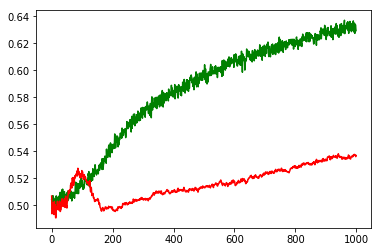

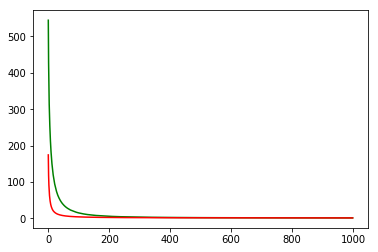

working on d,u and l,le 0.5 256 0.01 0.001


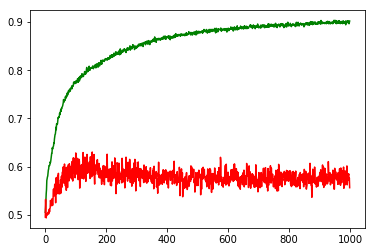

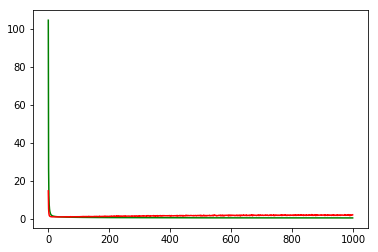

working on d,u and l,le 0.5 256 0.01 0.0001


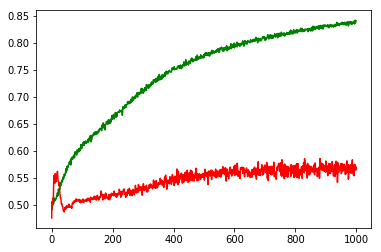

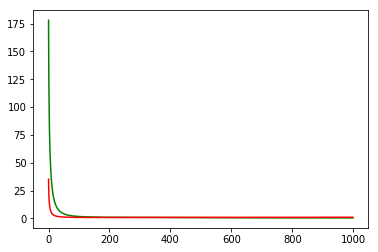

working on d,u and l,le 0.5 256 0.01 1e-05


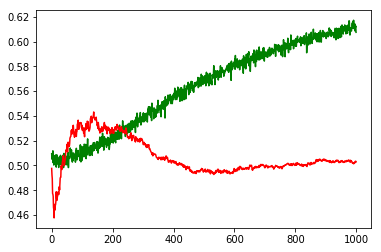

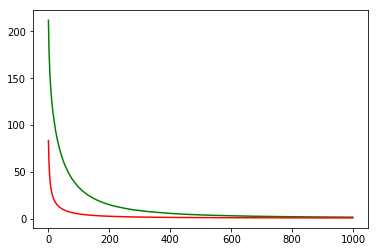

working on d,u and l,le 0.5 256 0.05 0.001


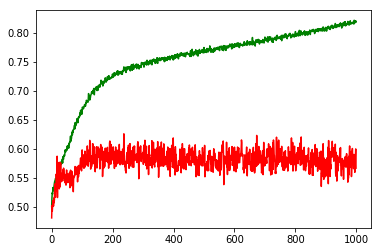

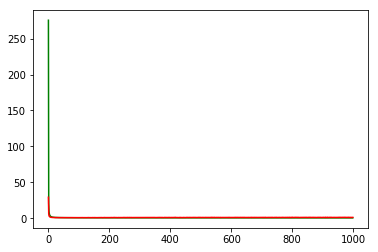

working on d,u and l,le 0.5 256 0.05 0.0001


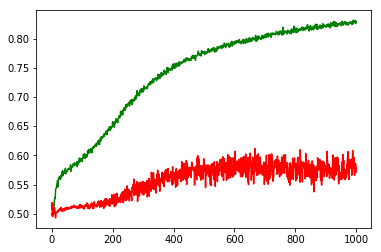

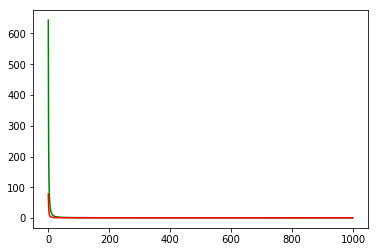

working on d,u and l,le 0.5 256 0.05 1e-05


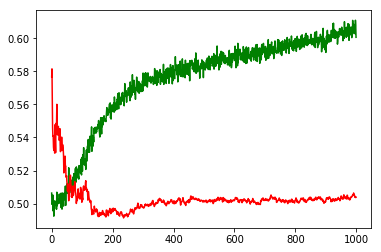

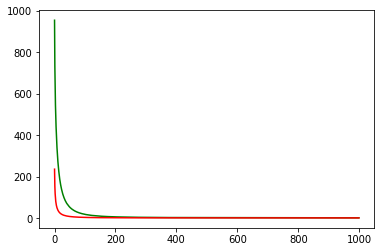

maxd,maxu,maxl,maxle: 0.5 128 0.05 0.0001
Chart for BEST MODEL FOR: AMZN


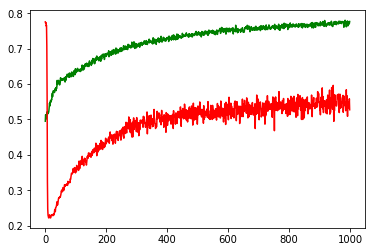

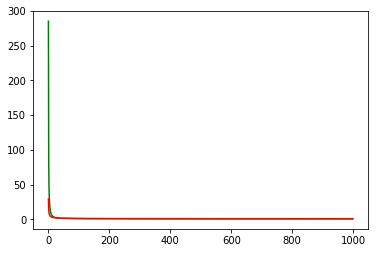

F1,score 0.6317962835512732
G-score: 0.5352061201770525
Accuracy 0.5273851569044296
Window: 140
[[138 113]
 [422 459]]
Vol pos 2.0887406960898747
Vol neg 2.6689205858583747
Real Percentage of gain: 57.058153147026786
Percentage of gain: -0.1598006341595189
Total gain: -180.8943178685754
000000000000000000000000000000000000000000000000
Percentile:  0
[[126  73]
 [191 240]]
630/630 [==============================] - 0s 27us/step
[0.8384511632578714, 0.5809523805739387]
Percentile:  1
[[  3  33]
 [175 174]]
385/385 [==============================] - 0s 41us/step
[0.8776243914257397, 0.4597402597402597]
Percentile:  2
[[ 9  7]
 [20 40]]
76/76 [==============================] - 0s 55us/step
[0.573291866402877, 0.6447368424973989]
Percentile:  3
[[ 0  0]
 [29  4]]
33/33 [==============================] - 0s 95us/step
[1.3160921840956716, 0.12121212121212122]
Percentile:  4
[[0 0]
 [6 0]]
6/6 [==============================] - 0s 128us/step
[1.5253150463104248, 0.0]
00000000000000000000000000

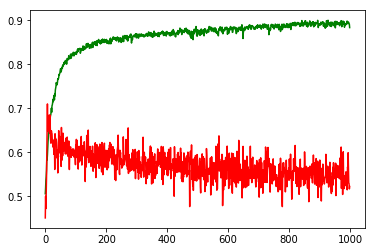

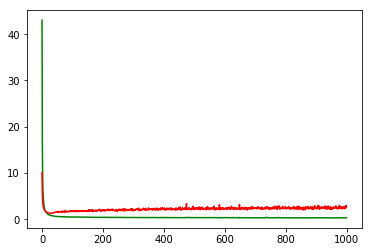

working on d,u and l,le 0.5 64 0.01 0.0001


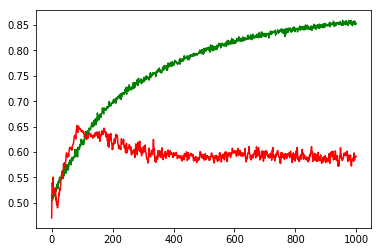

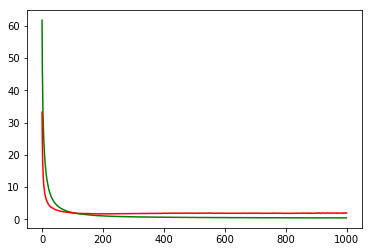

working on d,u and l,le 0.5 64 0.01 1e-05


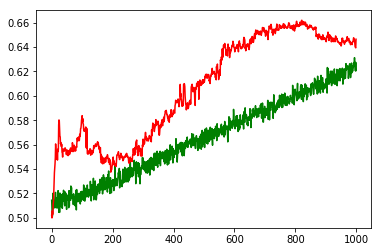

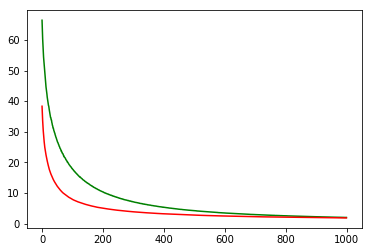

working on d,u and l,le 0.5 64 0.05 0.001


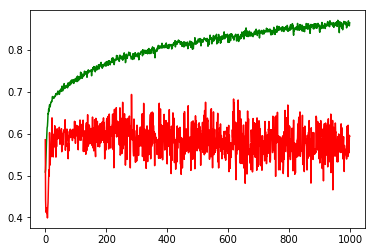

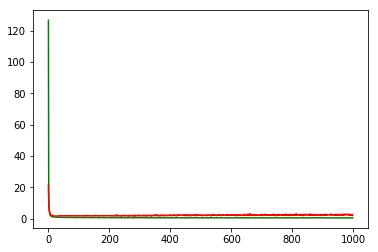

working on d,u and l,le 0.5 64 0.05 0.0001


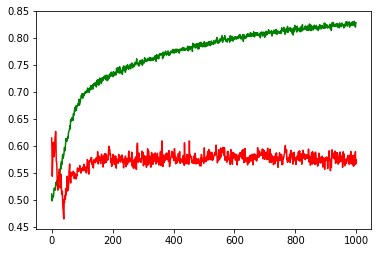

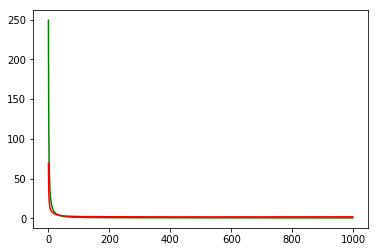

working on d,u and l,le 0.5 64 0.05 1e-05


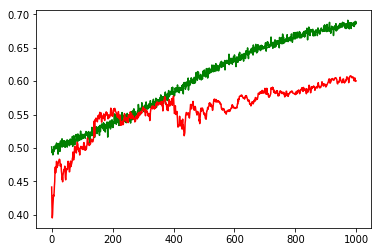

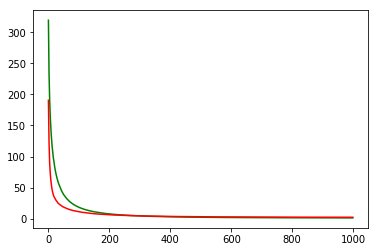

working on d,u and l,le 0.5 128 0.01 0.001


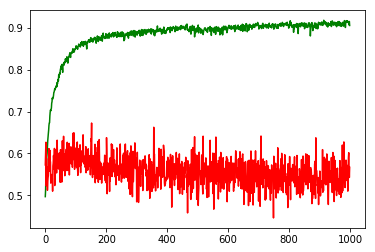

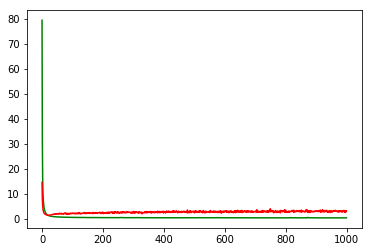

working on d,u and l,le 0.5 128 0.01 0.0001


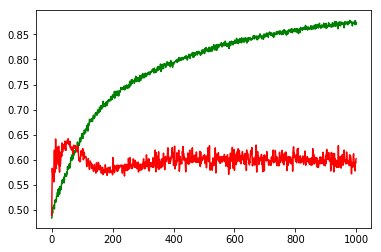

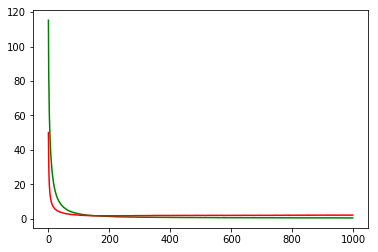

working on d,u and l,le 0.5 128 0.01 1e-05


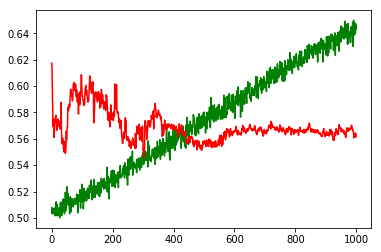

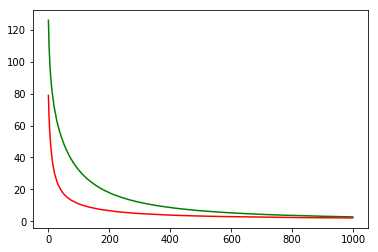

working on d,u and l,le 0.5 128 0.05 0.001


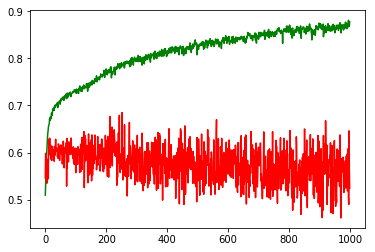

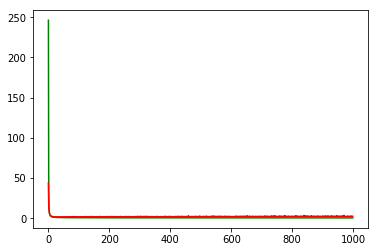

working on d,u and l,le 0.5 128 0.05 0.0001


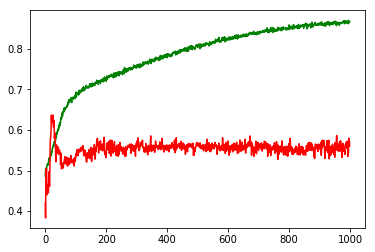

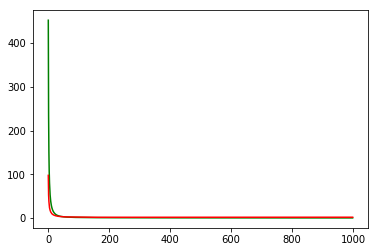

working on d,u and l,le 0.5 128 0.05 1e-05


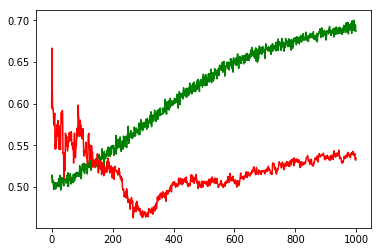

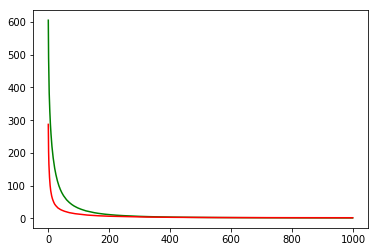

working on d,u and l,le 0.5 256 0.01 0.001


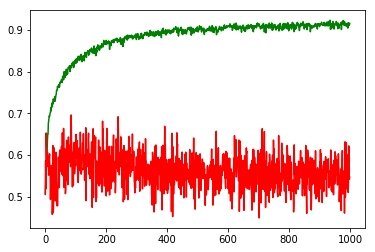

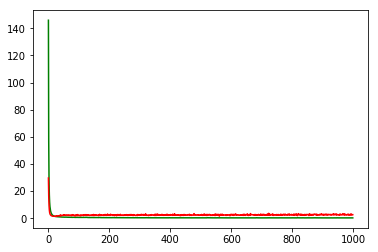

working on d,u and l,le 0.5 256 0.01 0.0001


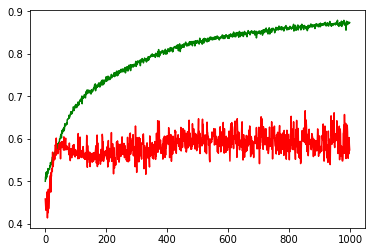

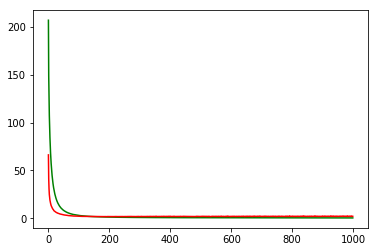

working on d,u and l,le 0.5 256 0.01 1e-05


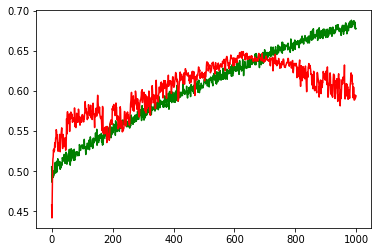

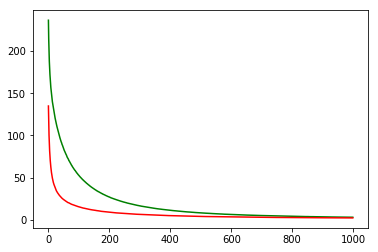

working on d,u and l,le 0.5 256 0.05 0.001


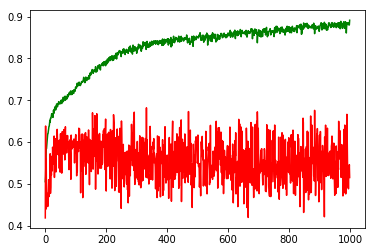

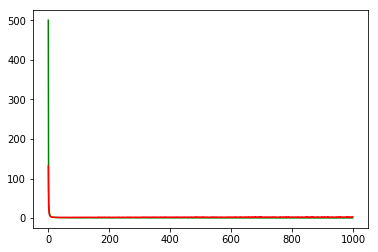

working on d,u and l,le 0.5 256 0.05 0.0001


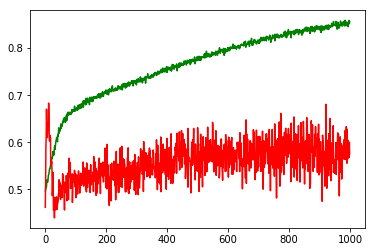

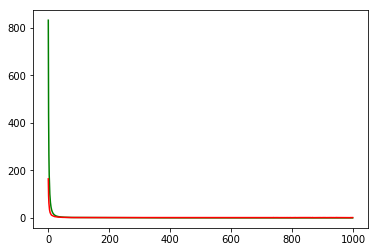

working on d,u and l,le 0.5 256 0.05 1e-05


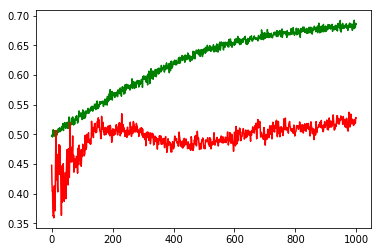

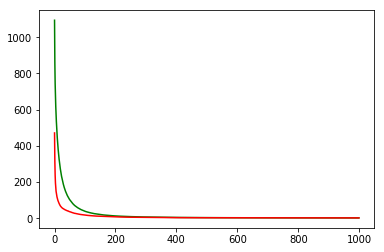

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.001
Chart for BEST MODEL FOR: PEP


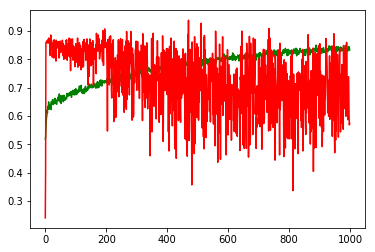

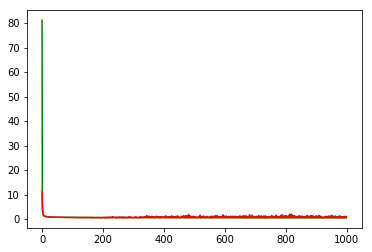

F1,score 0.687005649717514
G-score: 0.646206172658864
Accuracy 0.5745007681407137
Window: 140
[[ 70  21]
 [256 304]]
Vol pos 2.2971622141190537
Vol neg 1.7923942757771434
Real Percentage of gain: 21.884259650665367
Percentage of gain: 0.5570590686486289
Total gain: 362.6454536902574
000000000000000000000000000000000000000000000000
Percentile:  0
[[51 21]
 [53 57]]
182/182 [==============================] - 0s 28us/step
[0.7152459857228038, 0.5934065934065934]
Percentile:  1
[[19  0]
 [90 52]]
161/161 [==============================] - 0s 32us/step
[0.9549561664924858, 0.4409937888198758]
Percentile:  2
[[  0   0]
 [102  84]]
186/186 [==============================] - 0s 36us/step
[1.1972112277502656, 0.45161290130307596]
Percentile:  3
[[ 0  0]
 [10 66]]
76/76 [==============================] - 0s 35us/step
[0.33594000084619774, 0.868421052631579]
Percentile:  4
[[ 0  0]
 [ 0 45]]
45/45 [==============================] - 0s 48us/step
[0.04601455471581883, 1.0]
0000000000000000000000000

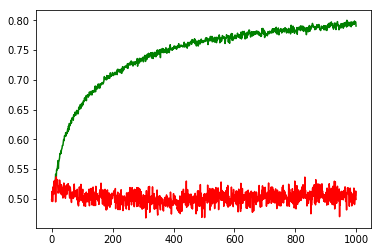

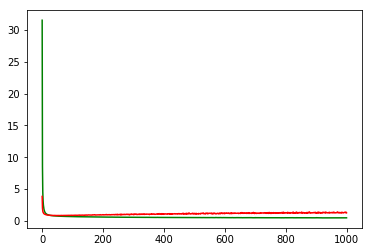

working on d,u and l,le 0.5 64 0.01 0.0001


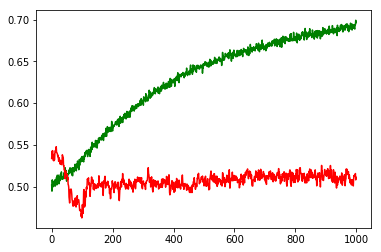

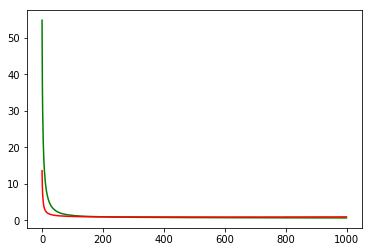

working on d,u and l,le 0.5 64 0.01 1e-05


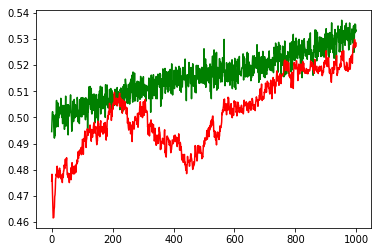

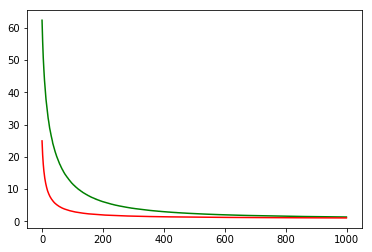

working on d,u and l,le 0.5 64 0.05 0.001


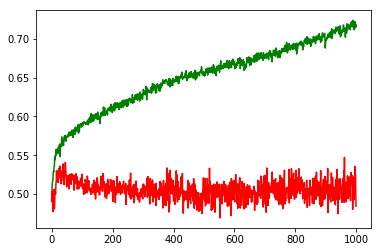

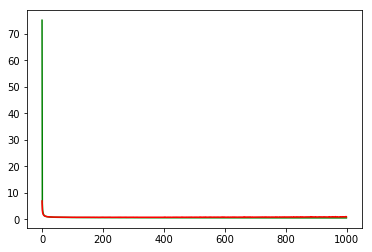

working on d,u and l,le 0.5 64 0.05 0.0001


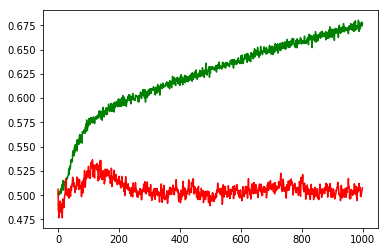

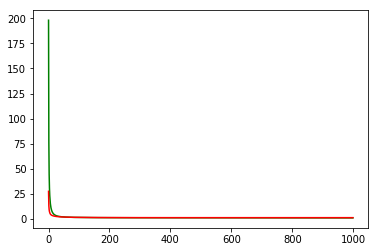

working on d,u and l,le 0.5 64 0.05 1e-05


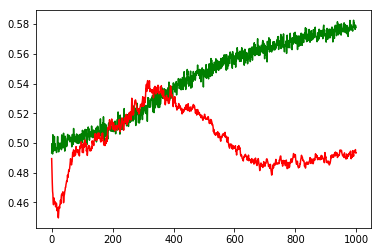

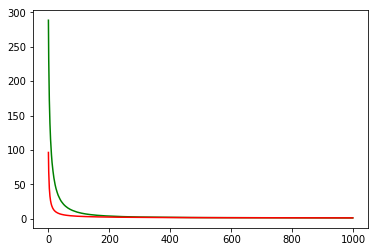

working on d,u and l,le 0.5 128 0.01 0.001


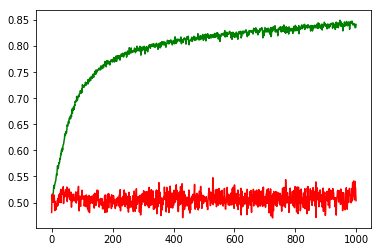

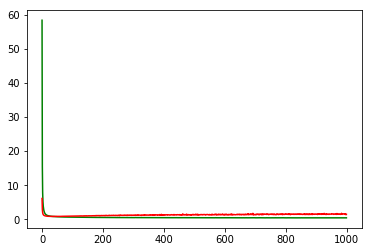

working on d,u and l,le 0.5 128 0.01 0.0001


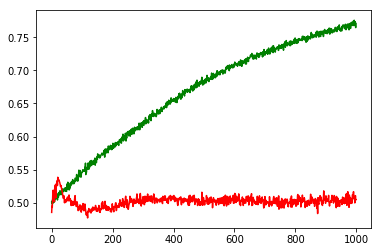

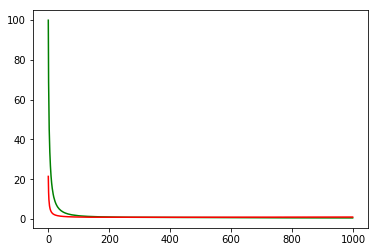

working on d,u and l,le 0.5 128 0.01 1e-05


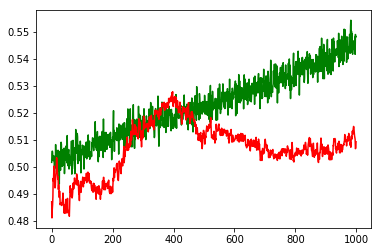

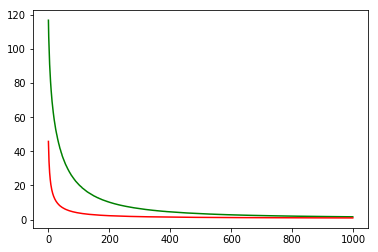

working on d,u and l,le 0.5 128 0.05 0.001


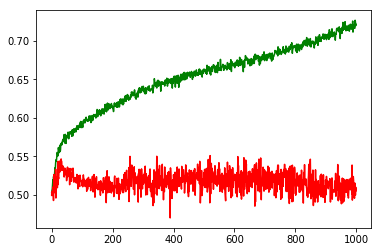

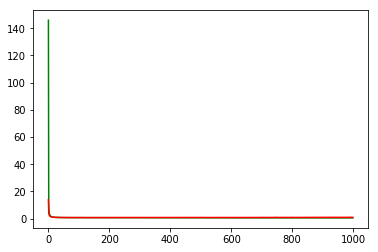

working on d,u and l,le 0.5 128 0.05 0.0001


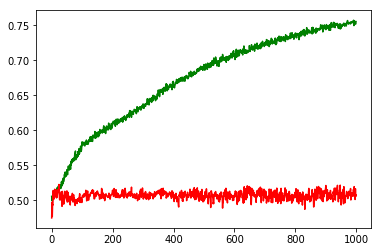

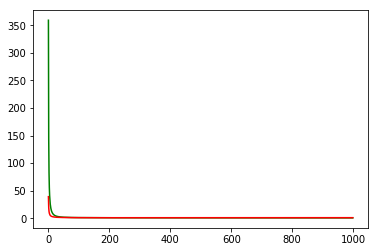

working on d,u and l,le 0.5 128 0.05 1e-05


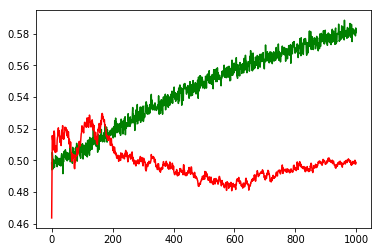

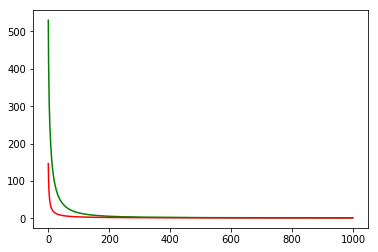

working on d,u and l,le 0.5 256 0.01 0.001


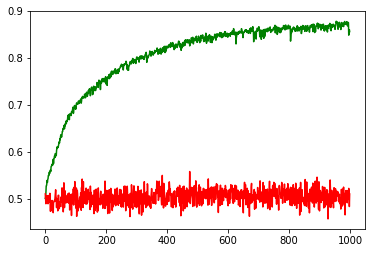

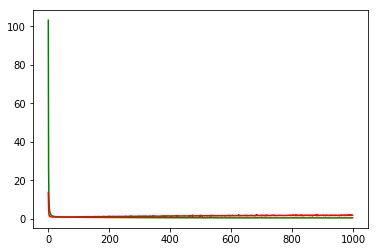

working on d,u and l,le 0.5 256 0.01 0.0001


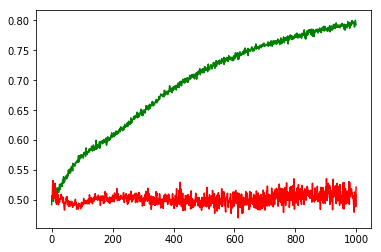

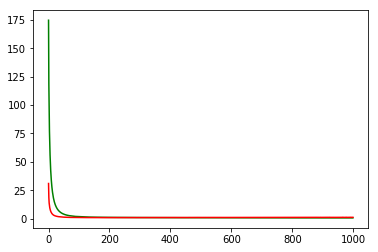

working on d,u and l,le 0.5 256 0.01 1e-05


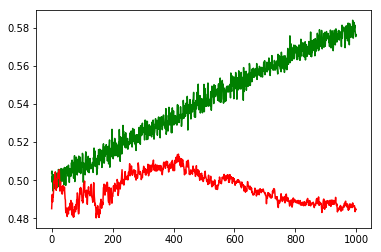

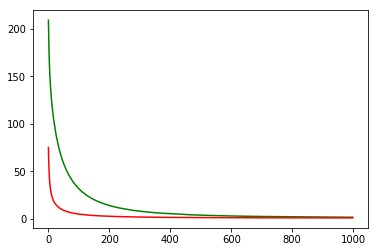

working on d,u and l,le 0.5 256 0.05 0.001


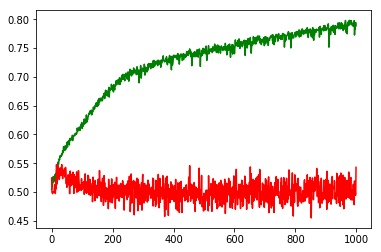

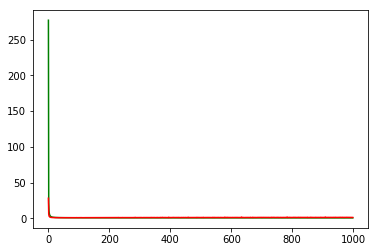

working on d,u and l,le 0.5 256 0.05 0.0001


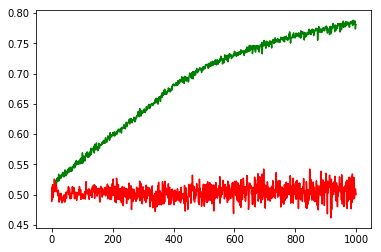

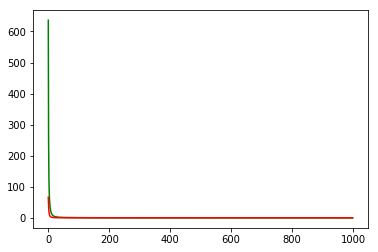

working on d,u and l,le 0.5 256 0.05 1e-05


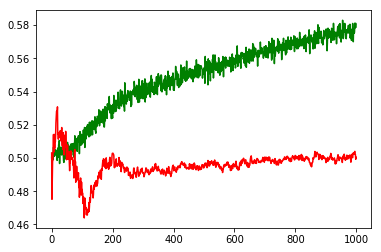

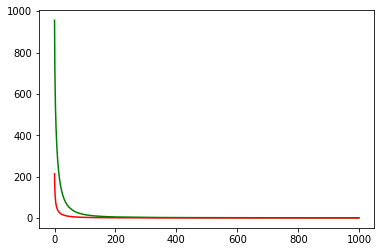

maxd,maxu,maxl,maxle: 0.5 256 0.05 0.001
Chart for BEST MODEL FOR: GOOGL


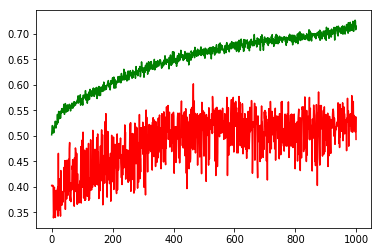

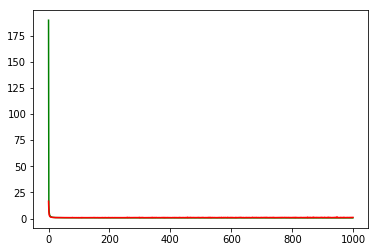

F1,score 0.42985074626865666
G-score: 0.4897184658803217
Accuracy 0.49292035208339186
Window: 140
[[341 114]
 [459 216]]
Vol pos 2.777108301436409
Vol neg 3.128500809037276
Real Percentage of gain: -25.061826121396383
Percentage of gain: -0.21750587582148637
Total gain: -245.7816396782796
000000000000000000000000000000000000000000000000
Percentile:  0
[[170  62]
 [138  41]]
411/411 [==============================] - 0s 31us/step
[0.8571129740009633, 0.5133819944087026]
Percentile:  1
[[ 87  24]
 [149 103]]
363/363 [==============================] - 0s 38us/step
[1.0618354558287901, 0.5234159783719328]
Percentile:  2
[[77 20]
 [84 25]]
206/206 [==============================] - 0s 41us/step
[1.3822077721068002, 0.4951456304892753]
Percentile:  3
[[ 6  8]
 [60 27]]
101/101 [==============================] - 0s 58us/step
[1.3284027482023333, 0.32673267326732675]
Percentile:  4
[[ 0  0]
 [27 20]]
47/47 [==============================] - 0s 83us/step
[0.7594082621817894, 0.42553191806407686

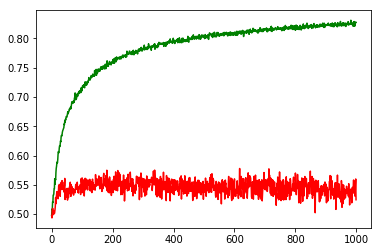

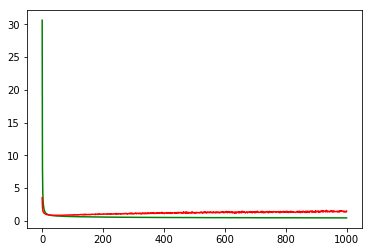

working on d,u and l,le 0.5 64 0.01 0.0001


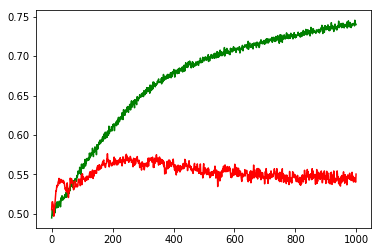

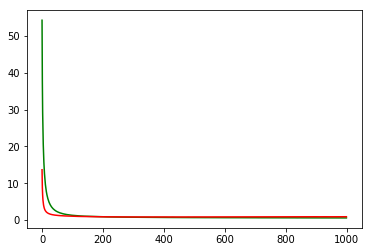

working on d,u and l,le 0.5 64 0.01 1e-05


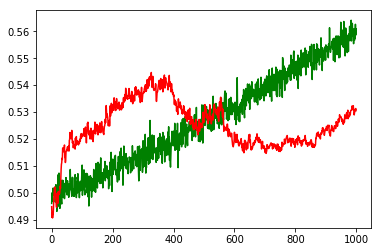

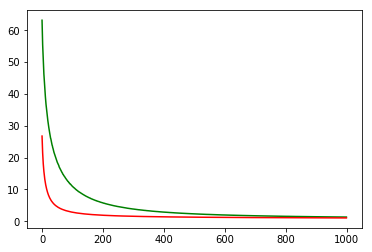

working on d,u and l,le 0.5 64 0.05 0.001


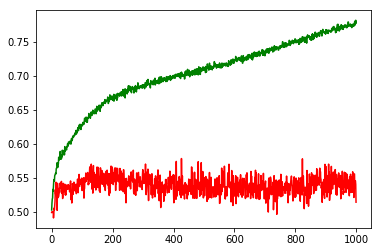

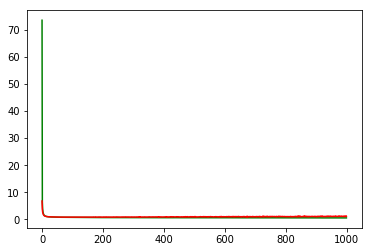

working on d,u and l,le 0.5 64 0.05 0.0001


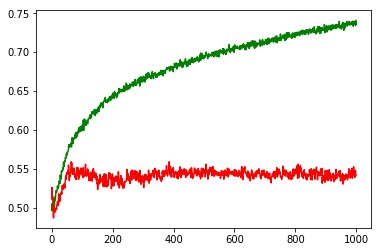

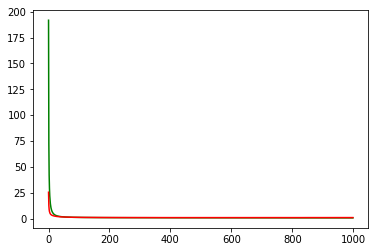

working on d,u and l,le 0.5 64 0.05 1e-05


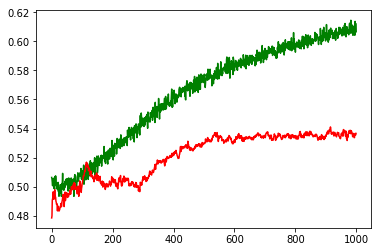

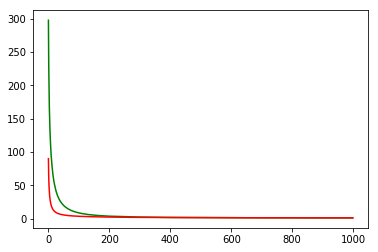

working on d,u and l,le 0.5 128 0.01 0.001


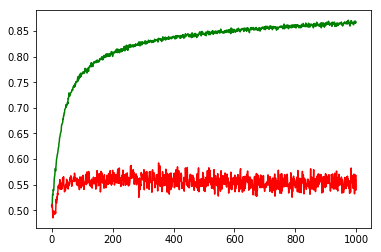

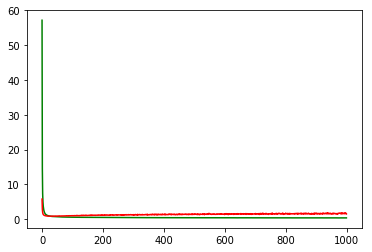

working on d,u and l,le 0.5 128 0.01 0.0001


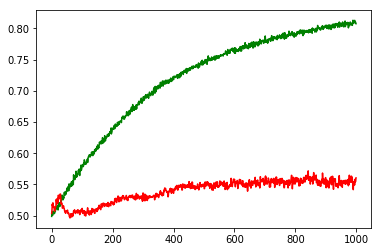

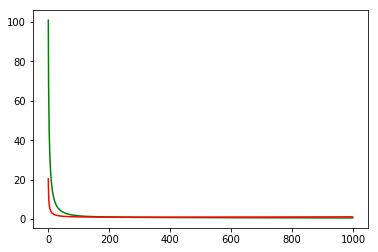

working on d,u and l,le 0.5 128 0.01 1e-05


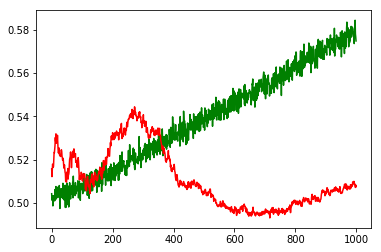

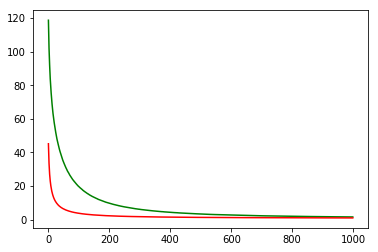

working on d,u and l,le 0.5 128 0.05 0.001


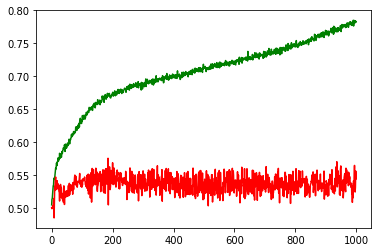

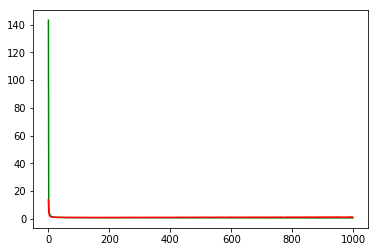

working on d,u and l,le 0.5 128 0.05 0.0001


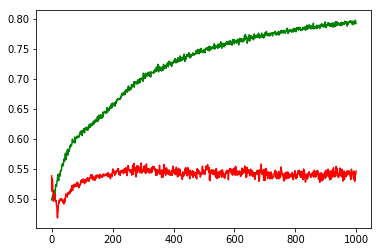

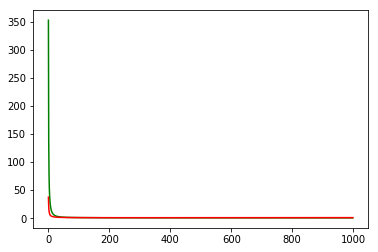

working on d,u and l,le 0.5 128 0.05 1e-05


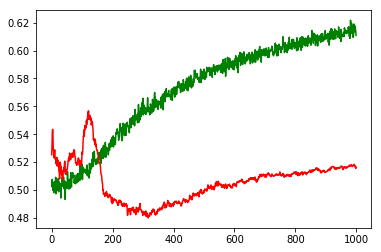

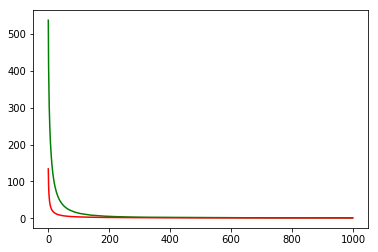

working on d,u and l,le 0.5 256 0.01 0.001


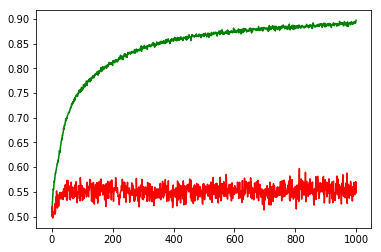

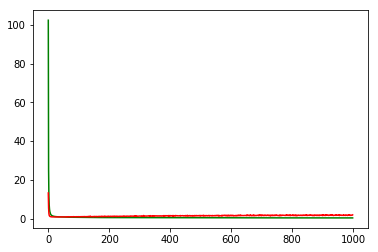

working on d,u and l,le 0.5 256 0.01 0.0001


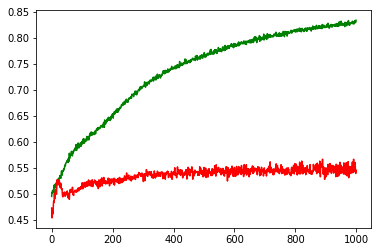

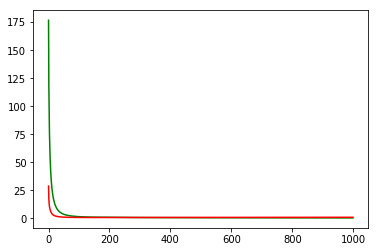

working on d,u and l,le 0.5 256 0.01 1e-05


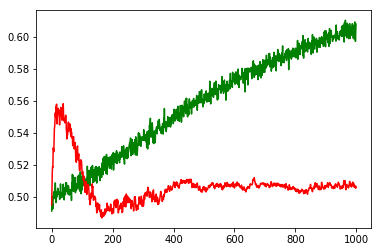

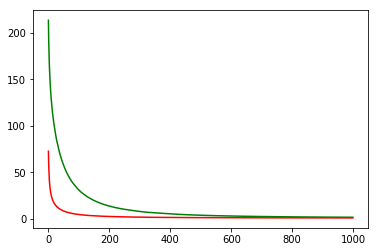

working on d,u and l,le 0.5 256 0.05 0.001


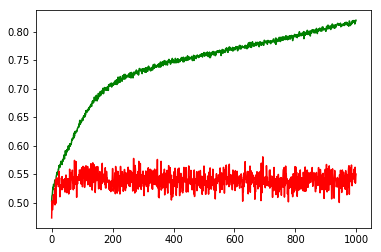

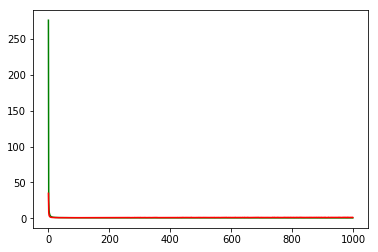

working on d,u and l,le 0.5 256 0.05 0.0001


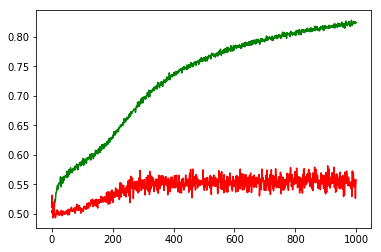

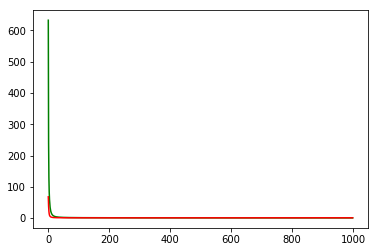

working on d,u and l,le 0.5 256 0.05 1e-05


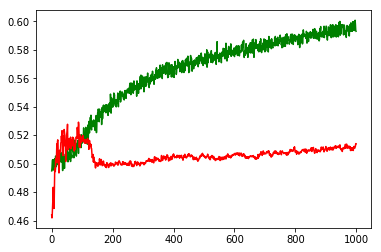

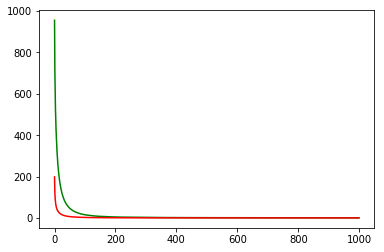

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.0001
Chart for BEST MODEL FOR: MSFT


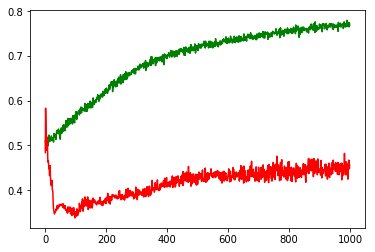

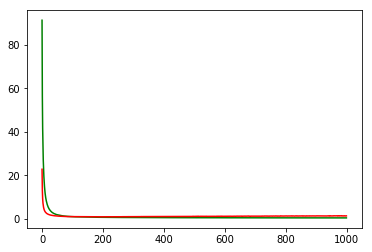

F1,score 0.5351473922902494
G-score: 0.4373939354630049
Accuracy 0.4557522118619058
Window: 140
[[161 258]
 [357 354]]
Vol pos 1.4811436564773166
Vol neg 1.653797512871932
Real Percentage of gain: 11.080409058104232
Percentage of gain: -0.22504113923046035
Total gain: -254.29648733042018
000000000000000000000000000000000000000000000000
Percentile:  0
[[117 175]
 [102 150]]
544/544 [==============================] - 0s 27us/step
[1.19327352327459, 0.49080882352941174]
Percentile:  1
[[ 31  43]
 [127 112]]
313/313 [==============================] - 0s 29us/step
[1.052571462747007, 0.45686900806122316]
Percentile:  2
[[ 9 14]
 [92 48]]
163/163 [==============================] - 0s 42us/step
[1.3089623048992975, 0.3496932515337423]
Percentile:  3
[[ 3 17]
 [32 29]]
81/81 [==============================] - 0s 37us/step
[3.288932815010165, 0.3950617283950617]
Percentile:  4
[[ 1  9]
 [ 4 14]]
28/28 [==============================] - 0s 23us/step
[3.6514036655426025, 0.5357142686843872]
00000

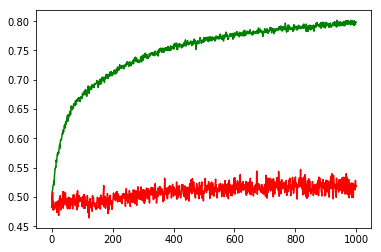

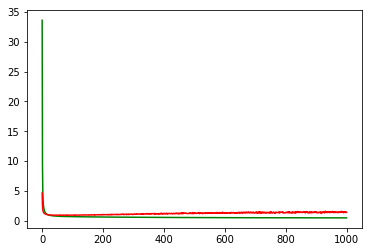

working on d,u and l,le 0.5 64 0.01 0.0001


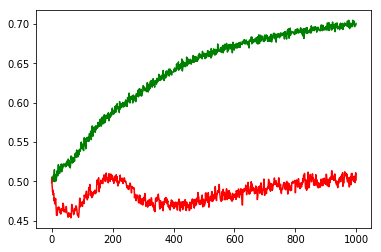

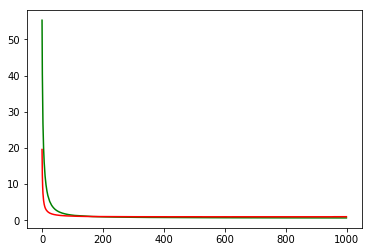

working on d,u and l,le 0.5 64 0.01 1e-05


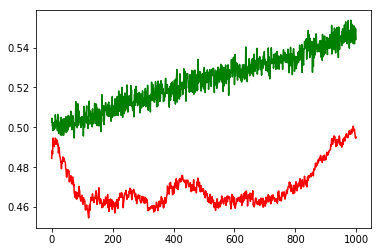

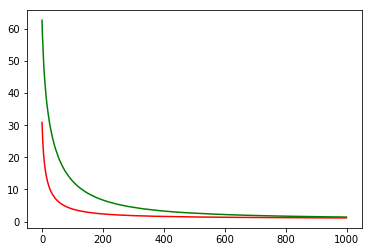

working on d,u and l,le 0.5 64 0.05 0.001


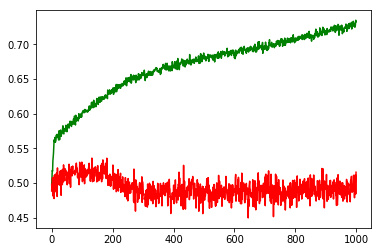

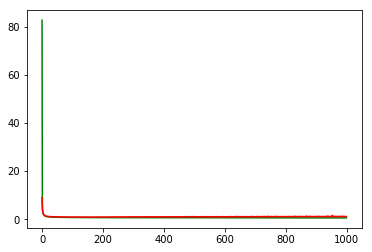

working on d,u and l,le 0.5 64 0.05 0.0001


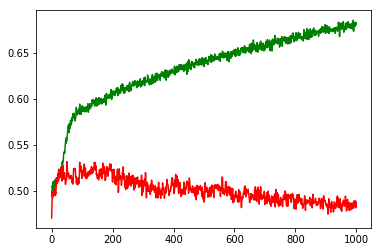

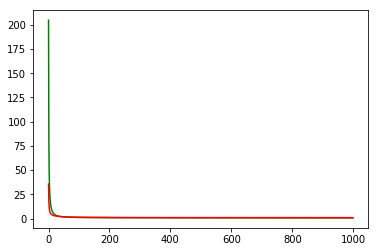

working on d,u and l,le 0.5 64 0.05 1e-05


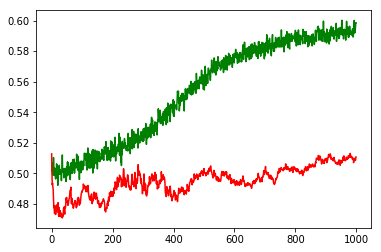

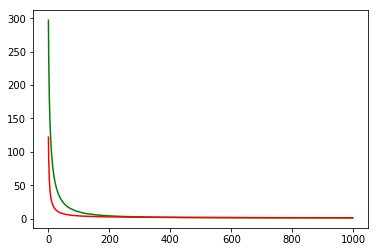

working on d,u and l,le 0.5 128 0.01 0.001


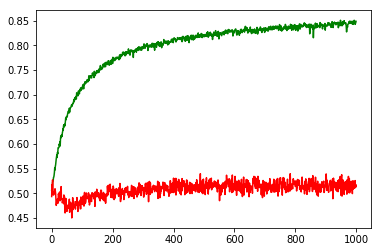

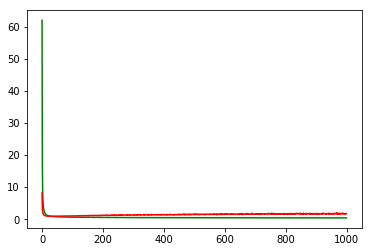

working on d,u and l,le 0.5 128 0.01 0.0001


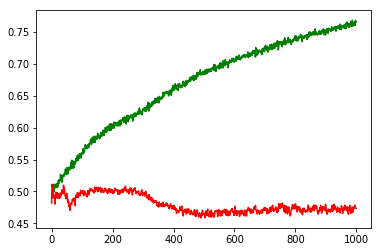

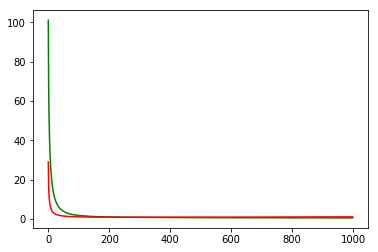

working on d,u and l,le 0.5 128 0.01 1e-05


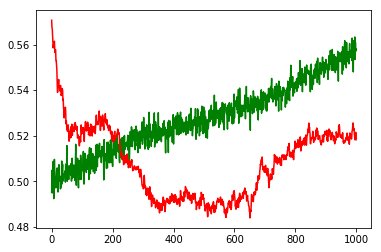

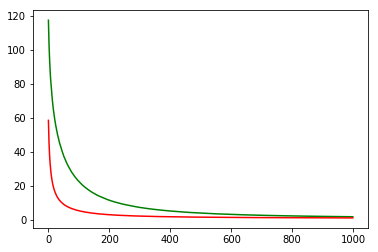

working on d,u and l,le 0.5 128 0.05 0.001


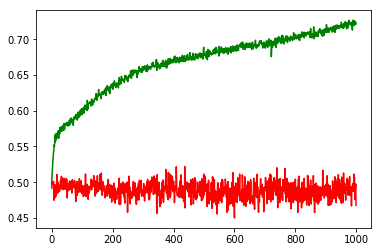

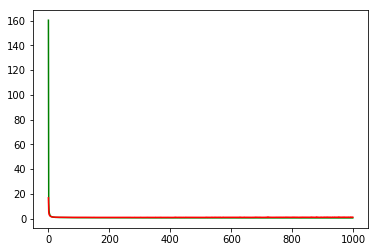

working on d,u and l,le 0.5 128 0.05 0.0001


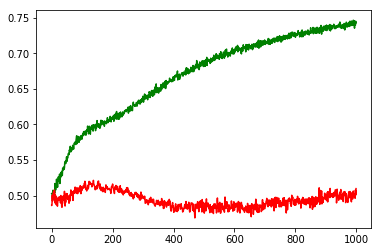

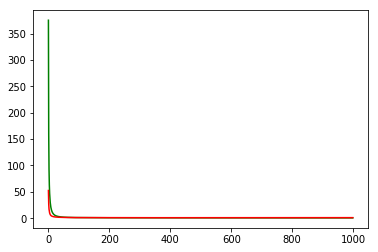

working on d,u and l,le 0.5 128 0.05 1e-05


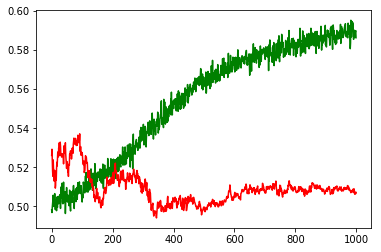

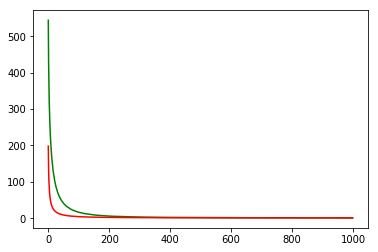

working on d,u and l,le 0.5 256 0.01 0.001


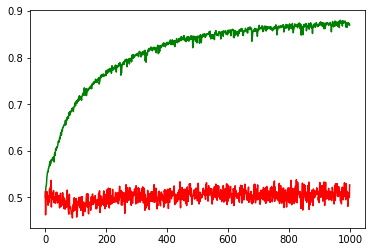

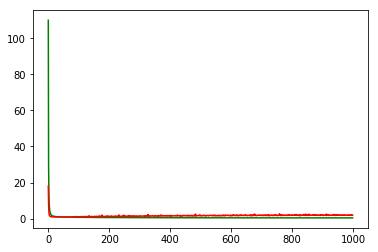

working on d,u and l,le 0.5 256 0.01 0.0001


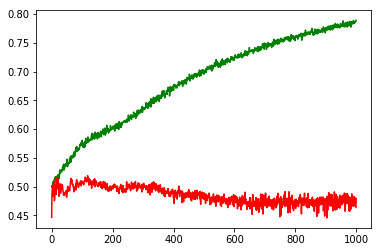

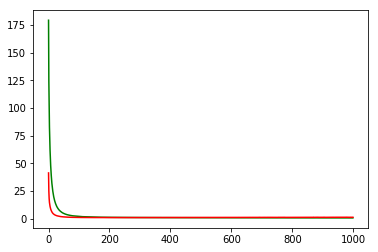

working on d,u and l,le 0.5 256 0.01 1e-05


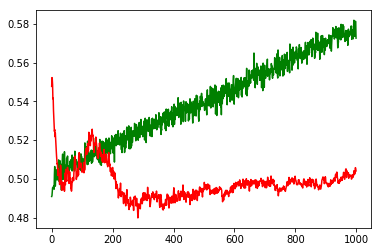

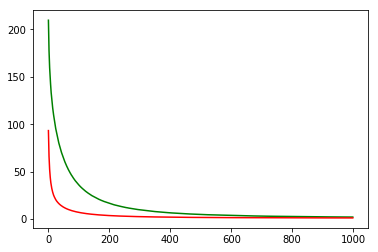

working on d,u and l,le 0.5 256 0.05 0.001


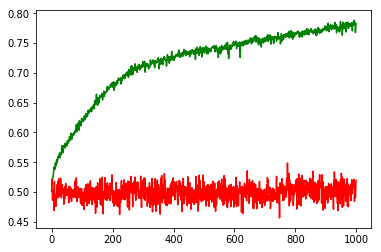

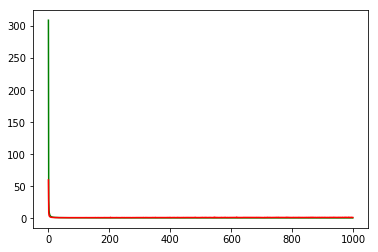

working on d,u and l,le 0.5 256 0.05 0.0001


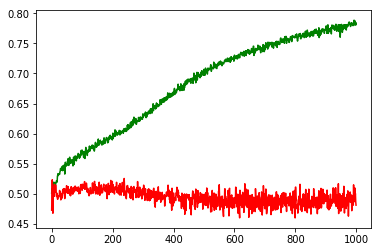

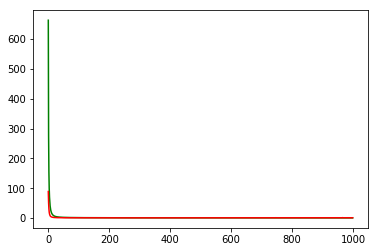

working on d,u and l,le 0.5 256 0.05 1e-05


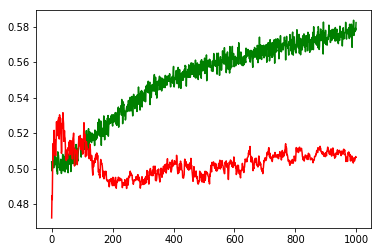

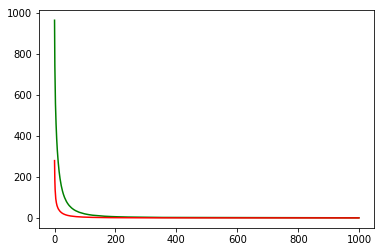

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.001
Chart for BEST MODEL FOR: FB


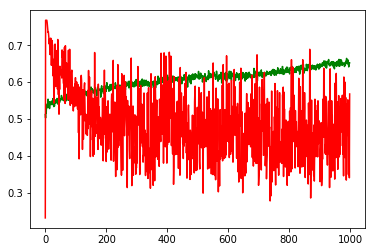

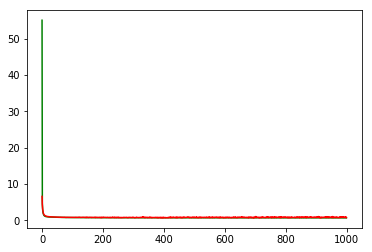

F1,score 0.6746506986027945
G-score: 0.5492697369170643
Accuracy 0.5680212028877474
Window: 140
[[136 127]
 [362 507]]
Vol pos 3.0148065693208164
Vol neg 3.160330420256933
Real Percentage of gain: 59.259371962161815
Percentage of gain: 0.34727831145551635
Total gain: 393.11904856764454
000000000000000000000000000000000000000000000000
Percentile:  0
[[105 107]
 [118 192]]
522/522 [==============================] - 0s 29us/step
[0.7761959492931878, 0.5689655172413793]
Percentile:  1
[[ 20  17]
 [164 267]]
468/468 [==============================] - 0s 28us/step
[0.5520471385401539, 0.6132478632478633]
Percentile:  2
[[10  3]
 [64 28]]
105/105 [==============================] - 0s 39us/step
[0.8768258066404433, 0.3619047621885935]
Percentile:  3
[[0 0]
 [8 6]]
14/14 [==============================] - 0s 70us/step
[0.706894040107727, 0.4285714328289032]
Percentile:  4
[[ 0  0]
 [ 7 14]]
21/21 [==============================] - 0s 72us/step
[0.5349487662315369, 0.6666666865348816]
0000000000

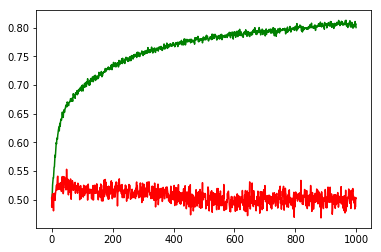

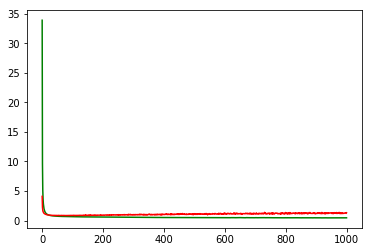

working on d,u and l,le 0.5 64 0.01 0.0001


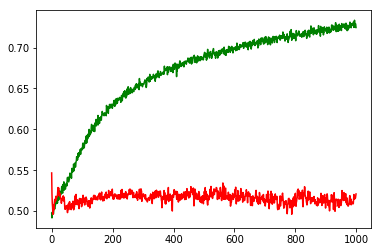

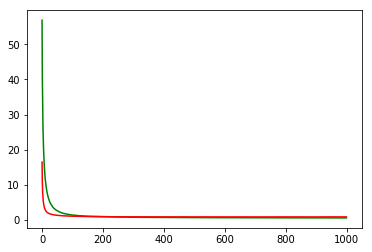

working on d,u and l,le 0.5 64 0.01 1e-05


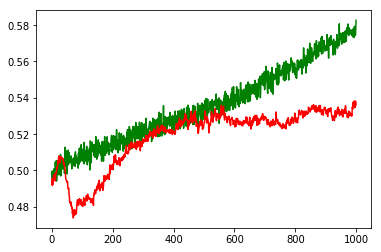

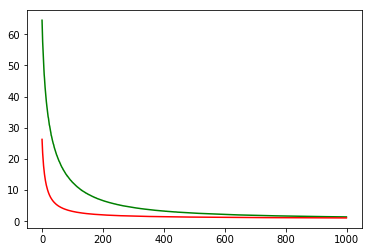

working on d,u and l,le 0.5 64 0.05 0.001


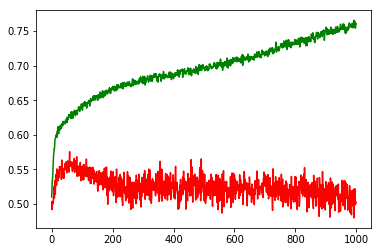

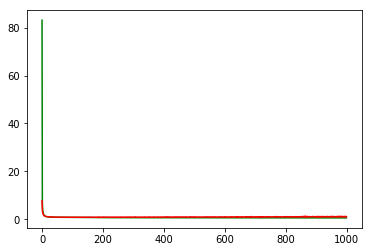

working on d,u and l,le 0.5 64 0.05 0.0001


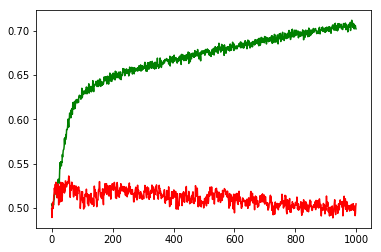

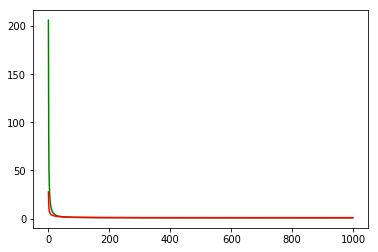

working on d,u and l,le 0.5 64 0.05 1e-05


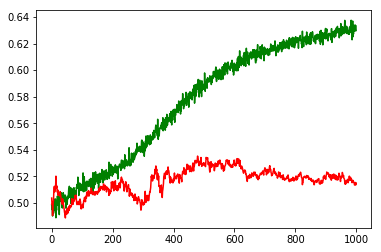

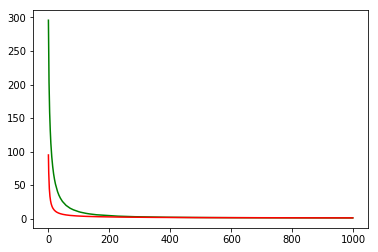

working on d,u and l,le 0.5 128 0.01 0.001


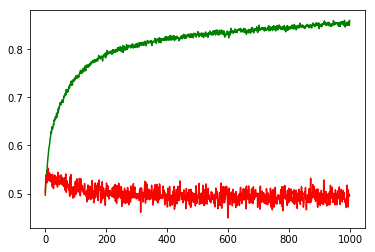

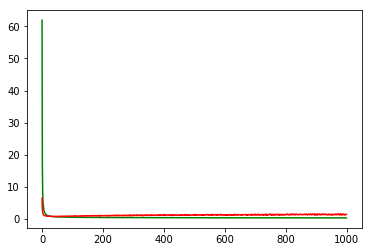

working on d,u and l,le 0.5 128 0.01 0.0001


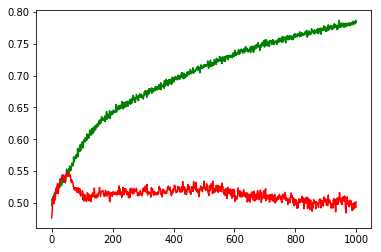

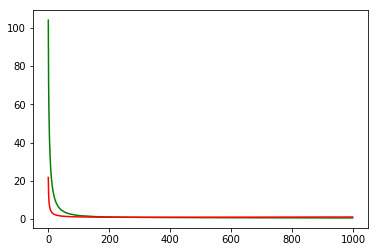

working on d,u and l,le 0.5 128 0.01 1e-05


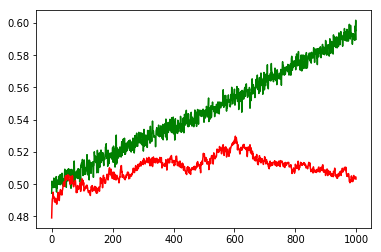

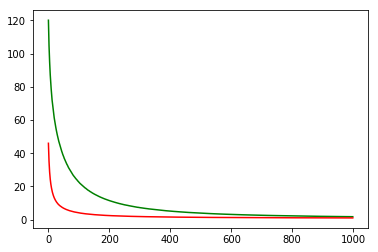

working on d,u and l,le 0.5 128 0.05 0.001


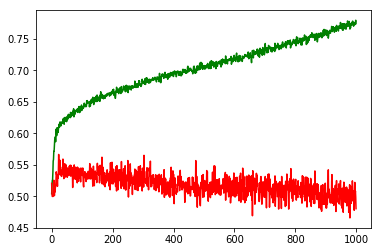

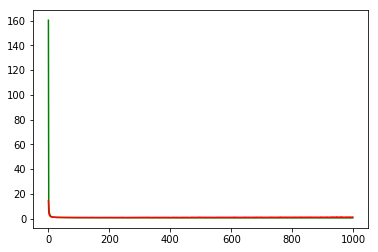

working on d,u and l,le 0.5 128 0.05 0.0001


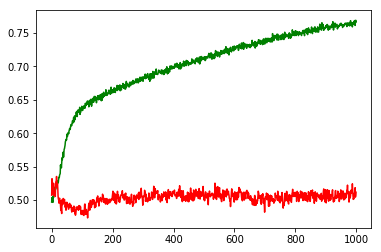

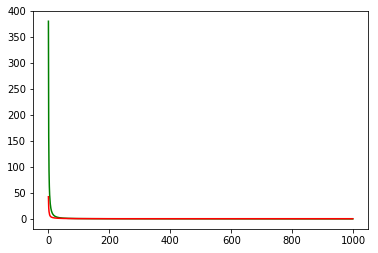

working on d,u and l,le 0.5 128 0.05 1e-05


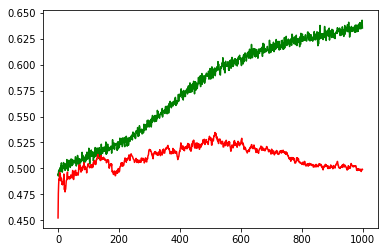

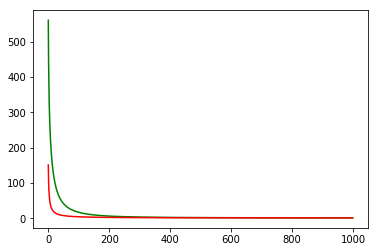

working on d,u and l,le 0.5 256 0.01 0.001


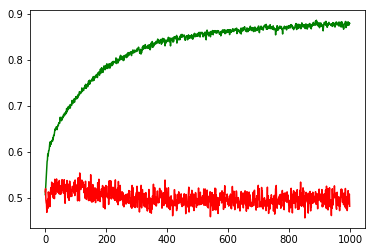

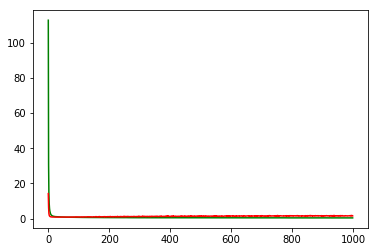

working on d,u and l,le 0.5 256 0.01 0.0001


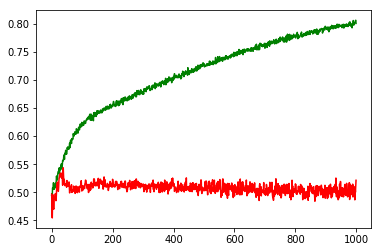

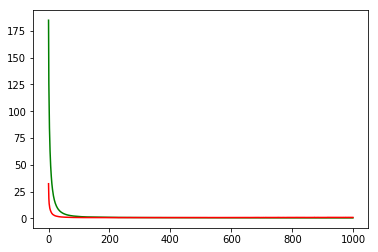

working on d,u and l,le 0.5 256 0.01 1e-05


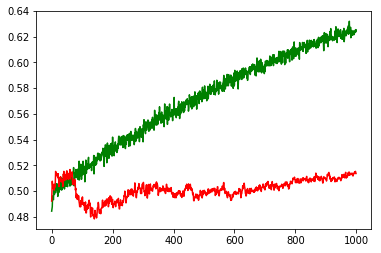

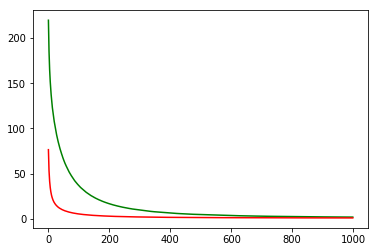

working on d,u and l,le 0.5 256 0.05 0.001


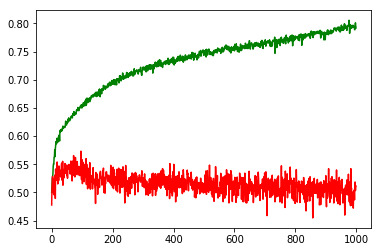

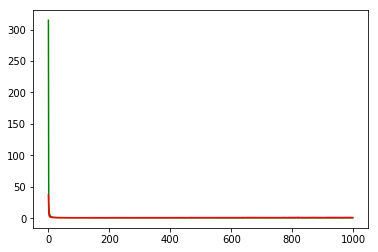

working on d,u and l,le 0.5 256 0.05 0.0001


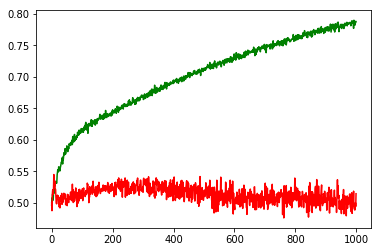

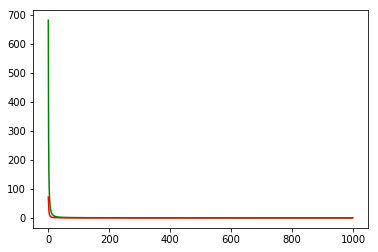

working on d,u and l,le 0.5 256 0.05 1e-05


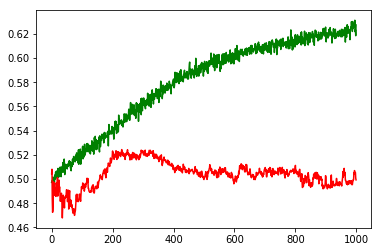

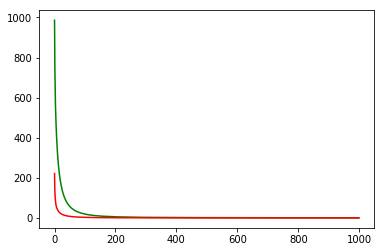

maxd,maxu,maxl,maxle: 0.5 64 0.01 0.0001
Chart for BEST MODEL FOR: INTC


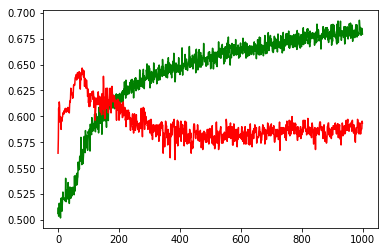

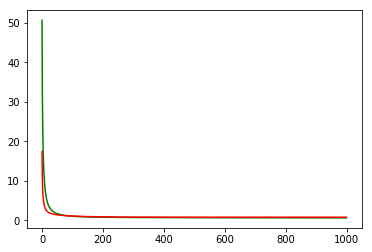

F1,score 0.6325878594249201
G-score: 0.5972210079449878
Accuracy 0.5936395776566684
Window: 140
[[276 172]
 [288 396]]
Vol pos 2.429901295339582
Vol neg 2.184985828054971
Real Percentage of gain: 75.00147589219752
Percentage of gain: 0.5545938070343752
Total gain: 627.8001895629128
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 78  38]
 [123 115]]
354/354 [==============================] - 0s 26us/step
[0.8042684173853384, 0.5451977401129944]
Percentile:  1
[[ 69  45]
 [ 88 140]]
342/342 [==============================] - 0s 21us/step
[0.6538349839678982, 0.611111110762546]
Percentile:  2
[[66 61]
 [53 98]]
278/278 [==============================] - 0s 37us/step
[0.7706170476597848, 0.5899280571251464]
Percentile:  3
[[41 22]
 [14 37]]
114/114 [==============================] - 0s 45us/step
[0.7277823676142776, 0.6842105242243984]
Percentile:  4
[[22  6]
 [ 9  5]]
42/42 [==============================] - 0s 54us/step
[0.6796479296116602, 0.6428571400188264]
00000000

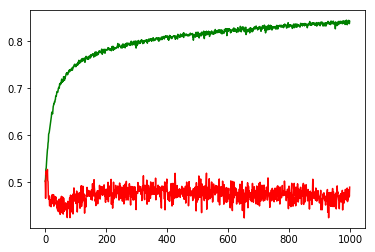

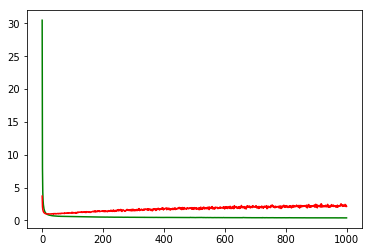

working on d,u and l,le 0.5 64 0.01 0.0001


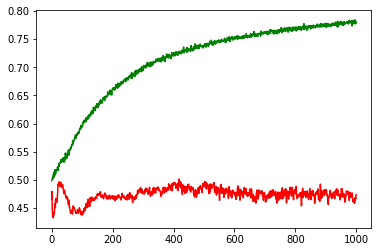

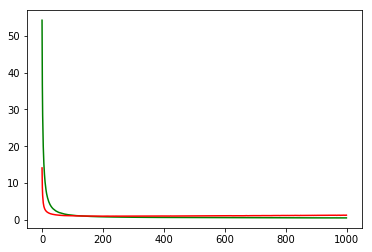

working on d,u and l,le 0.5 64 0.01 1e-05


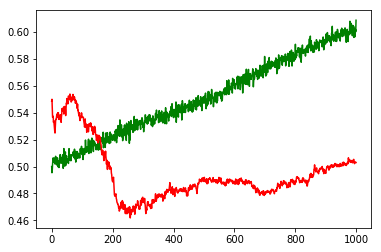

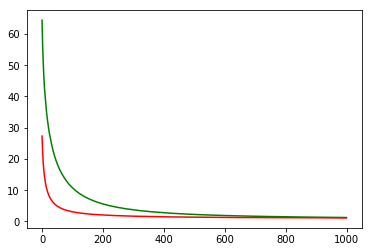

working on d,u and l,le 0.5 64 0.05 0.001


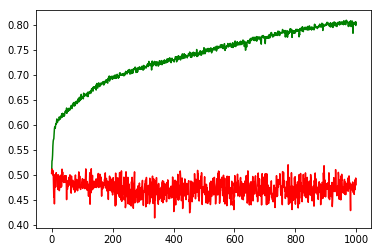

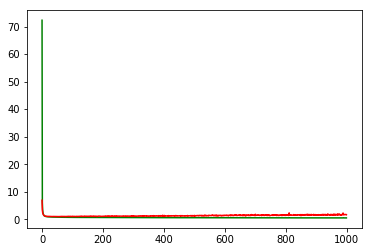

working on d,u and l,le 0.5 64 0.05 0.0001


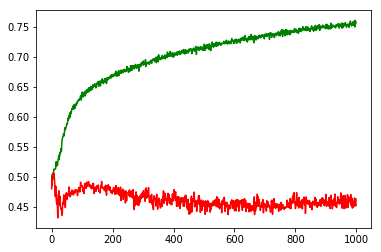

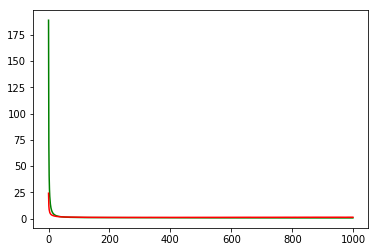

working on d,u and l,le 0.5 64 0.05 1e-05


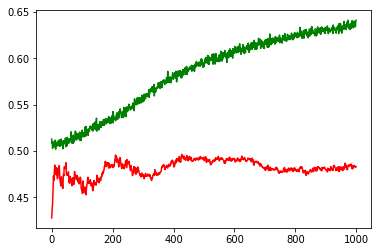

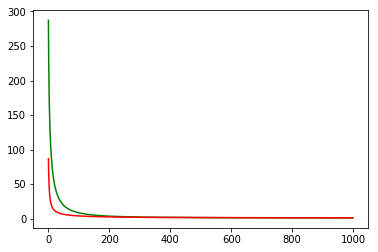

working on d,u and l,le 0.5 128 0.01 0.001


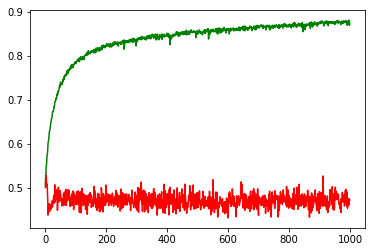

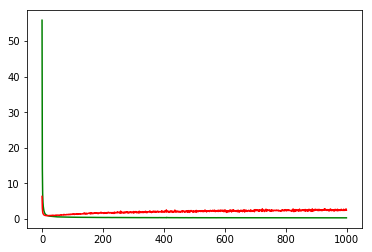

working on d,u and l,le 0.5 128 0.01 0.0001


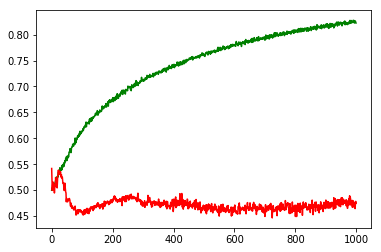

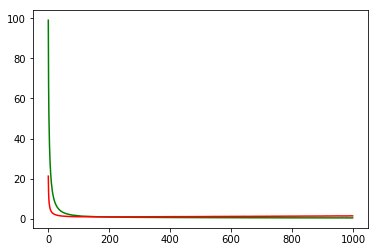

working on d,u and l,le 0.5 128 0.01 1e-05


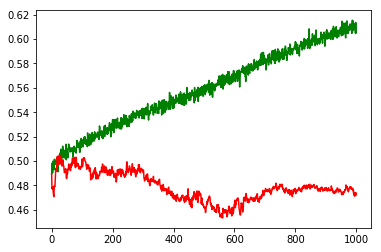

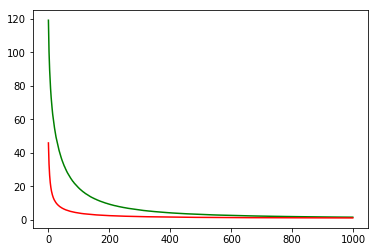

working on d,u and l,le 0.5 128 0.05 0.001


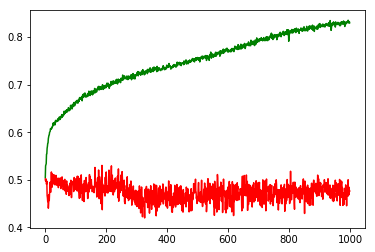

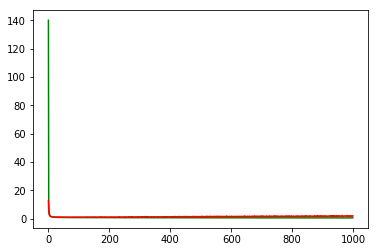

working on d,u and l,le 0.5 128 0.05 0.0001


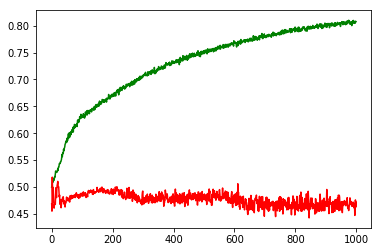

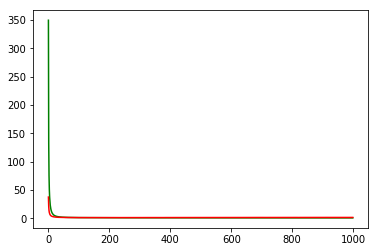

working on d,u and l,le 0.5 128 0.05 1e-05


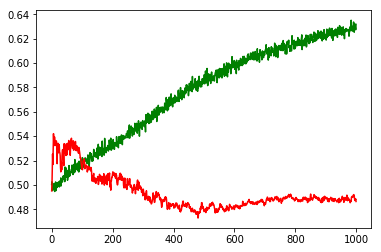

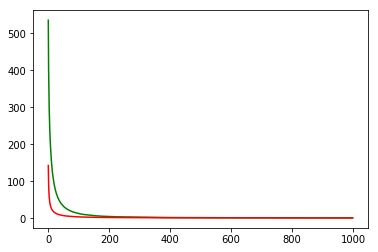

working on d,u and l,le 0.5 256 0.01 0.001


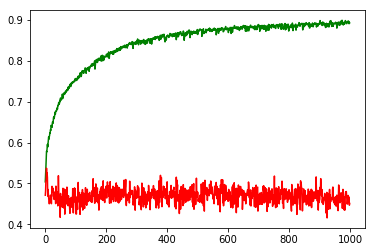

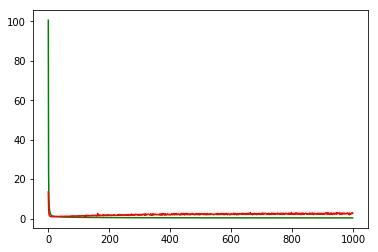

working on d,u and l,le 0.5 256 0.01 0.0001


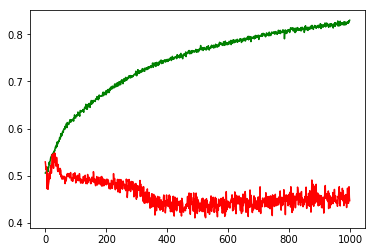

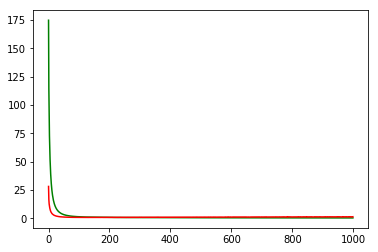

working on d,u and l,le 0.5 256 0.01 1e-05


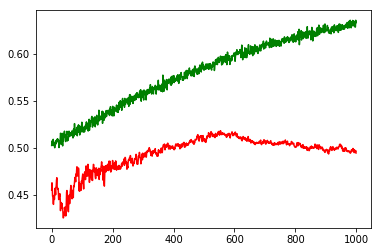

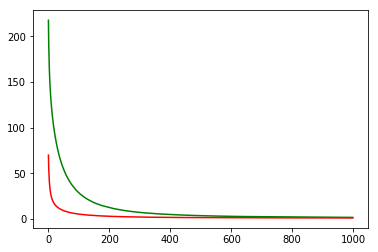

working on d,u and l,le 0.5 256 0.05 0.001


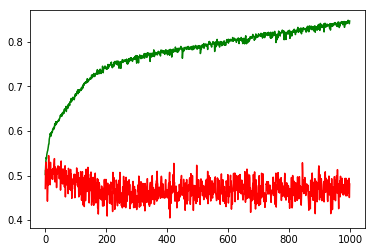

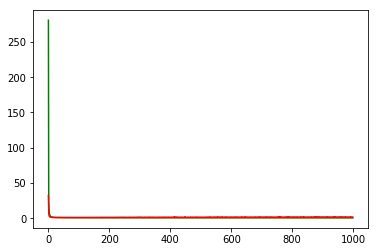

working on d,u and l,le 0.5 256 0.05 0.0001


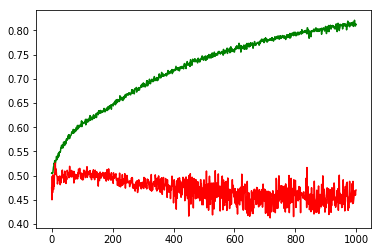

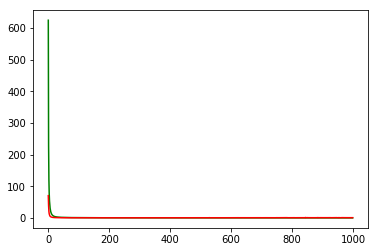

working on d,u and l,le 0.5 256 0.05 1e-05


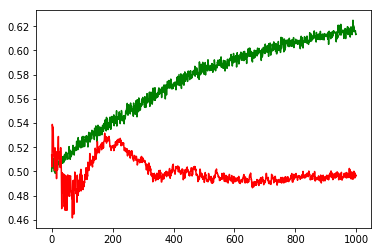

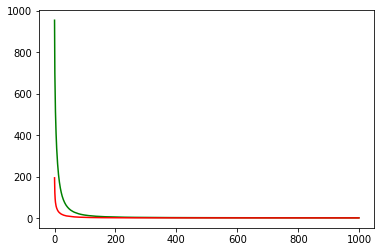

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.0001
Chart for BEST MODEL FOR: CSCO


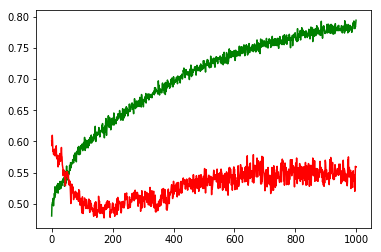

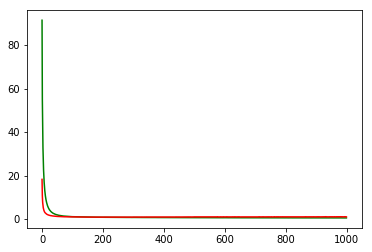

F1,score 0.6178736517719569
G-score: 0.5438672620471002
Accuracy 0.5591111091507805
Window: 140
[[228 249]
 [247 401]]
Vol pos 1.9998658390967592
Vol neg 1.6409282326189143
Real Percentage of gain: 54.51508864579394
Percentage of gain: 0.39468018614478223
Total gain: 444.01520941288004
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 90 130]
 [134 162]]
516/516 [==============================] - 0s 35us/step
[1.1269687044528103, 0.4883720930232558]
Percentile:  1
[[ 46  50]
 [ 75 152]]
323/323 [==============================] - 0s 45us/step
[0.8063875248557643, 0.6130030959752322]
Percentile:  2
[[22 28]
 [29 59]]
138/138 [==============================] - 0s 41us/step
[0.6501822212468022, 0.5869565221710481]
Percentile:  3
[[49  9]
 [ 4 24]]
86/86 [==============================] - 0s 43us/step
[0.44656476586364036, 0.848837205143862]
Percentile:  4
[[21 31]
 [ 3  3]]
58/58 [==============================] - 0s 42us/step
[1.087825713486507, 0.41379311372493877]
00000

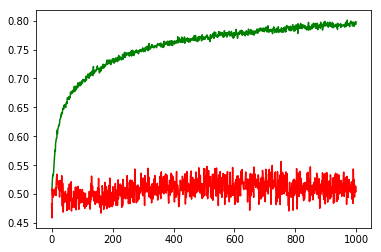

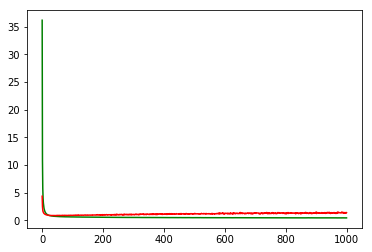

working on d,u and l,le 0.5 64 0.01 0.0001


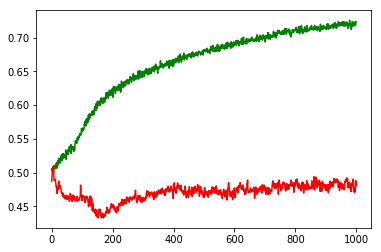

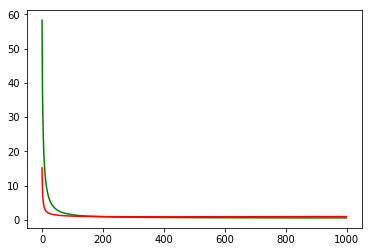

working on d,u and l,le 0.5 64 0.01 1e-05


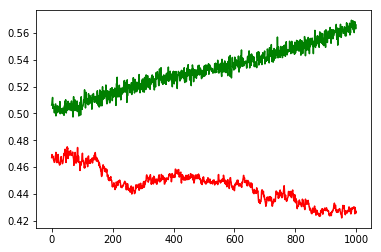

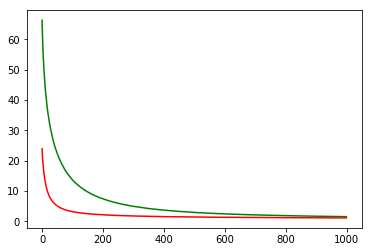

working on d,u and l,le 0.5 64 0.05 0.001


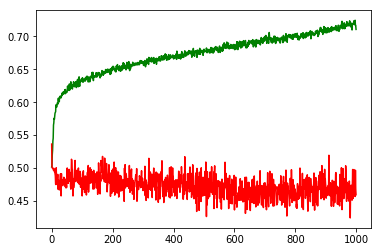

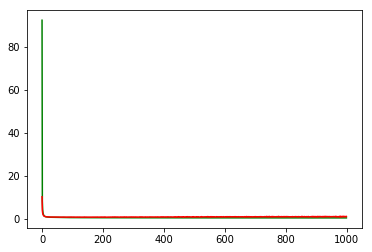

working on d,u and l,le 0.5 64 0.05 0.0001


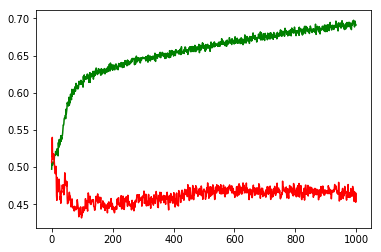

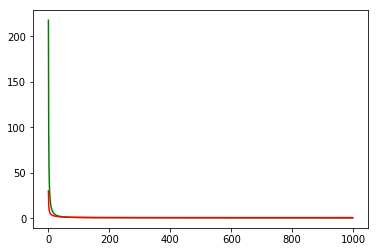

working on d,u and l,le 0.5 64 0.05 1e-05


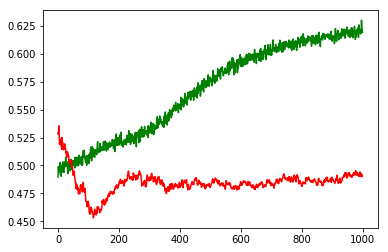

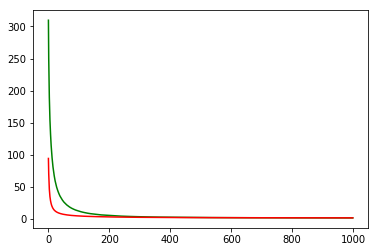

working on d,u and l,le 0.5 128 0.01 0.001


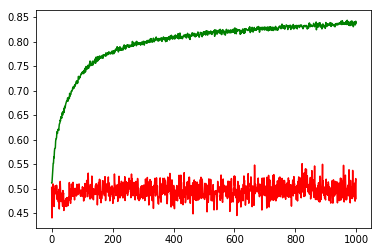

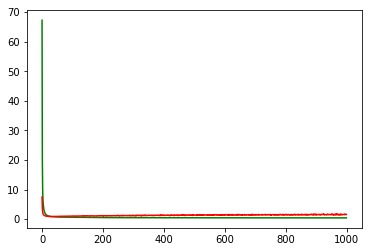

working on d,u and l,le 0.5 128 0.01 0.0001


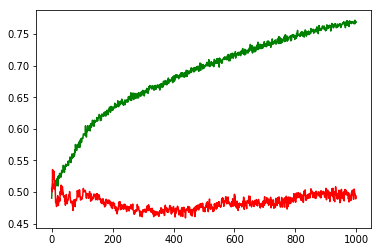

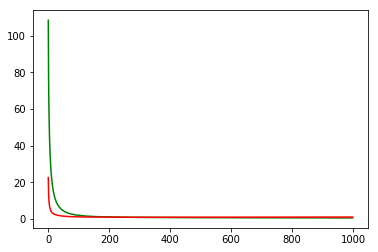

working on d,u and l,le 0.5 128 0.01 1e-05


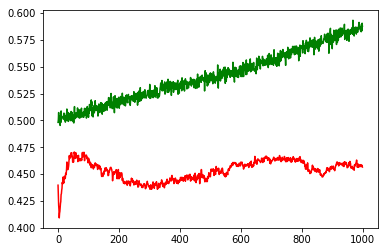

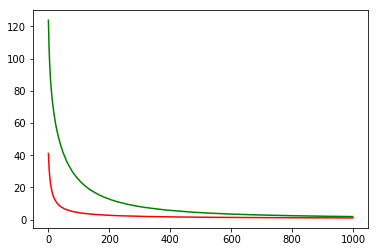

working on d,u and l,le 0.5 128 0.05 0.001


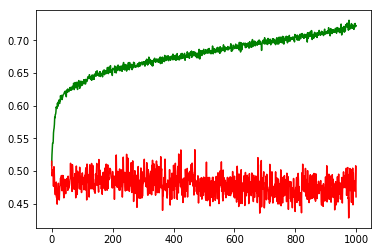

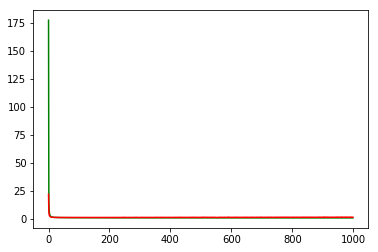

working on d,u and l,le 0.5 128 0.05 0.0001


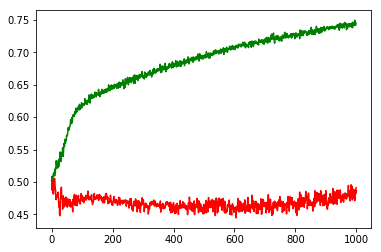

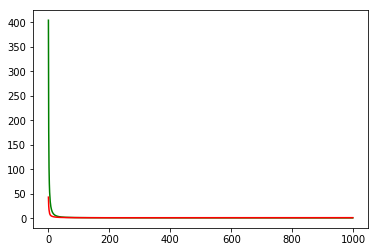

working on d,u and l,le 0.5 128 0.05 1e-05


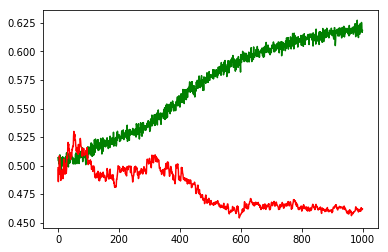

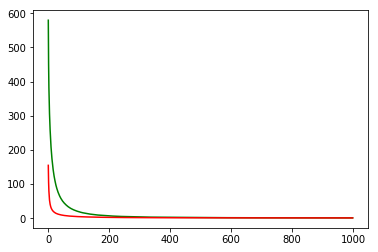

working on d,u and l,le 0.5 256 0.01 0.001


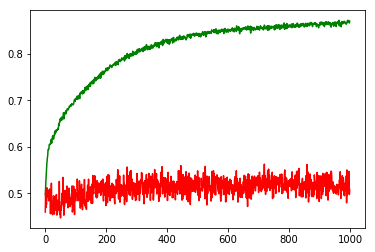

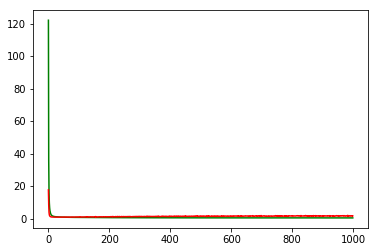

working on d,u and l,le 0.5 256 0.01 0.0001


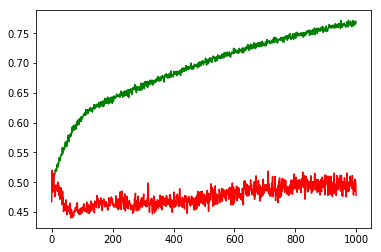

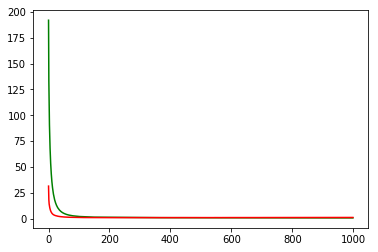

working on d,u and l,le 0.5 256 0.01 1e-05


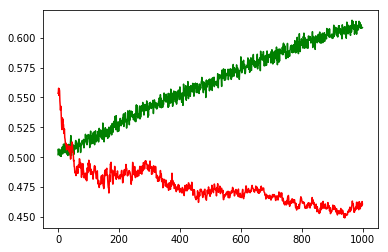

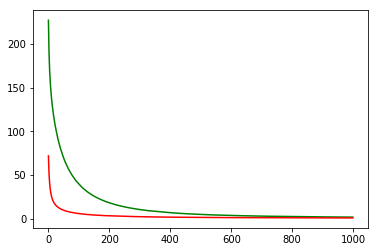

working on d,u and l,le 0.5 256 0.05 0.001


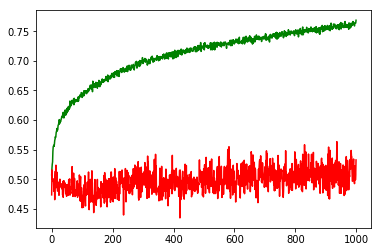

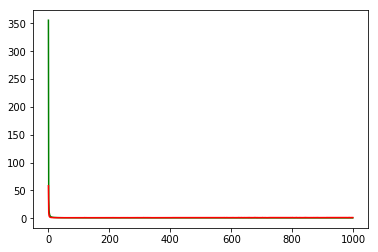

working on d,u and l,le 0.5 256 0.05 0.0001


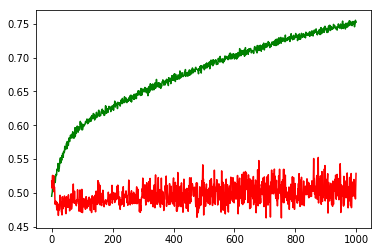

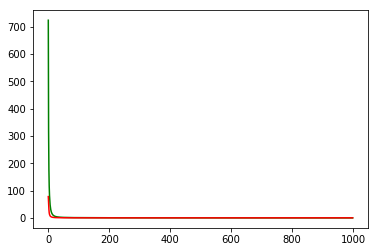

working on d,u and l,le 0.5 256 0.05 1e-05


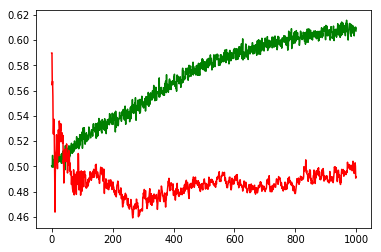

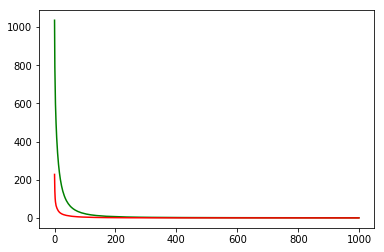

maxd,maxu,maxl,maxle: 0.5 256 0.05 0.0001
Chart for BEST MODEL FOR: CMCSA


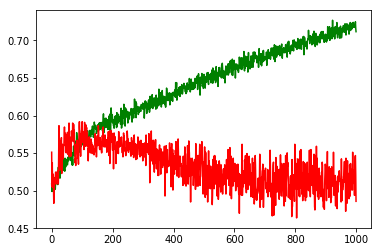

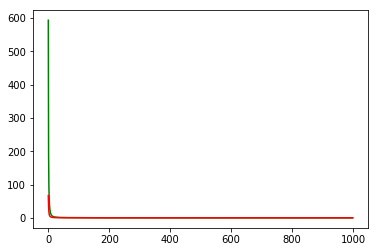

F1,score 0.5329052969502408
G-score: 0.4758165627648973
Accuracy 0.4858657239603912
Window: 140
[[218 322]
 [260 332]]
Vol pos 2.6444327884973595
Vol neg 3.0577733651947336
Real Percentage of gain: -9.714511721559095
Percentage of gain: -0.2872668417577624
Total gain: -325.18606486978706
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 95 132]
 [ 77 124]]
428/428 [==============================] - 0s 31us/step
[0.8510791904458376, 0.5116822429906542]
Percentile:  1
[[ 76 121]
 [117 187]]
501/501 [==============================] - 0s 30us/step
[0.9997020034257047, 0.5249501006331986]
Percentile:  2
[[ 8 34]
 [57 17]]
116/116 [==============================] - 0s 34us/step
[1.2314330956031536, 0.21551724137931033]
Percentile:  3
[[27 33]
 [ 9  3]]
72/72 [==============================] - 0s 45us/step
[0.7828800943162706, 0.4166666666666667]
Percentile:  4
[[11  2]
 [ 0  0]]
13/13 [==============================] - 0s 58us/step
[0.3995925784111023, 0.8461538553237915]
00

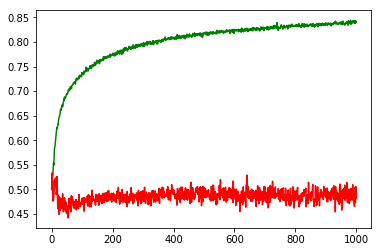

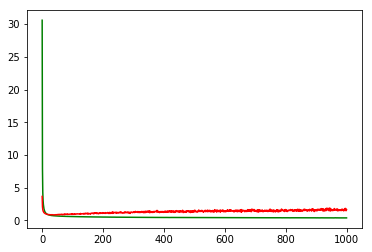

working on d,u and l,le 0.5 64 0.01 0.0001


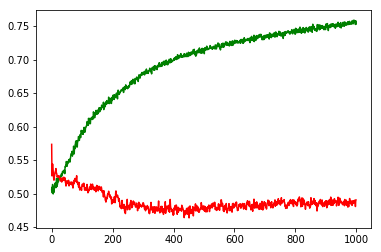

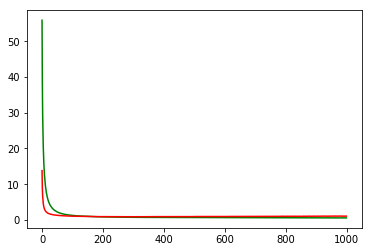

working on d,u and l,le 0.5 64 0.01 1e-05


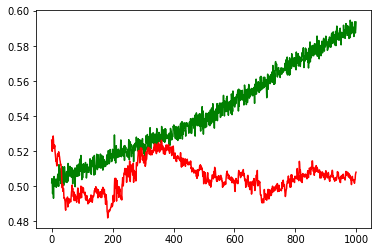

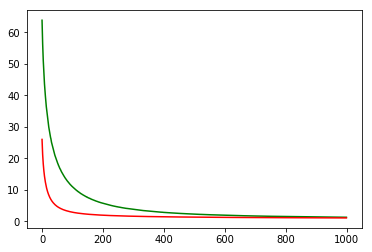

working on d,u and l,le 0.5 64 0.05 0.001


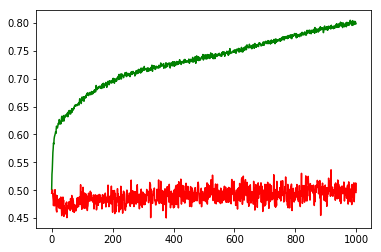

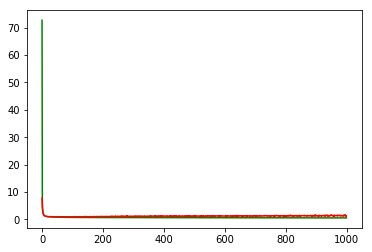

working on d,u and l,le 0.5 64 0.05 0.0001


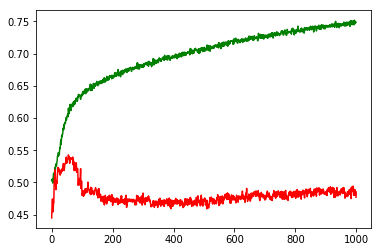

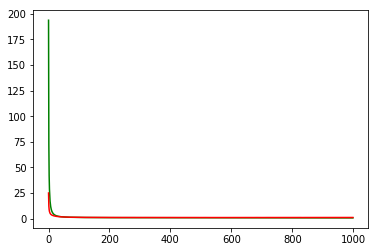

working on d,u and l,le 0.5 64 0.05 1e-05


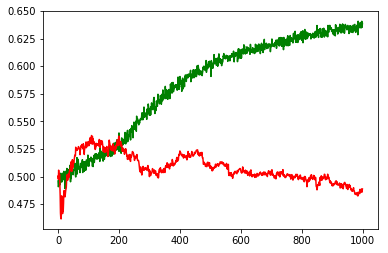

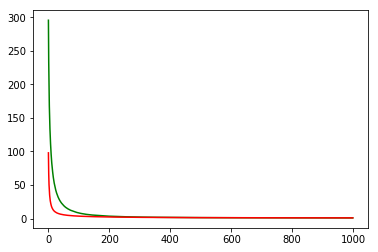

working on d,u and l,le 0.5 128 0.01 0.001


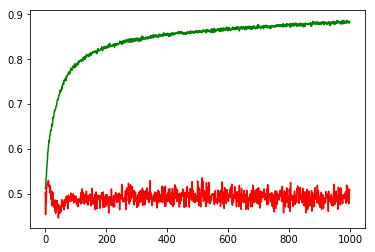

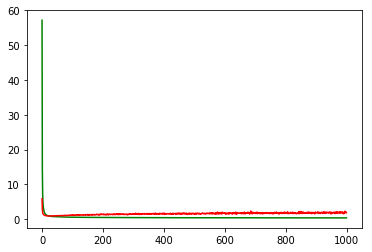

working on d,u and l,le 0.5 128 0.01 0.0001


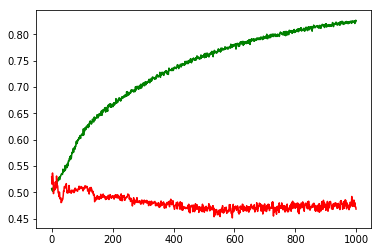

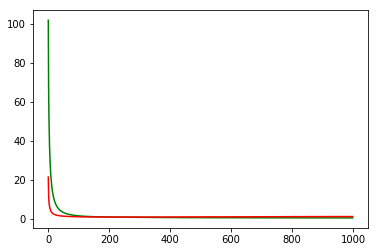

working on d,u and l,le 0.5 128 0.01 1e-05


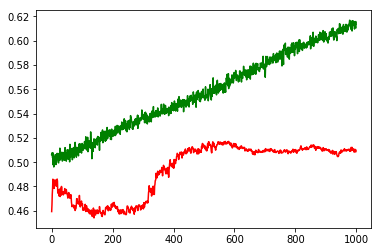

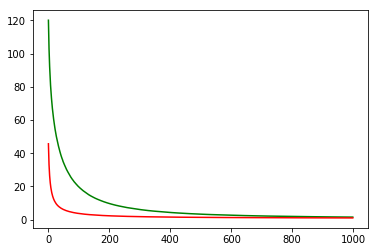

working on d,u and l,le 0.5 128 0.05 0.001


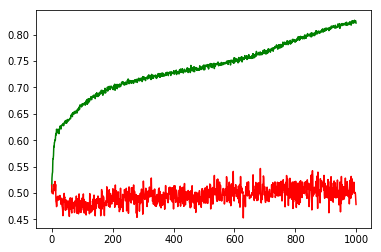

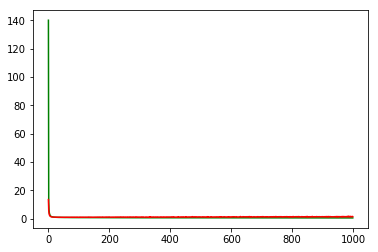

working on d,u and l,le 0.5 128 0.05 0.0001


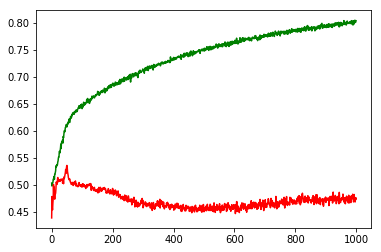

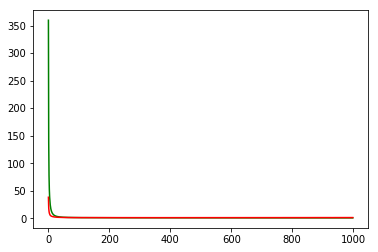

working on d,u and l,le 0.5 128 0.05 1e-05


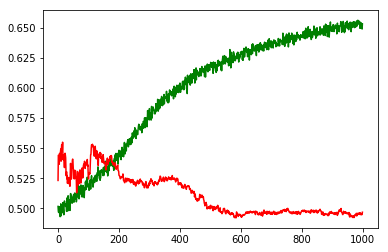

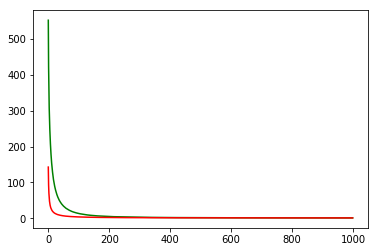

working on d,u and l,le 0.5 256 0.01 0.001


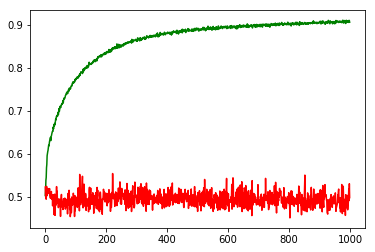

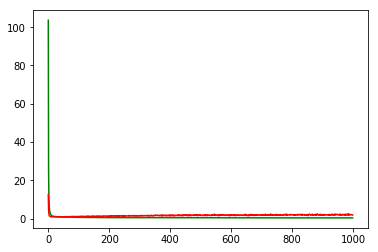

working on d,u and l,le 0.5 256 0.01 0.0001


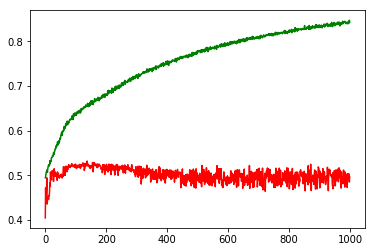

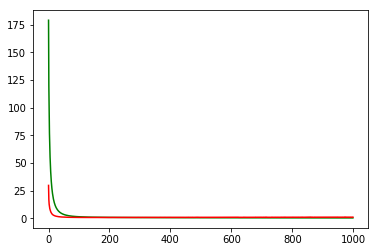

working on d,u and l,le 0.5 256 0.01 1e-05


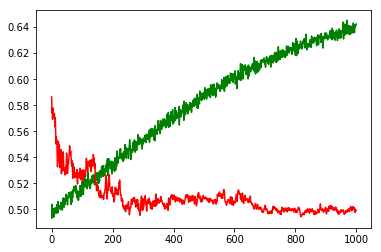

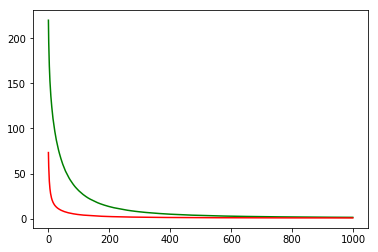

working on d,u and l,le 0.5 256 0.05 0.001


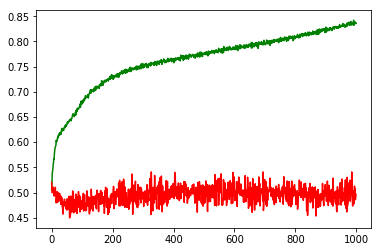

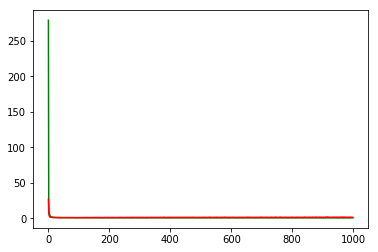

working on d,u and l,le 0.5 256 0.05 0.0001


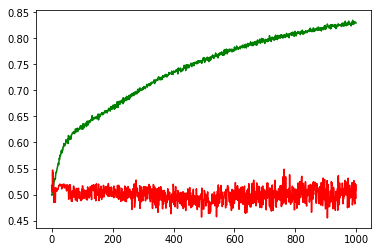

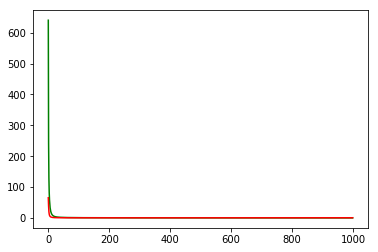

working on d,u and l,le 0.5 256 0.05 1e-05


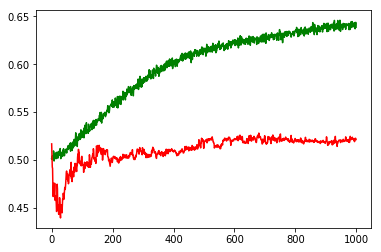

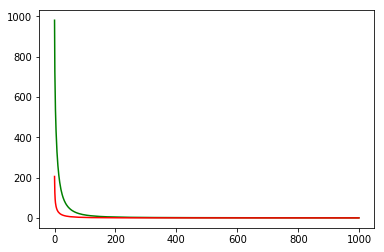

maxd,maxu,maxl,maxle: 0.5 64 0.01 0.0001
Chart for BEST MODEL FOR: NVDA


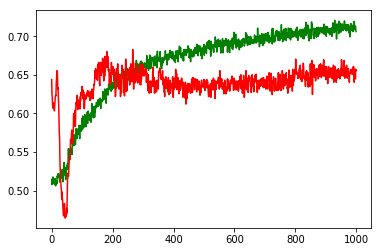

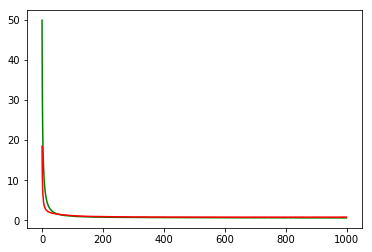

F1,score 0.7206303724928367
G-score: 0.6204796564748926
Accuracy 0.6554770326445886
Window: 140
[[239 237]
 [153 503]]
Vol pos 4.0935726660522835
Vol neg 3.1536907479390464
Real Percentage of gain: 326.81107467673087
Percentage of gain: 1.5967239633520904
Total gain: 1807.4915265145664
000000000000000000000000000000000000000000000000
Percentile:  0
[[154 159]
 [ 62 184]]
559/559 [==============================] - 0s 26us/step
[0.8572258288190702, 0.6046511629772954]
Percentile:  1
[[ 73  44]
 [ 58 162]]
337/337 [==============================] - 0s 28us/step
[0.6572646387253034, 0.6973293768988165]
Percentile:  2
[[ 8 23]
 [10 62]]
103/103 [==============================] - 0s 33us/step
[0.5339068438025932, 0.6796116504854369]
Percentile:  3
[[ 4 11]
 [16 49]]
80/80 [==============================] - 0s 51us/step
[0.5647063374519348, 0.6625]
Percentile:  4
[[ 0  0]
 [ 7 44]]
51/51 [==============================] - 0s 47us/step
[0.3354246032004263, 0.8627450980392157]
00000000000000000

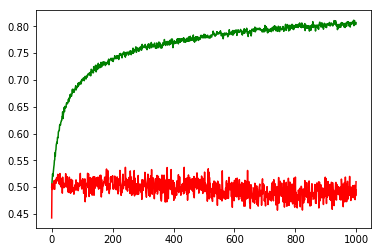

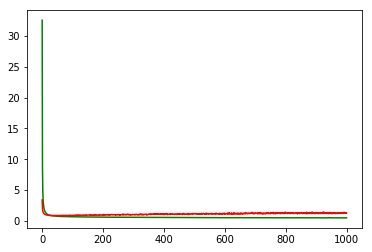

working on d,u and l,le 0.5 64 0.01 0.0001


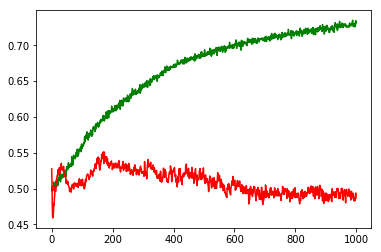

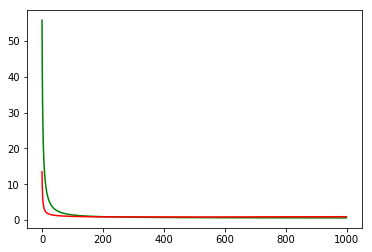

working on d,u and l,le 0.5 64 0.01 1e-05


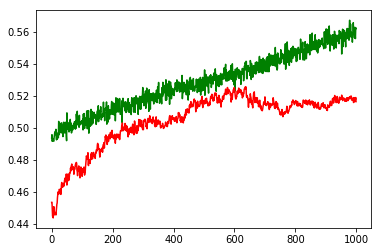

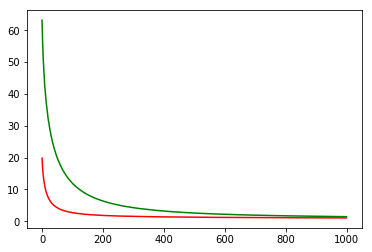

working on d,u and l,le 0.5 64 0.05 0.001


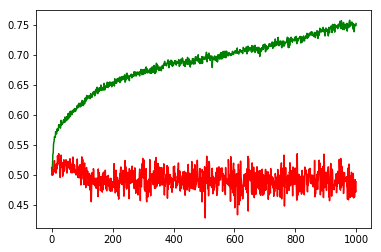

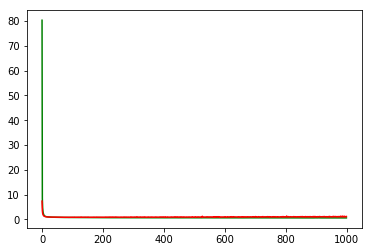

working on d,u and l,le 0.5 64 0.05 0.0001


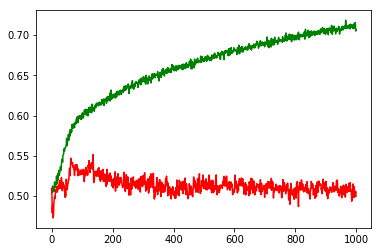

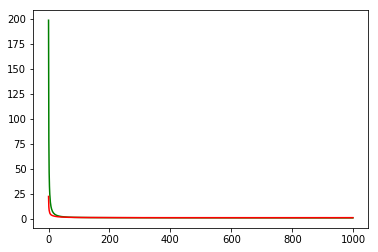

working on d,u and l,le 0.5 64 0.05 1e-05


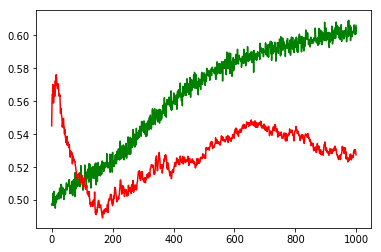

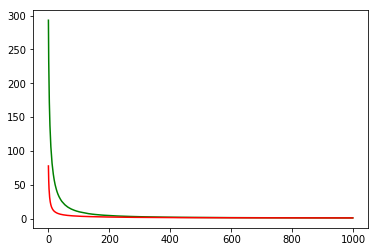

working on d,u and l,le 0.5 128 0.01 0.001


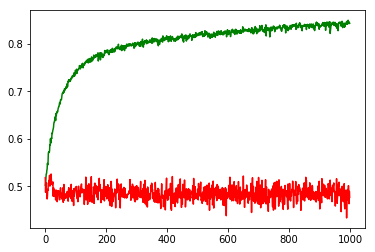

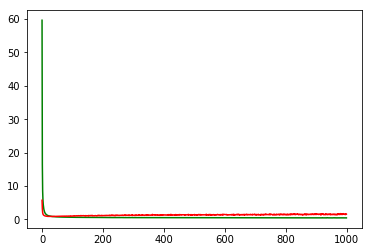

working on d,u and l,le 0.5 128 0.01 0.0001


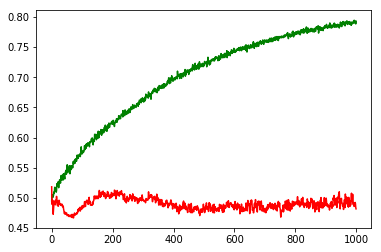

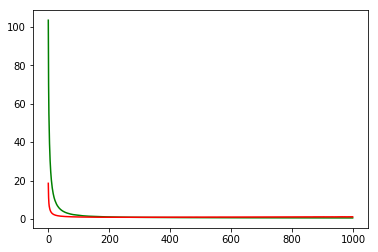

working on d,u and l,le 0.5 128 0.01 1e-05


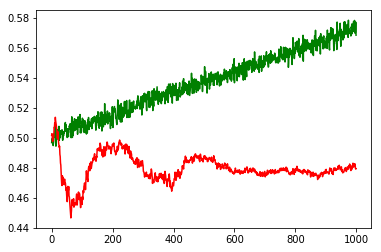

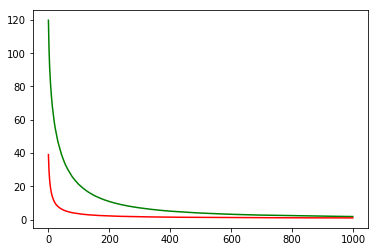

working on d,u and l,le 0.5 128 0.05 0.001


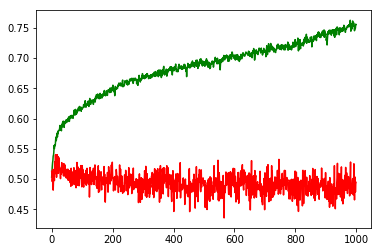

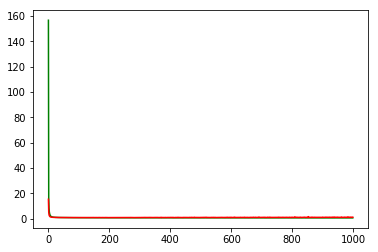

working on d,u and l,le 0.5 128 0.05 0.0001


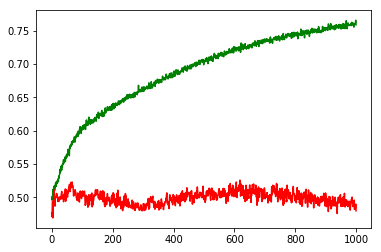

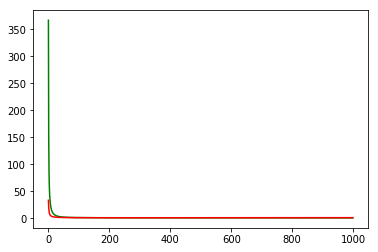

working on d,u and l,le 0.5 128 0.05 1e-05


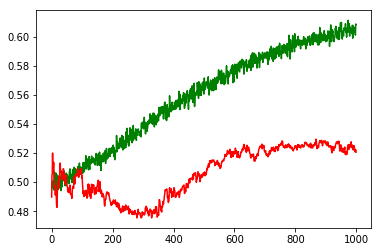

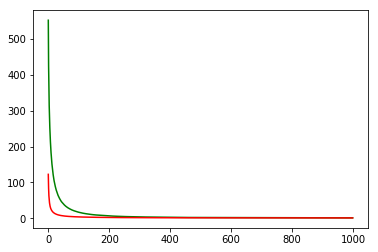

working on d,u and l,le 0.5 256 0.01 0.001


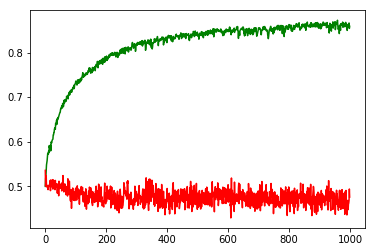

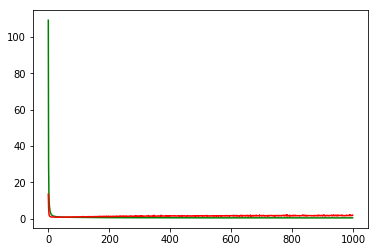

working on d,u and l,le 0.5 256 0.01 0.0001


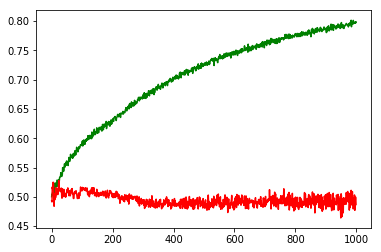

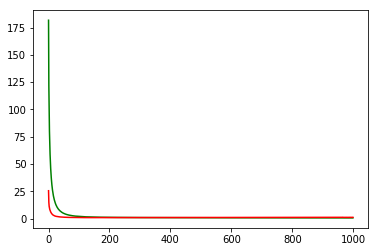

working on d,u and l,le 0.5 256 0.01 1e-05


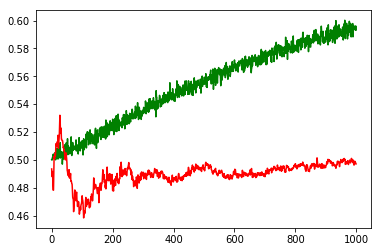

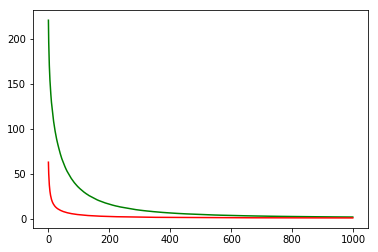

working on d,u and l,le 0.5 256 0.05 0.001


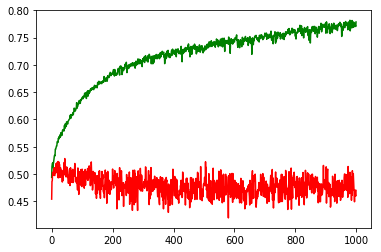

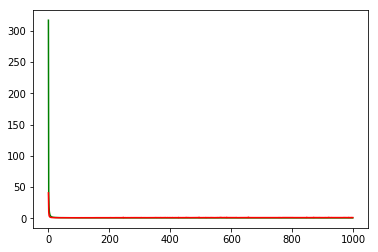

working on d,u and l,le 0.5 256 0.05 0.0001


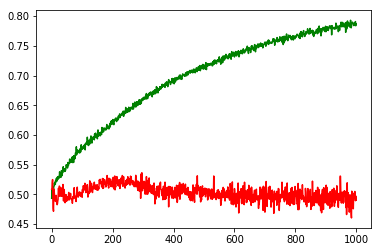

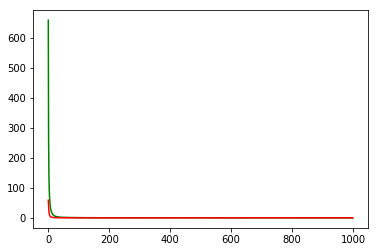

working on d,u and l,le 0.5 256 0.05 1e-05


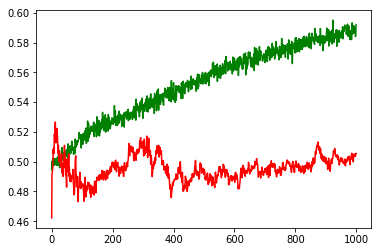

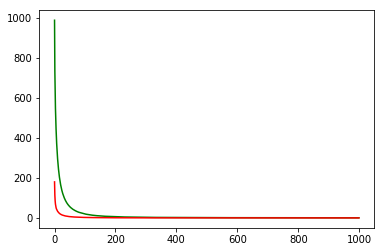

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.0001
Chart for BEST MODEL FOR: NFLX


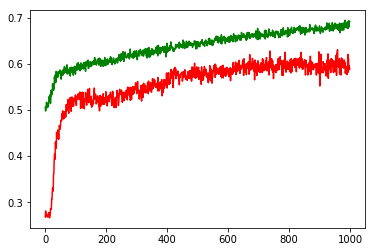

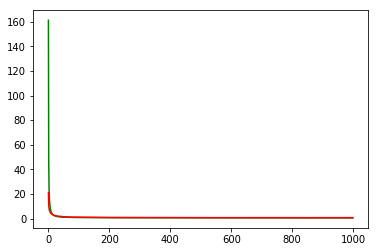

F1,score 0.7115264797507789
G-score: 0.47501752178306794
Accuracy 0.5909893988720519
Window: 140
[[ 98 199]
 [264 571]]
Vol pos 4.671878013816566
Vol neg 3.852309076721569
Real Percentage of gain: 138.66490661312955
Percentage of gain: 1.1853951313791489
Total gain: 1341.8672887211965
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 59 111]
 [ 86 204]]
460/460 [==============================] - 0s 30us/step
[0.7718256919280343, 0.5717391304347826]
Percentile:  1
[[  7  53]
 [106 162]]
328/328 [==============================] - 0s 28us/step
[0.9342389310278544, 0.5152439024390244]
Percentile:  2
[[ 11  27]
 [ 52 143]]
233/233 [==============================] - 0s 32us/step
[0.6913166337770453, 0.6609442067760255]
Percentile:  3
[[20  7]
 [20 50]]
97/97 [==============================] - 0s 40us/step
[0.4915645230062229, 0.7216494845360825]
Percentile:  4
[[ 1  0]
 [ 0 11]]
12/12 [==============================] - 0s 51us/step
[0.09058691561222076, 1.0]
0000000000000000

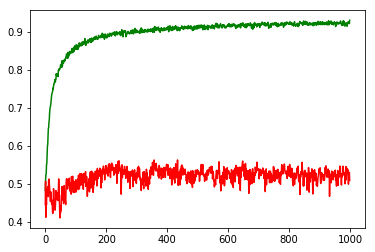

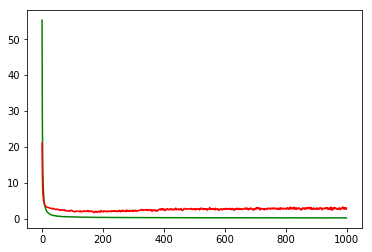

working on d,u and l,le 0.5 64 0.01 0.0001


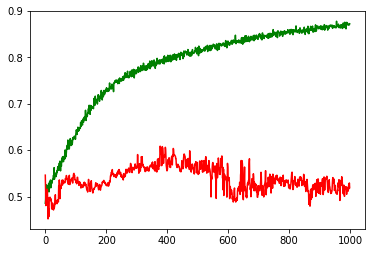

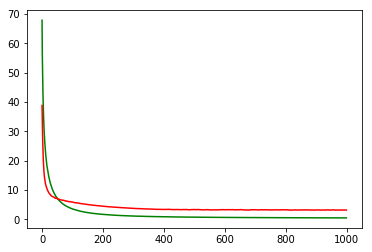

working on d,u and l,le 0.5 64 0.01 1e-05


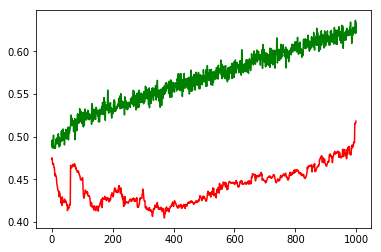

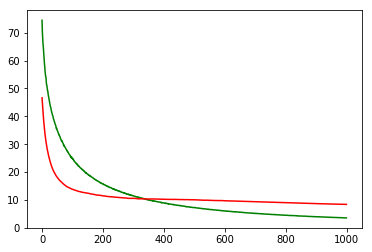

working on d,u and l,le 0.5 64 0.05 0.001


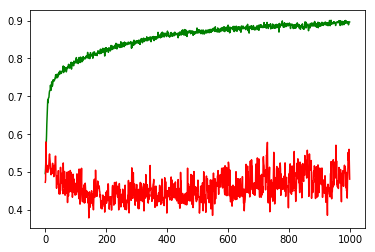

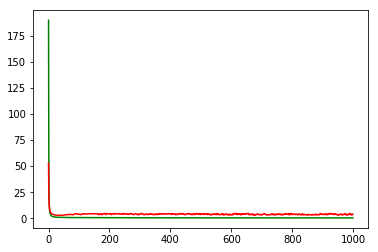

working on d,u and l,le 0.5 64 0.05 0.0001


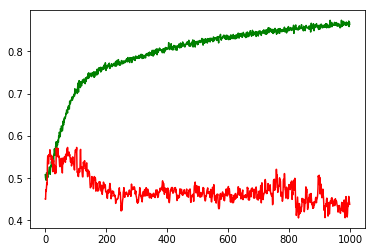

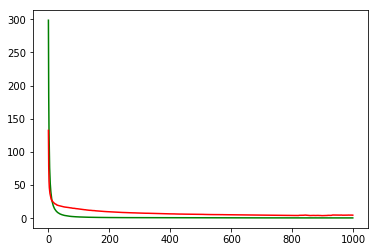

working on d,u and l,le 0.5 64 0.05 1e-05


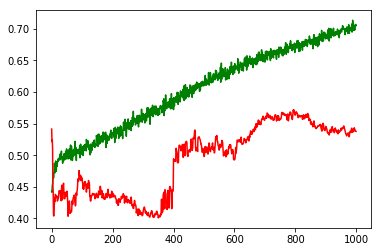

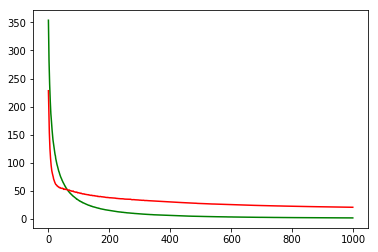

working on d,u and l,le 0.5 128 0.01 0.001


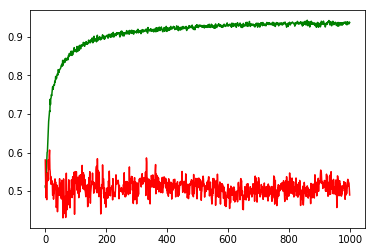

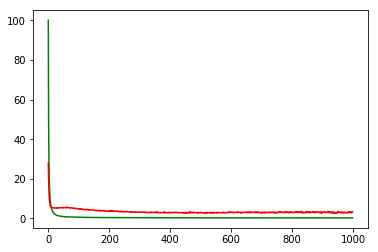

working on d,u and l,le 0.5 128 0.01 0.0001


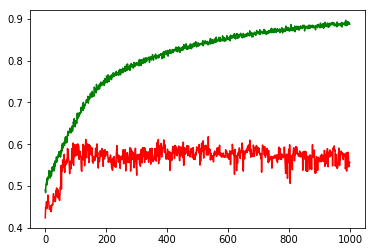

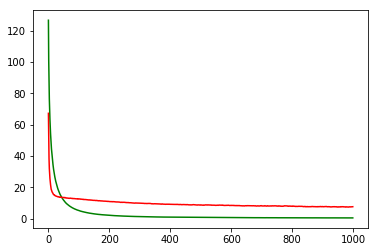

working on d,u and l,le 0.5 128 0.01 1e-05


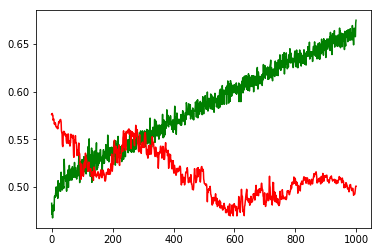

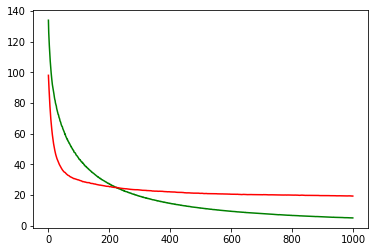

working on d,u and l,le 0.5 128 0.05 0.001


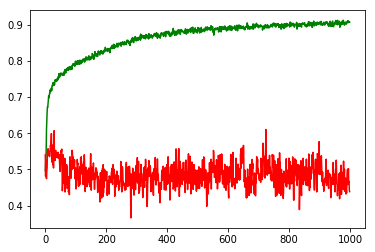

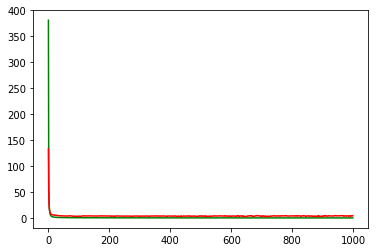

working on d,u and l,le 0.5 128 0.05 0.0001


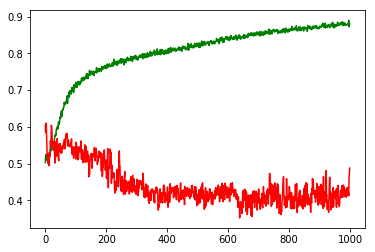

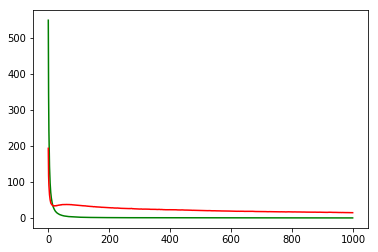

working on d,u and l,le 0.5 128 0.05 1e-05


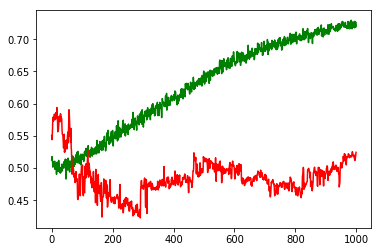

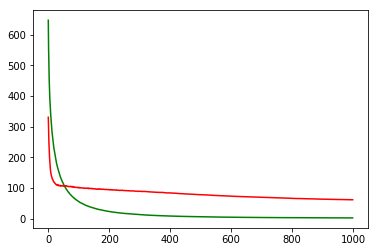

working on d,u and l,le 0.5 256 0.01 0.001


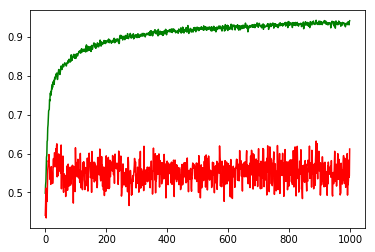

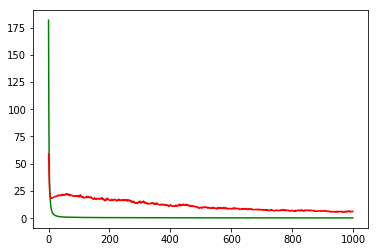

working on d,u and l,le 0.5 256 0.01 0.0001


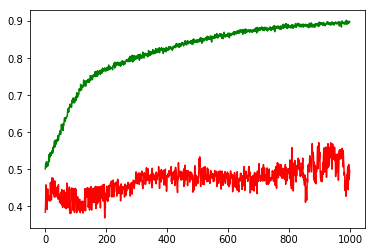

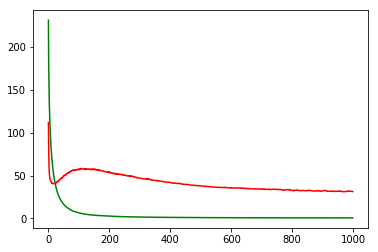

working on d,u and l,le 0.5 256 0.01 1e-05


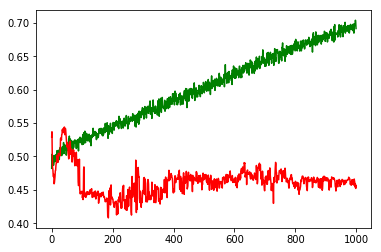

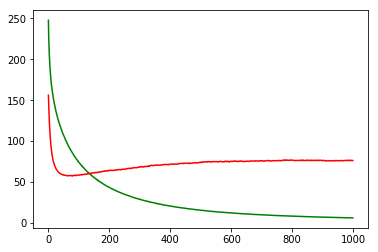

working on d,u and l,le 0.5 256 0.05 0.001


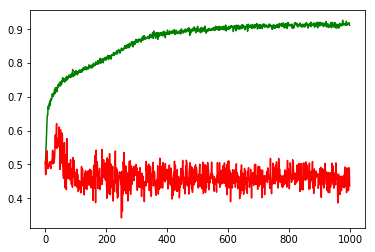

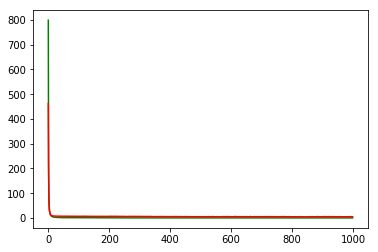

working on d,u and l,le 0.5 256 0.05 0.0001


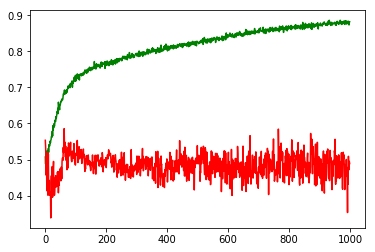

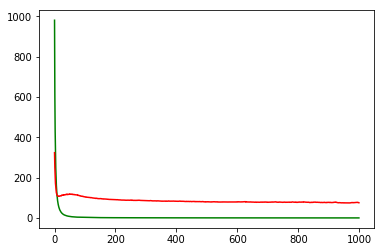

working on d,u and l,le 0.5 256 0.05 1e-05


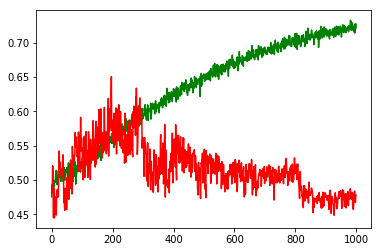

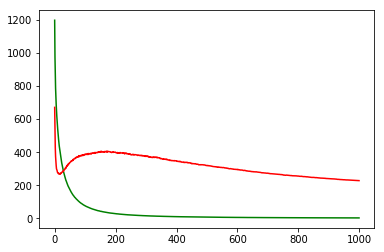

maxd,maxu,maxl,maxle: 0.5 64 0.01 1e-05
Chart for BEST MODEL FOR: BKNG


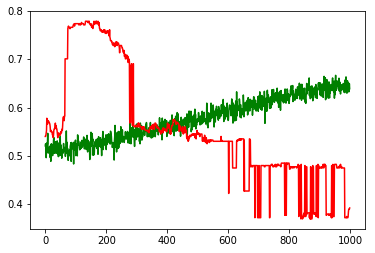

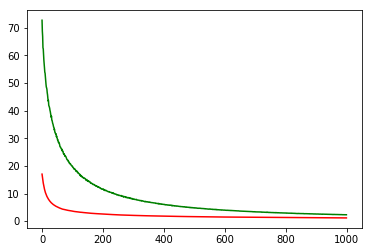

F1,score 0.4549549549549549
G-score: 0.3985205794650981
Accuracy 0.3919597980964124
Window: 140
[[ 55  76]
 [166 101]]
Vol pos 0.9431439417800229
Vol neg 1.3343406885677396
Real Percentage of gain: -124.64268320324528
Percentage of gain: -0.44165827064248586
Total gain: -175.77999171570937
000000000000000000000000000000000000000000000000
Percentile:  0
[[29 68]
 [27 48]]
172/172 [==============================] - 0s 33us/step
[0.8020252412141755, 0.4476744186046512]
Percentile:  1
[[19  7]
 [45 29]]
100/100 [==============================] - 0s 44us/step
[0.7818275415897369, 0.48]
Percentile:  2
[[ 7  0]
 [62 20]]
89/89 [==============================] - 0s 30us/step
[0.8315024811230348, 0.3033707868517115]
Percentile:  3
[[ 0  0]
 [19  4]]
23/23 [==============================] - 0s 39us/step
[0.843007504940033, 0.17391304671764374]
Percentile:  4
[[ 0  0]
 [12  0]]
12/12 [==============================] - 0s 58us/step
[0.8367581367492676, 0.0]
0000000000000000000000000000000000000000

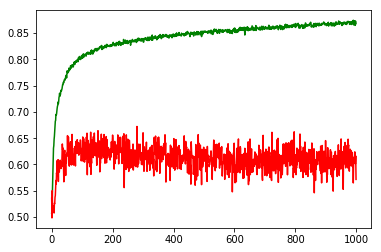

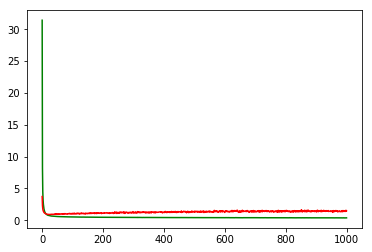

working on d,u and l,le 0.5 64 0.01 0.0001


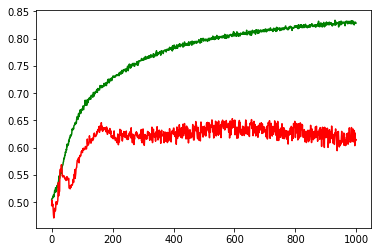

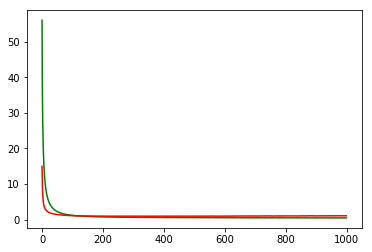

working on d,u and l,le 0.5 64 0.01 1e-05


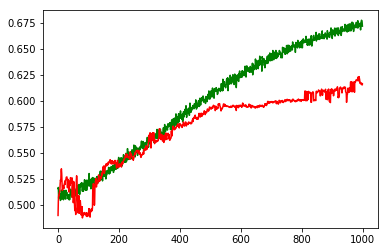

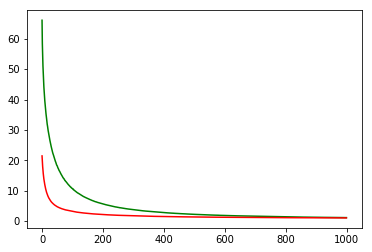

working on d,u and l,le 0.5 64 0.05 0.001


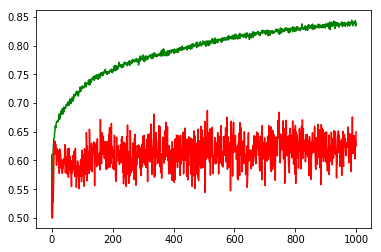

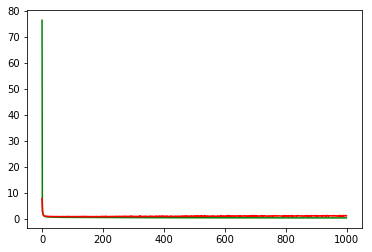

working on d,u and l,le 0.5 64 0.05 0.0001


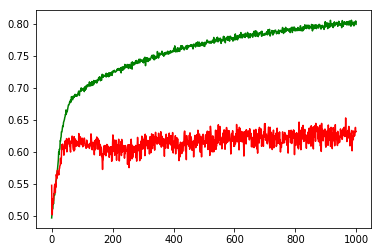

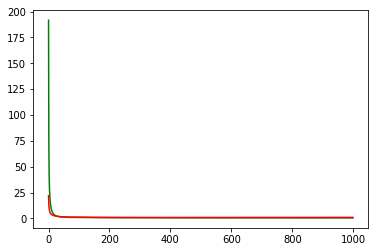

working on d,u and l,le 0.5 64 0.05 1e-05


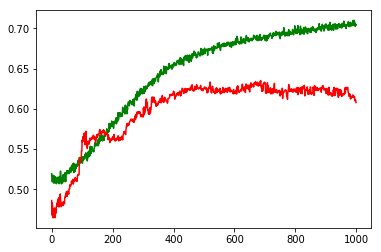

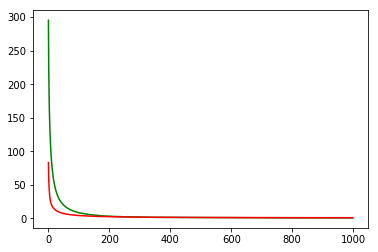

working on d,u and l,le 0.5 128 0.01 0.001


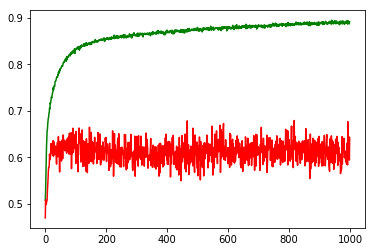

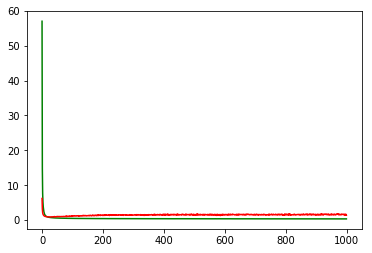

working on d,u and l,le 0.5 128 0.01 0.0001


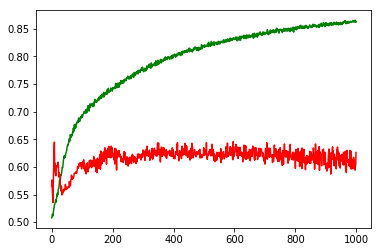

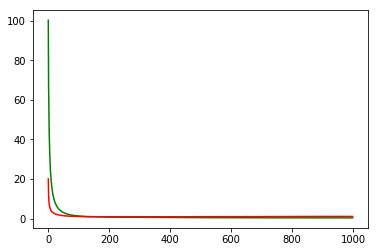

working on d,u and l,le 0.5 128 0.01 1e-05


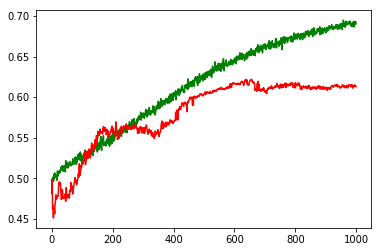

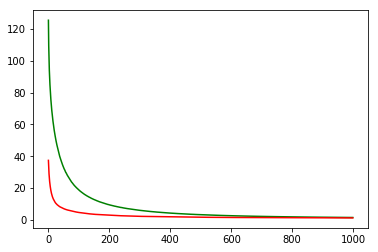

working on d,u and l,le 0.5 128 0.05 0.001


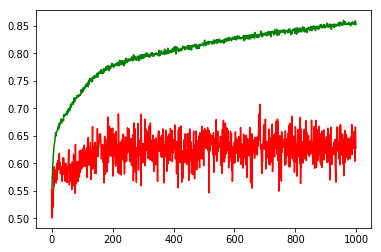

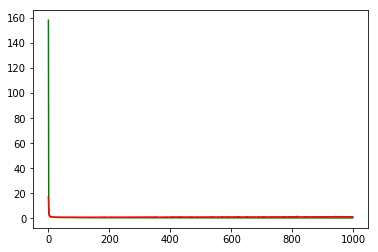

working on d,u and l,le 0.5 128 0.05 0.0001


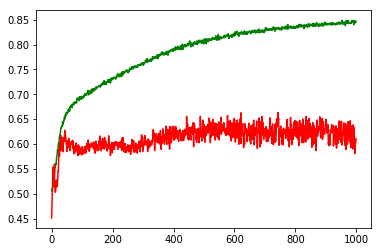

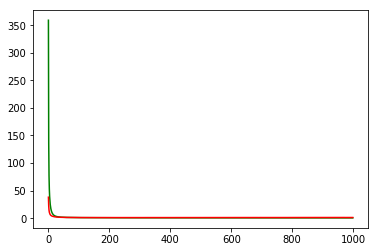

working on d,u and l,le 0.5 128 0.05 1e-05


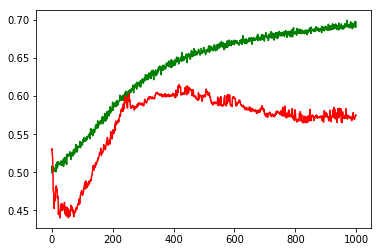

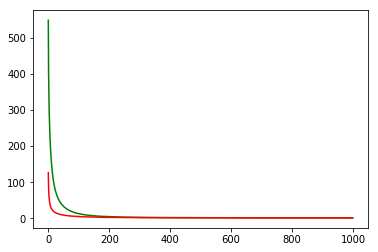

working on d,u and l,le 0.5 256 0.01 0.001


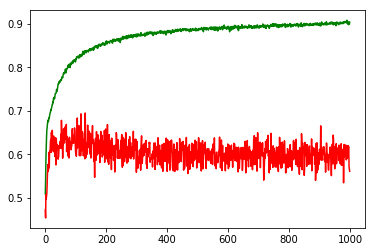

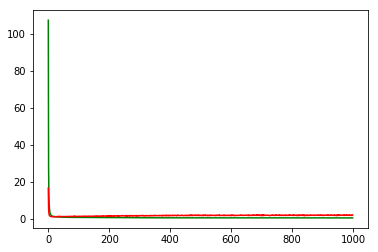

working on d,u and l,le 0.5 256 0.01 0.0001


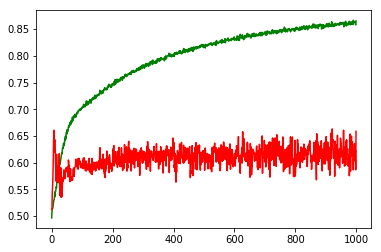

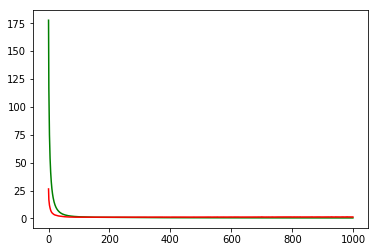

working on d,u and l,le 0.5 256 0.01 1e-05


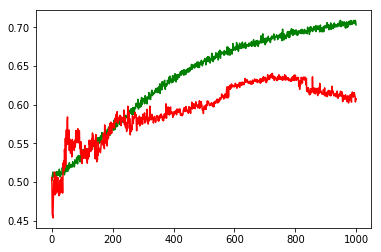

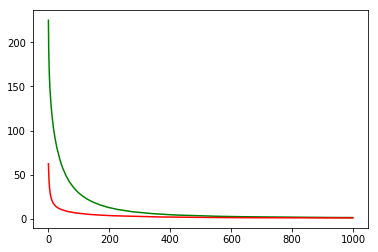

working on d,u and l,le 0.5 256 0.05 0.001


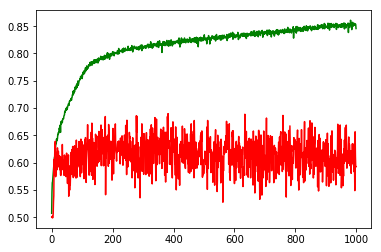

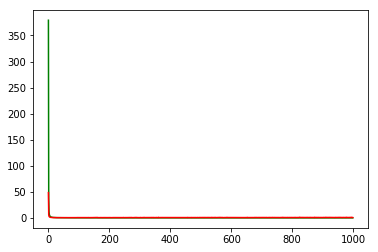

working on d,u and l,le 0.5 256 0.05 0.0001


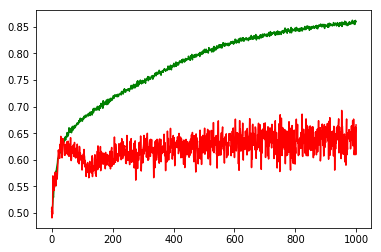

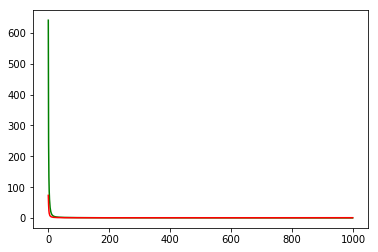

working on d,u and l,le 0.5 256 0.05 1e-05


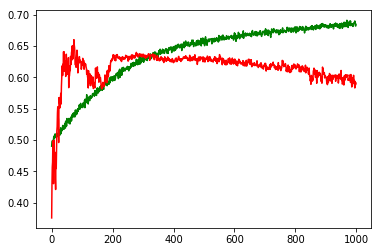

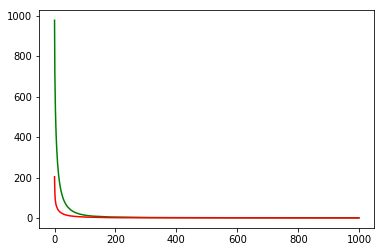

maxd,maxu,maxl,maxle: 0.5 256 0.05 0.0001
Chart for BEST MODEL FOR: ADBE


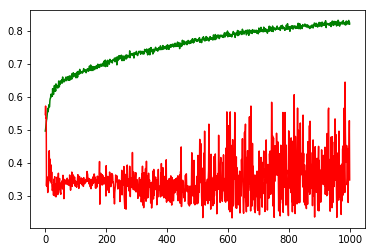

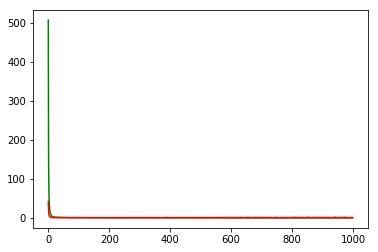

F1,score 0.4364471669218989
G-score: 0.3271970210179873
Accuracy 0.34809566095827743
Window: 140
[[108 280]
 [456 285]]
Vol pos 2.081345587150719
Vol neg 2.88215383965
Real Percentage of gain: -153.15293049890593
Percentage of gain: -1.1543812313836734
Total gain: -1303.2964102321673
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 96 181]
 [160 124]]
561/561 [==============================] - 0s 32us/step
[1.3102045197325383, 0.39215686274509803]
Percentile:  1
[[  9  54]
 [153 108]]
324/324 [==============================] - 0s 35us/step
[1.2508609714331451, 0.3611111111111111]
Percentile:  2
[[ 0 25]
 [81 52]]
158/158 [==============================] - 0s 92us/step
[1.2933079366442524, 0.32911392857756794]
Percentile:  3
[[ 3 20]
 [43  0]]
66/66 [==============================] - 0s 65us/step
[2.203705552852515, 0.045454545454545456]
Percentile:  4
[[ 0  0]
 [17  1]]
18/18 [==============================] - 0s 102us/step
[1.8704636096954346, 0.0555555559694767]
000

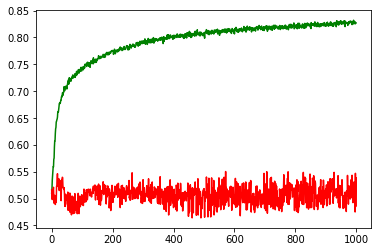

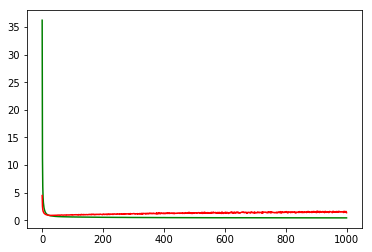

working on d,u and l,le 0.5 64 0.01 0.0001


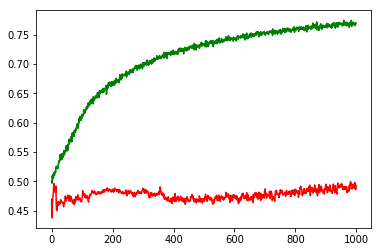

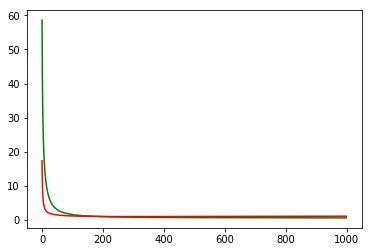

working on d,u and l,le 0.5 64 0.01 1e-05


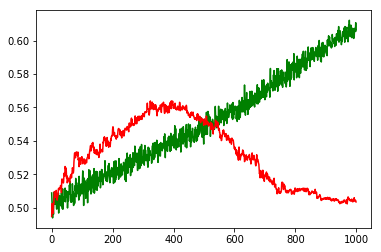

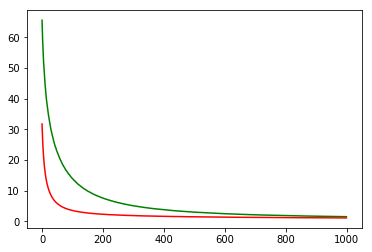

working on d,u and l,le 0.5 64 0.05 0.001


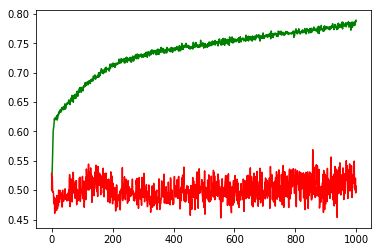

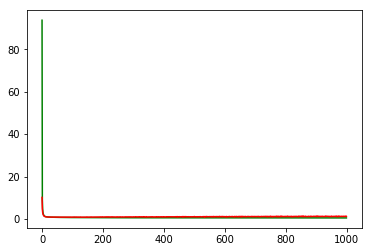

working on d,u and l,le 0.5 64 0.05 0.0001


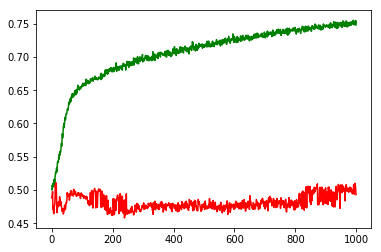

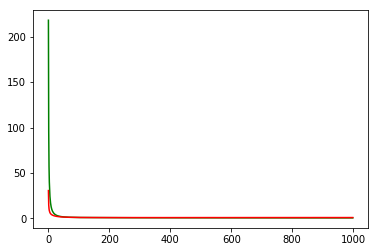

working on d,u and l,le 0.5 64 0.05 1e-05


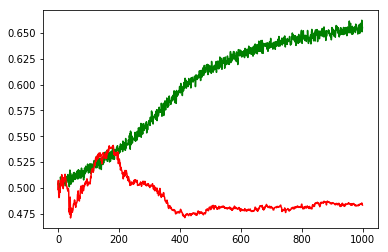

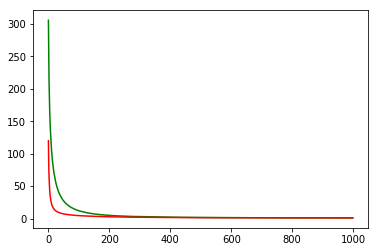

working on d,u and l,le 0.5 128 0.01 0.001


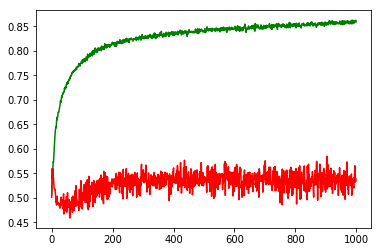

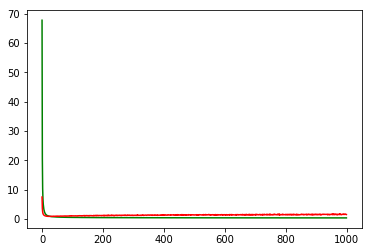

working on d,u and l,le 0.5 128 0.01 0.0001


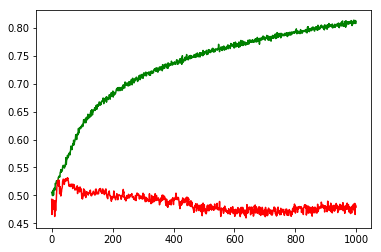

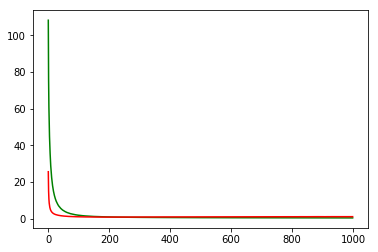

working on d,u and l,le 0.5 128 0.01 1e-05


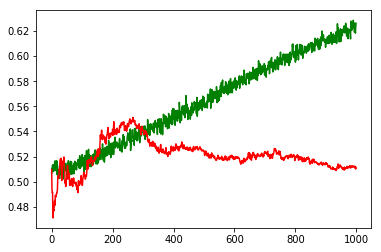

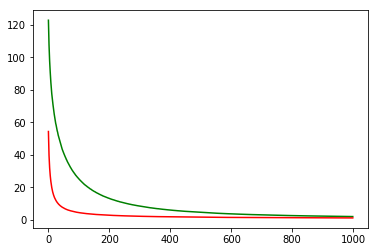

working on d,u and l,le 0.5 128 0.05 0.001


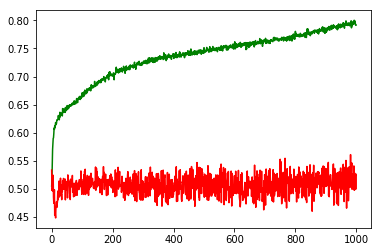

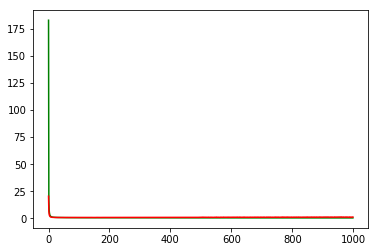

working on d,u and l,le 0.5 128 0.05 0.0001


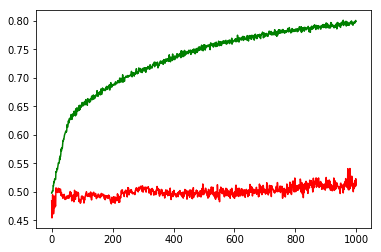

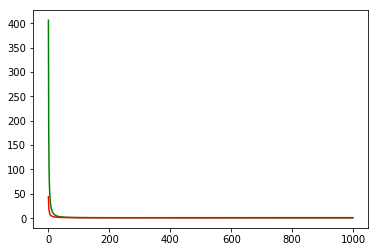

working on d,u and l,le 0.5 128 0.05 1e-05


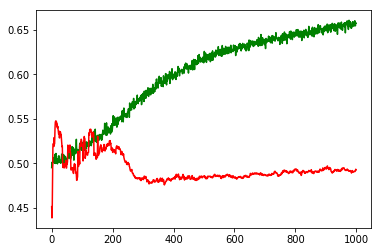

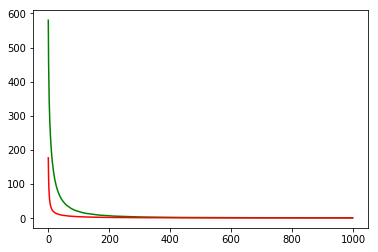

working on d,u and l,le 0.5 256 0.01 0.001


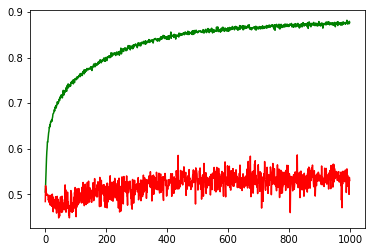

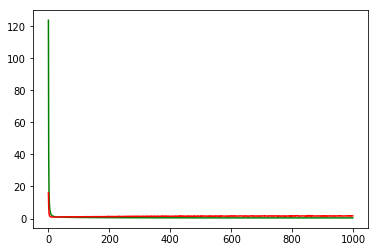

working on d,u and l,le 0.5 256 0.01 0.0001


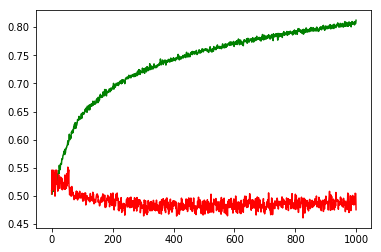

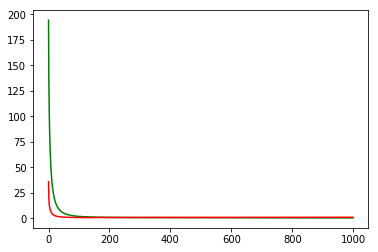

working on d,u and l,le 0.5 256 0.01 1e-05


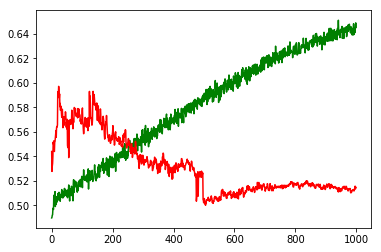

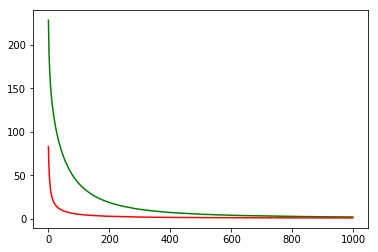

working on d,u and l,le 0.5 256 0.05 0.001


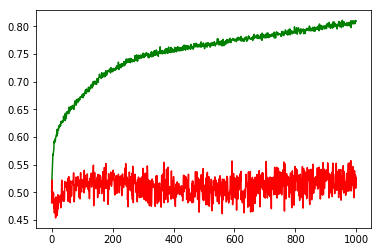

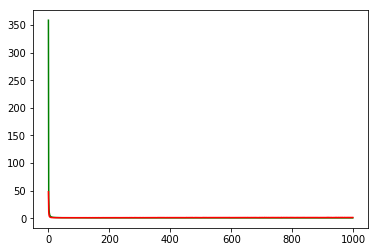

working on d,u and l,le 0.5 256 0.05 0.0001


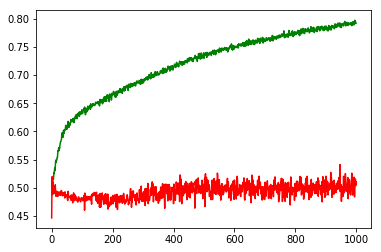

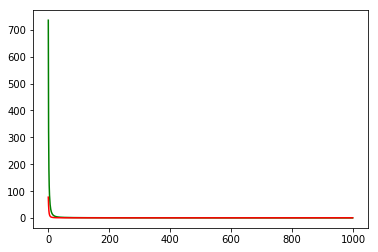

working on d,u and l,le 0.5 256 0.05 1e-05


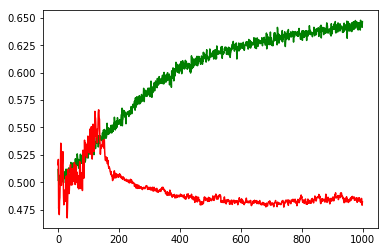

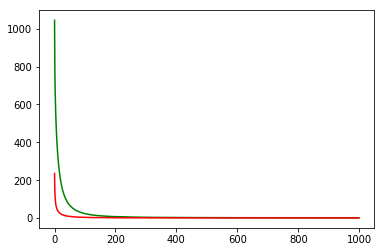

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.001
Chart for BEST MODEL FOR: AMGN


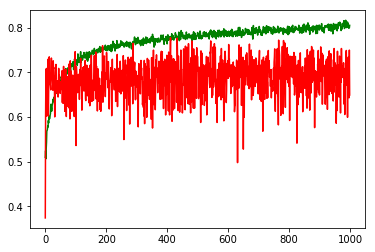

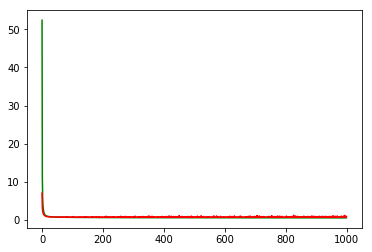

F1,score 0.7323369565217392
G-score: 0.6313038258619579
Accuracy 0.6491540505327715
Window: 140
[[190 130]
 [264 539]]
Vol pos 1.9811839432063114
Vol neg 1.8388491395289575
Real Percentage of gain: 195.166764463715
Percentage of gain: 0.6409408135556471
Total gain: 719.7765336229918
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 91  74]
 [104 177]]
446/446 [==============================] - 0s 25us/step
[0.8982377681764252, 0.600896860986547]
Percentile:  1
[[ 41  14]
 [ 82 179]]
316/316 [==============================] - 0s 29us/step
[0.761900942536849, 0.6962025301365913]
Percentile:  2
[[ 19   7]
 [ 64 124]]
214/214 [==============================] - 0s 32us/step
[0.6643225444811527, 0.6682242990654206]
Percentile:  3
[[34 22]
 [14 55]]
125/125 [==============================] - 0s 35us/step
[0.7232553157806396, 0.7119999933242798]
Percentile:  4
[[ 4 13]
 [ 0  3]]
20/20 [==============================] - 0s 29us/step
[0.8824502825737, 0.3499999940395355]
0000000

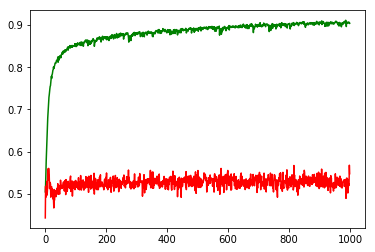

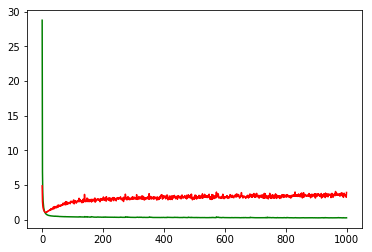

working on d,u and l,le 0.5 64 0.01 0.0001


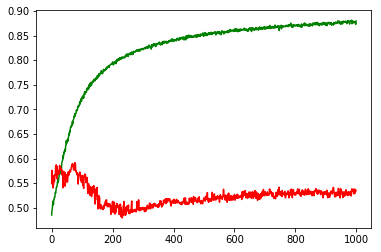

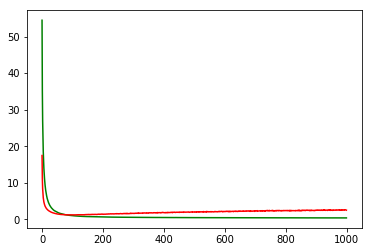

working on d,u and l,le 0.5 64 0.01 1e-05


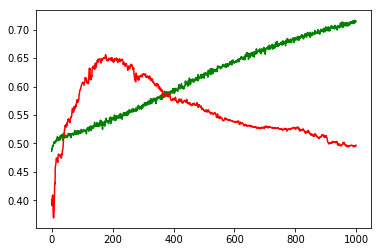

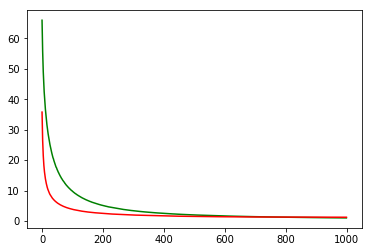

working on d,u and l,le 0.5 64 0.05 0.001


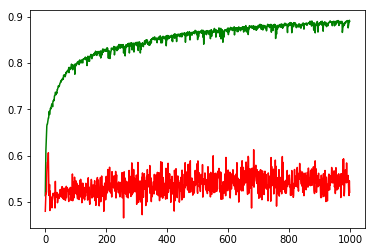

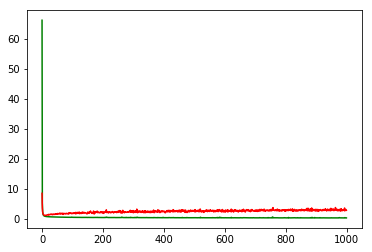

working on d,u and l,le 0.5 64 0.05 0.0001


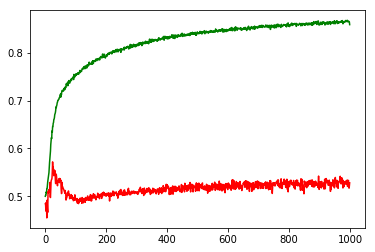

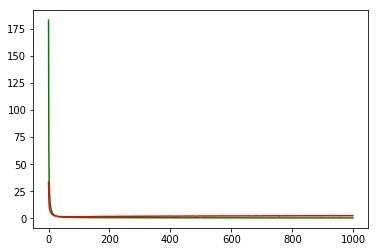

working on d,u and l,le 0.5 64 0.05 1e-05


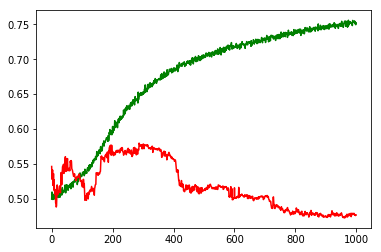

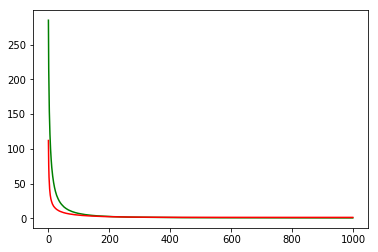

working on d,u and l,le 0.5 128 0.01 0.001


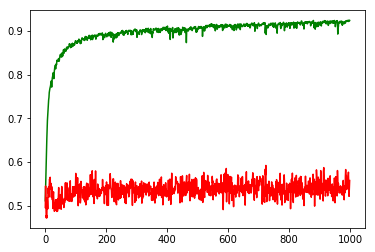

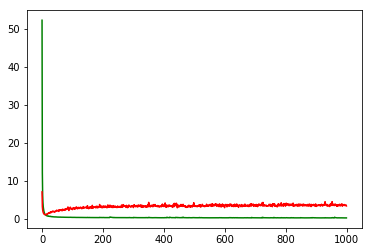

working on d,u and l,le 0.5 128 0.01 0.0001


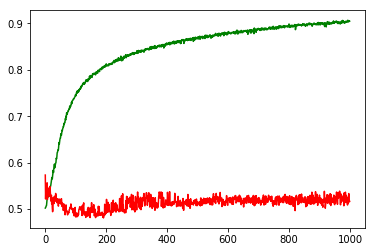

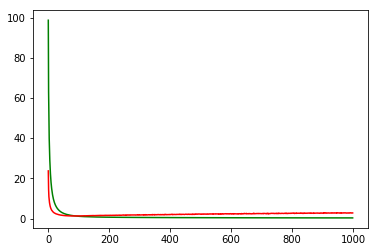

working on d,u and l,le 0.5 128 0.01 1e-05


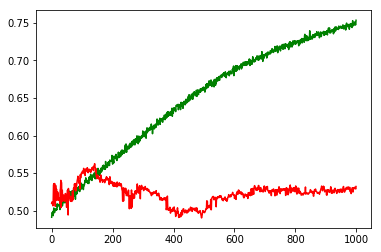

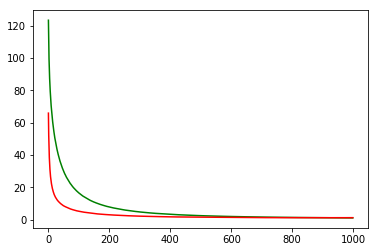

working on d,u and l,le 0.5 128 0.05 0.001


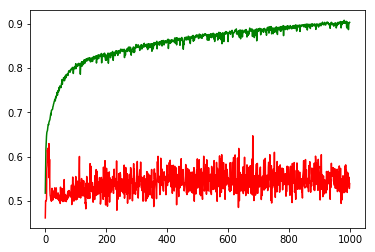

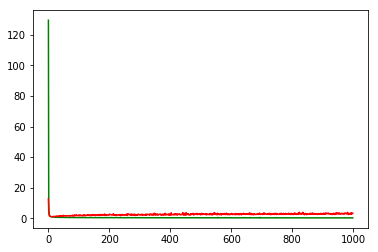

working on d,u and l,le 0.5 128 0.05 0.0001


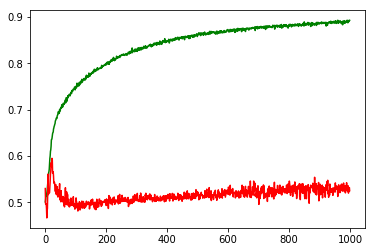

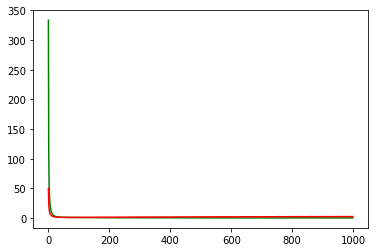

working on d,u and l,le 0.5 128 0.05 1e-05


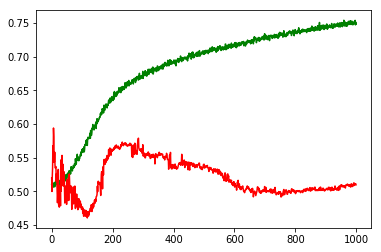

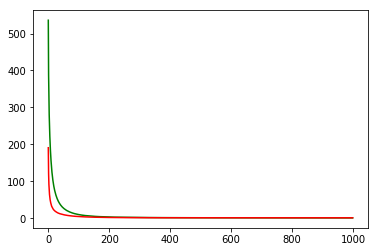

working on d,u and l,le 0.5 256 0.01 0.001


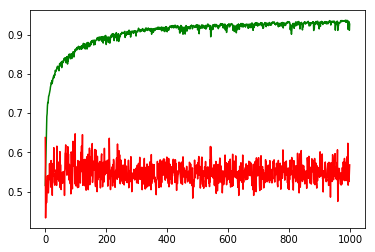

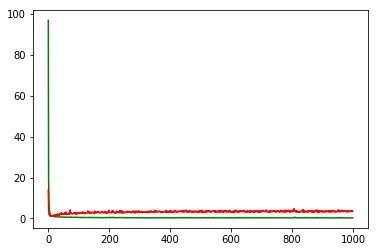

working on d,u and l,le 0.5 256 0.01 0.0001


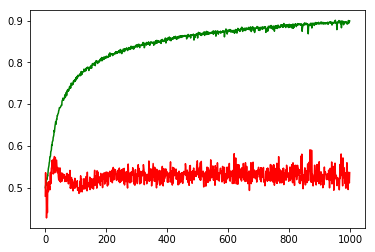

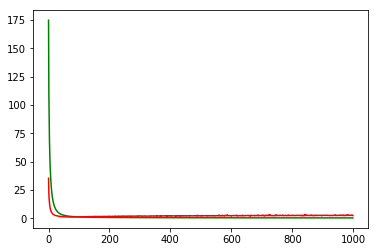

working on d,u and l,le 0.5 256 0.01 1e-05


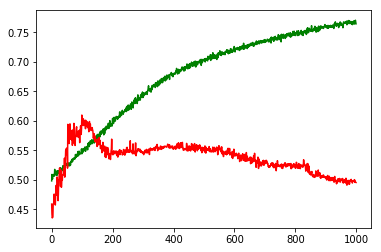

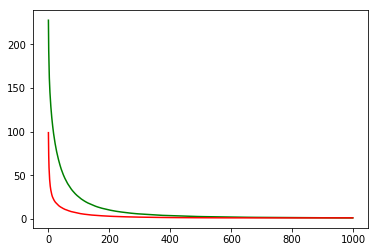

working on d,u and l,le 0.5 256 0.05 0.001


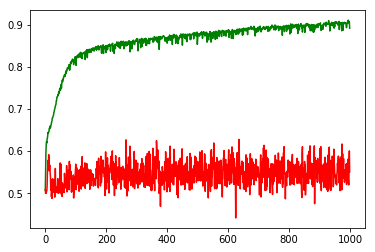

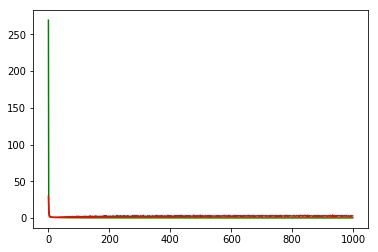

working on d,u and l,le 0.5 256 0.05 0.0001


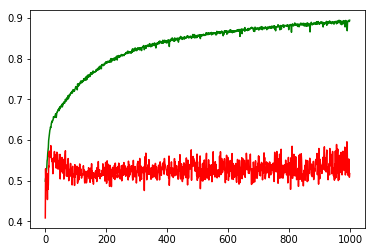

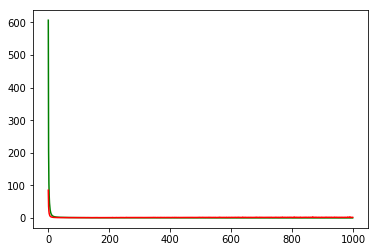

working on d,u and l,le 0.5 256 0.05 1e-05


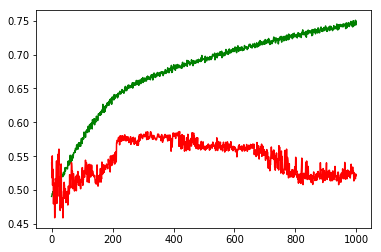

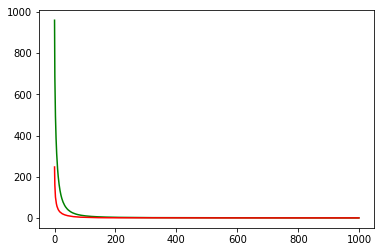

maxd,maxu,maxl,maxle: 0.5 256 0.01 0.0001
Chart for BEST MODEL FOR: TXN


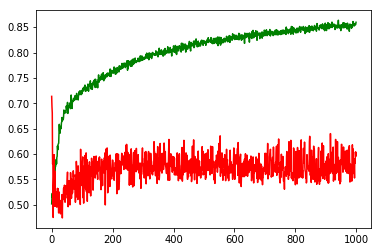

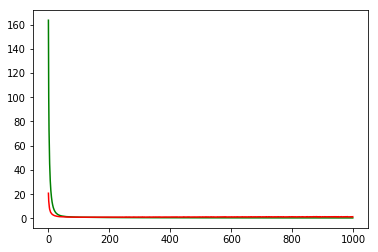

F1,score 0.7082521117608838
G-score: 0.5156705819302891
Accuracy 0.6030061878165136
Window: 140
[[137 231]
 [218 545]]
Vol pos 2.6931211374068567
Vol neg 2.1961944036742302
Real Percentage of gain: 63.970803098047995
Percentage of gain: 0.7520931286133925
Total gain: 850.6173284617469
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 57 151]
 [ 52 195]]
455/455 [==============================] - 0s 35us/step
[1.462120884984404, 0.5538461539444033]
Percentile:  1
[[ 65  64]
 [ 73 132]]
334/334 [==============================] - 0s 38us/step
[1.5445312953994659, 0.5898203592814372]
Percentile:  2
[[  7   7]
 [ 71 107]]
192/192 [==============================] - 0s 38us/step
[1.022346133987109, 0.59375]
Percentile:  3
[[ 6  4]
 [19 93]]
122/122 [==============================] - 0s 33us/step
[0.6590622585327899, 0.8114754113017536]
Percentile:  4
[[ 2  5]
 [ 2 17]]
26/26 [==============================] - 0s 27us/step
[0.9884436726570129, 0.7307692170143127]
0000000000000

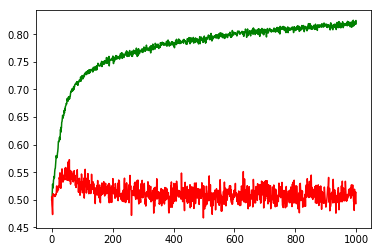

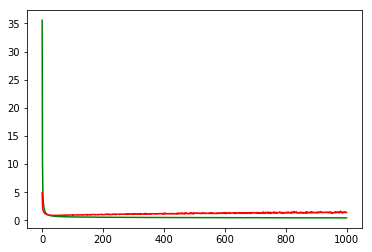

working on d,u and l,le 0.5 64 0.01 0.0001


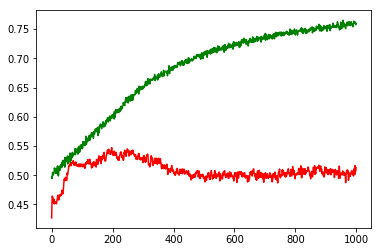

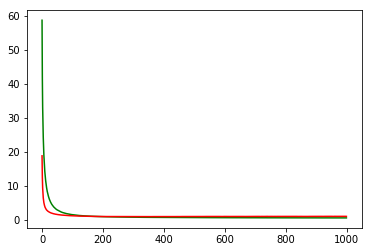

working on d,u and l,le 0.5 64 0.01 1e-05


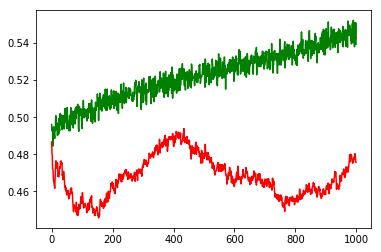

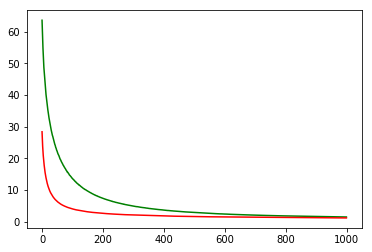

working on d,u and l,le 0.5 64 0.05 0.001


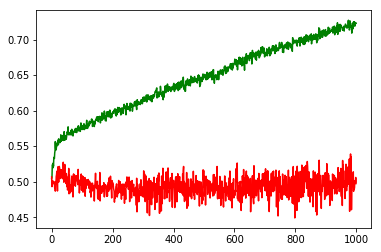

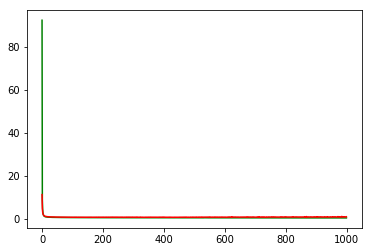

working on d,u and l,le 0.5 64 0.05 0.0001


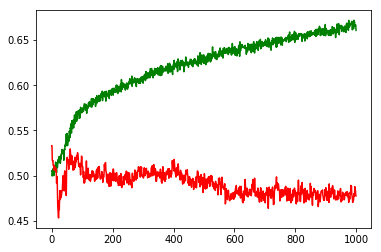

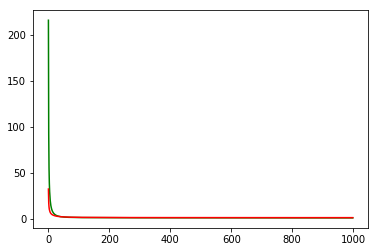

working on d,u and l,le 0.5 64 0.05 1e-05


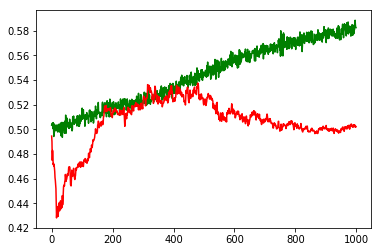

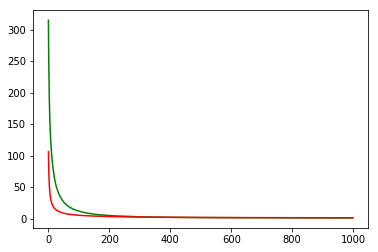

working on d,u and l,le 0.5 128 0.01 0.001


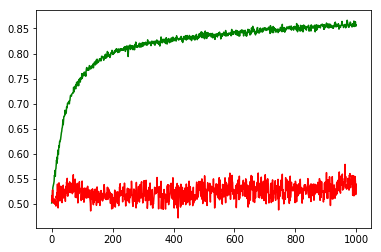

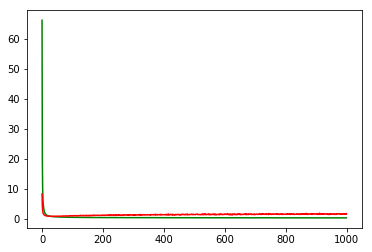

working on d,u and l,le 0.5 128 0.01 0.0001


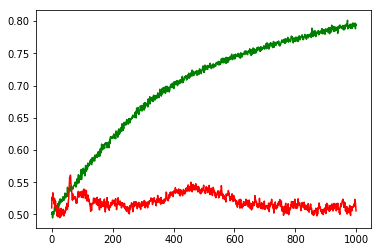

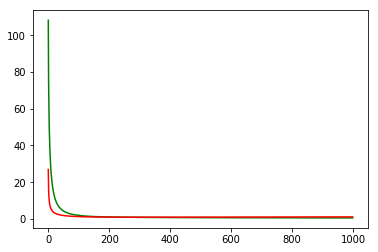

working on d,u and l,le 0.5 128 0.01 1e-05


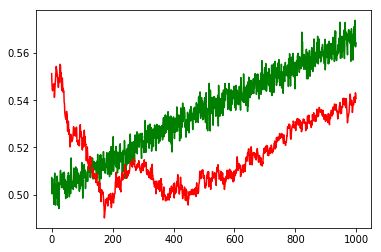

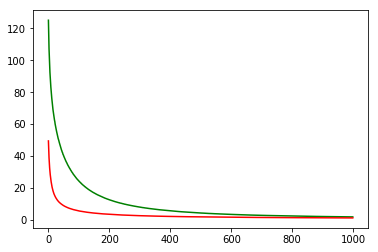

working on d,u and l,le 0.5 128 0.05 0.001


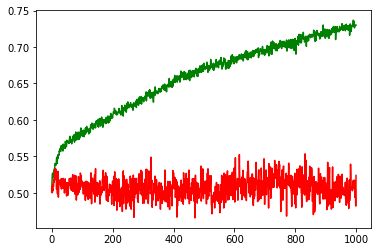

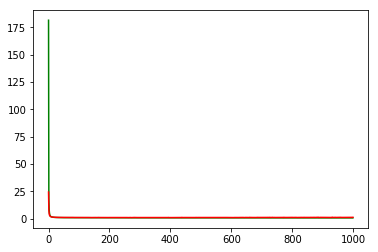

working on d,u and l,le 0.5 128 0.05 0.0001


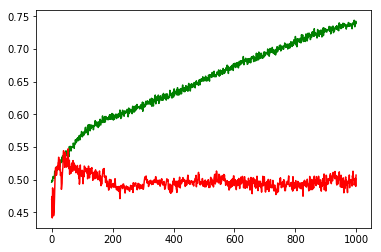

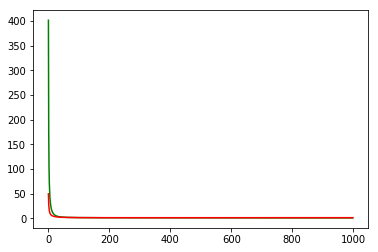

working on d,u and l,le 0.5 128 0.05 1e-05


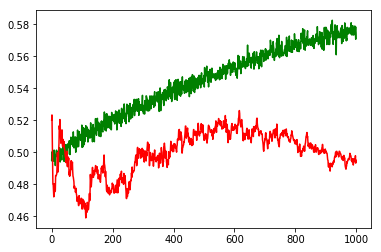

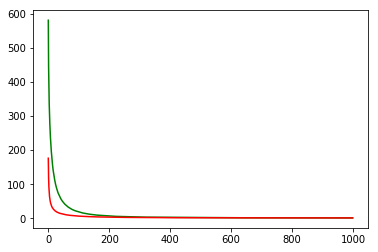

working on d,u and l,le 0.5 256 0.01 0.001


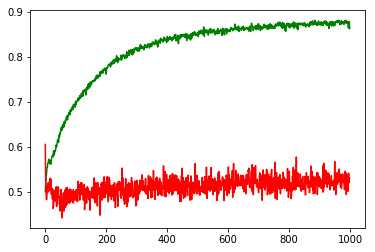

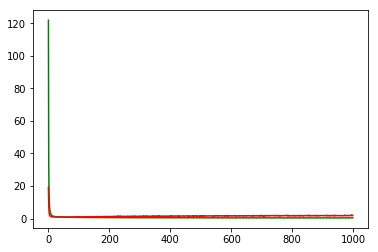

working on d,u and l,le 0.5 256 0.01 0.0001


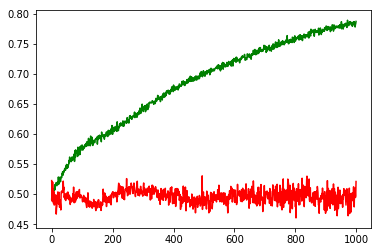

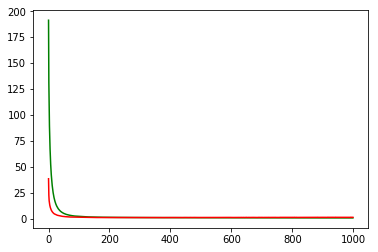

working on d,u and l,le 0.5 256 0.01 1e-05


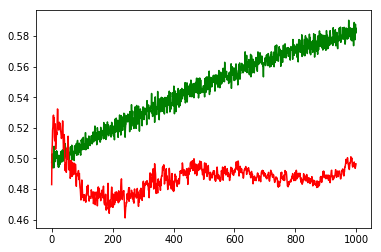

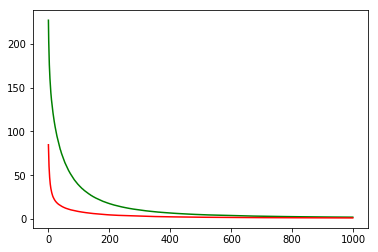

working on d,u and l,le 0.5 256 0.05 0.001


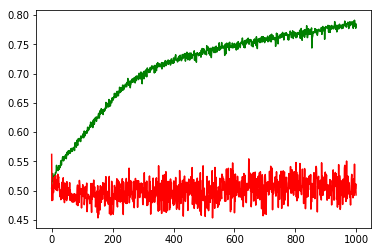

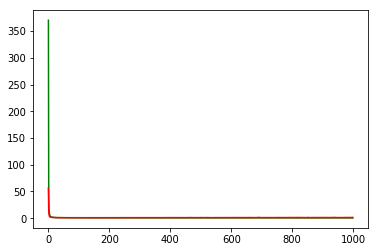

working on d,u and l,le 0.5 256 0.05 0.0001


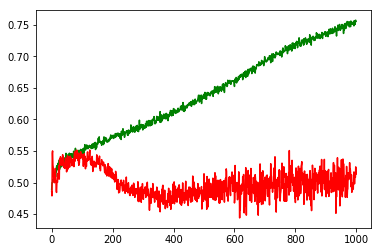

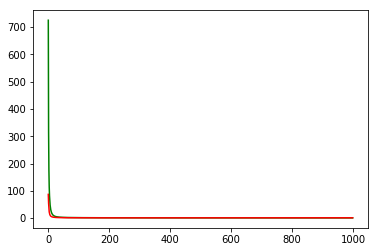

working on d,u and l,le 0.5 256 0.05 1e-05


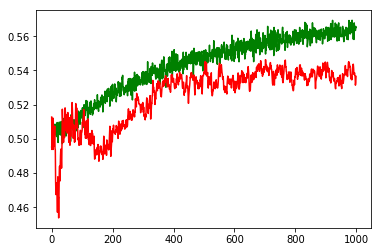

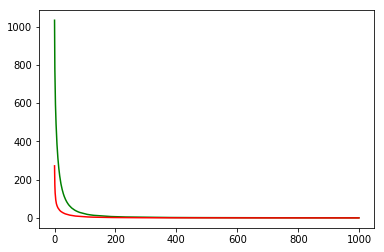

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.001
Chart for BEST MODEL FOR: AVGO


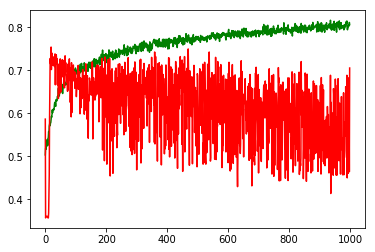

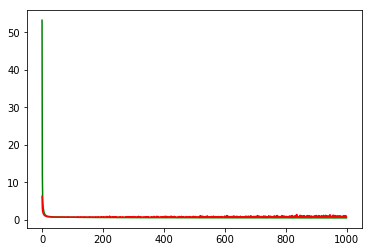

F1,score 0.7618364418938306
G-score: 0.692019886369493
Accuracy 0.7054126023611561
Window: 140
[[264 142]
 [190 531]]
Vol pos 3.745641973941599
Vol neg 1.8999631697595931
Real Percentage of gain: 151.4376260698355
Percentage of gain: 2.082517832230156
Total gain: 2346.997596923386
000000000000000000000000000000000000000000000000
Percentile:  0
[[111  90]
 [125 149]]
475/475 [==============================] - 0s 30us/step
[0.8613574688058151, 0.5473684200487638]
Percentile:  1
[[ 58  46]
 [ 35 115]]
254/254 [==============================] - 0s 29us/step
[0.7540619150390775, 0.6811023631433802]
Percentile:  2
[[ 34   4]
 [ 25 197]]
260/260 [==============================] - 0s 28us/step
[0.4307150483131409, 0.8884615384615384]
Percentile:  3
[[23  2]
 [ 5 58]]
88/88 [==============================] - 0s 34us/step
[0.2752743092450229, 0.9204545454545454]
Percentile:  4
[[37  0]
 [ 0 11]]
48/48 [==============================] - 0s 42us/step
[0.1590129335721334, 1.0]
000000000000000000000

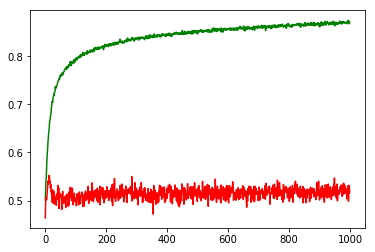

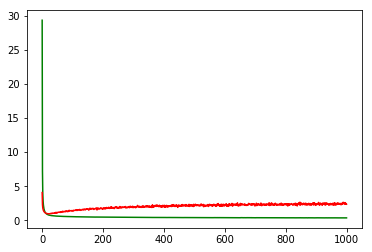

working on d,u and l,le 0.5 64 0.01 0.0001


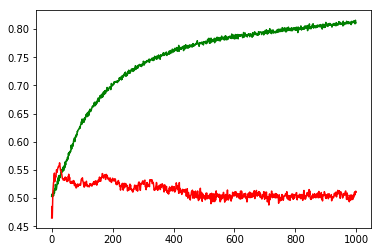

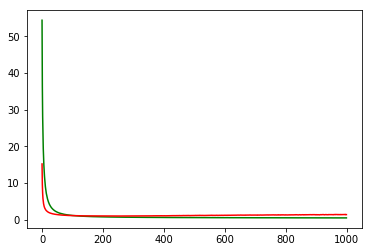

working on d,u and l,le 0.5 64 0.01 1e-05


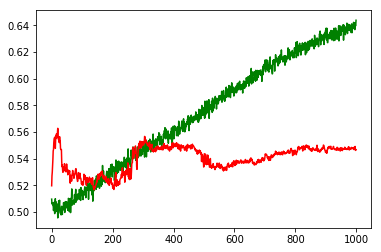

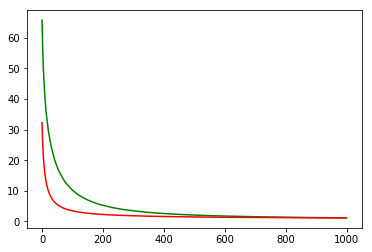

working on d,u and l,le 0.5 64 0.05 0.001


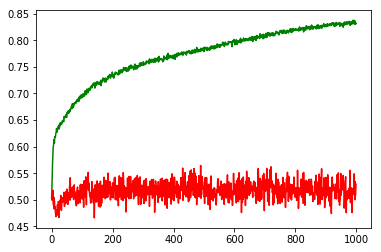

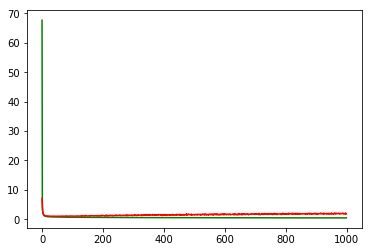

working on d,u and l,le 0.5 64 0.05 0.0001


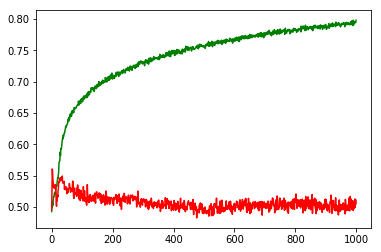

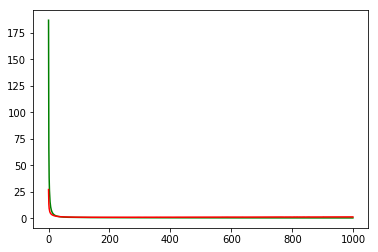

working on d,u and l,le 0.5 64 0.05 1e-05


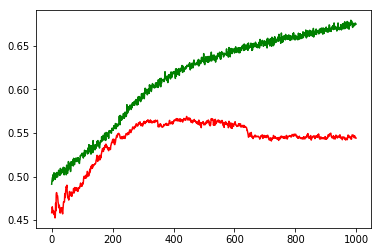

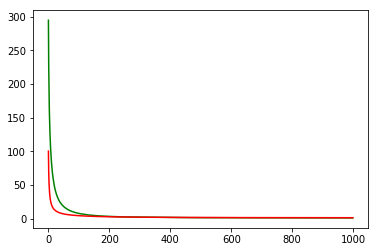

working on d,u and l,le 0.5 128 0.01 0.001


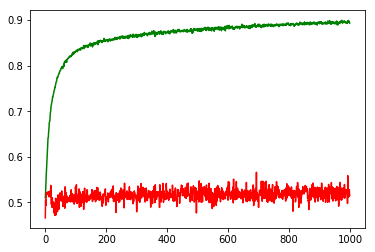

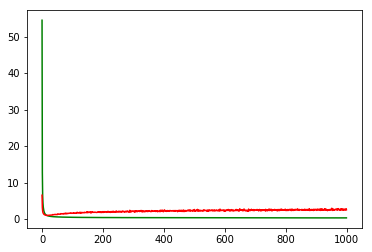

working on d,u and l,le 0.5 128 0.01 0.0001


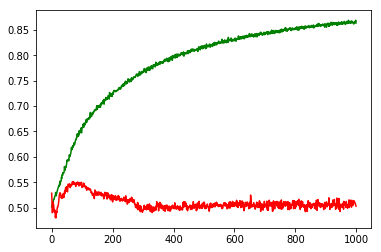

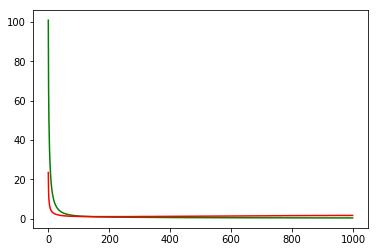

working on d,u and l,le 0.5 128 0.01 1e-05


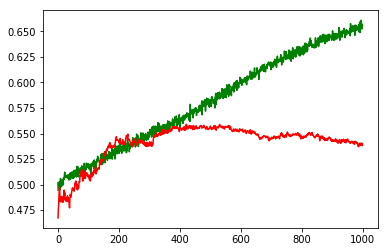

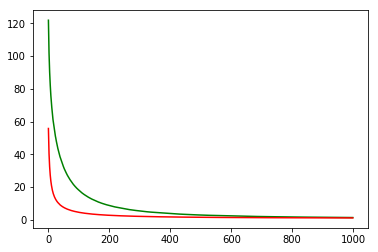

working on d,u and l,le 0.5 128 0.05 0.001


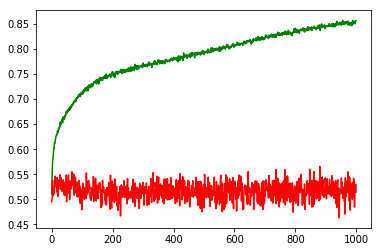

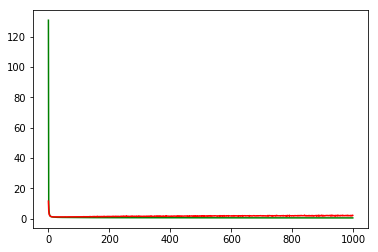

working on d,u and l,le 0.5 128 0.05 0.0001


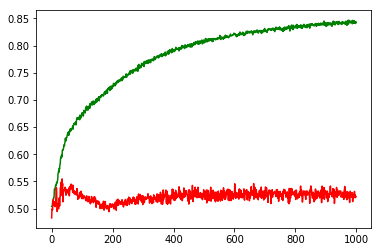

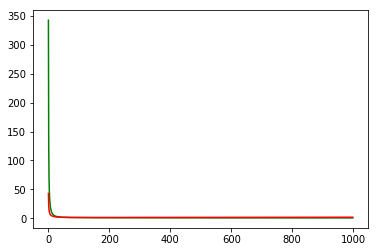

working on d,u and l,le 0.5 128 0.05 1e-05


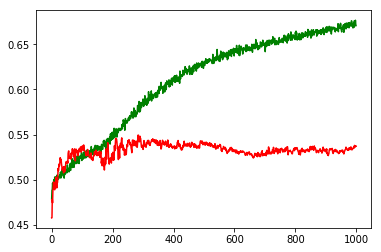

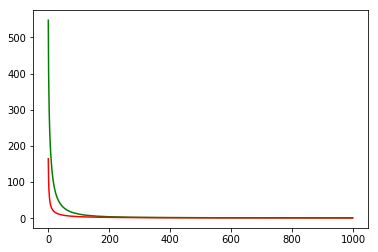

working on d,u and l,le 0.5 256 0.01 0.001


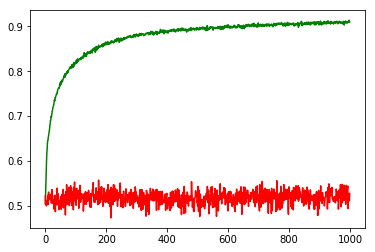

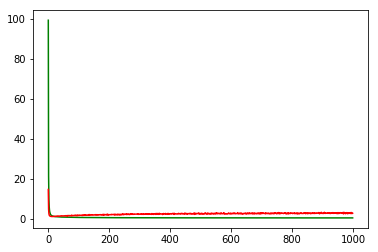

working on d,u and l,le 0.5 256 0.01 0.0001


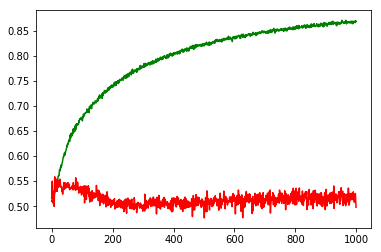

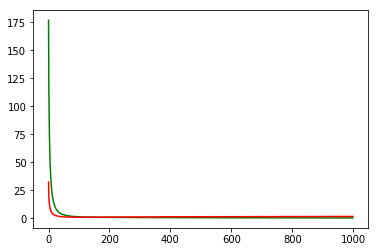

working on d,u and l,le 0.5 256 0.01 1e-05


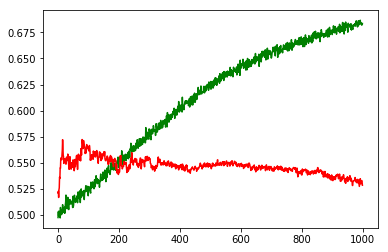

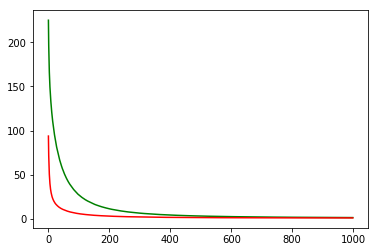

working on d,u and l,le 0.5 256 0.05 0.001


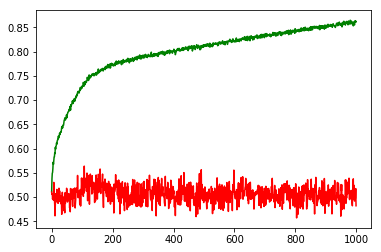

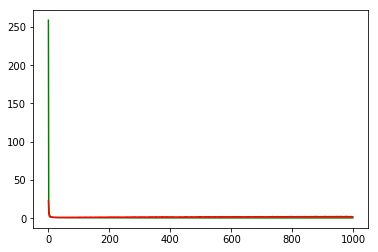

working on d,u and l,le 0.5 256 0.05 0.0001


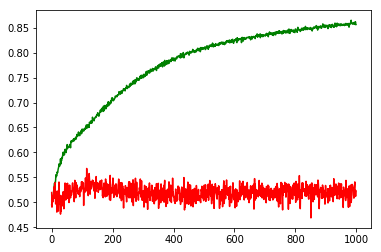

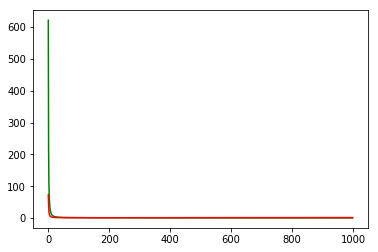

working on d,u and l,le 0.5 256 0.05 1e-05


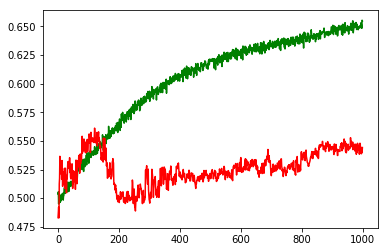

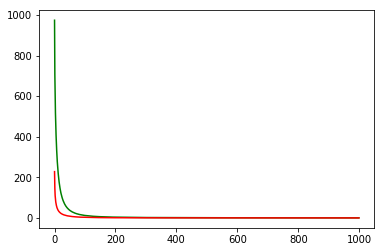

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.001
Chart for BEST MODEL FOR: PYPL


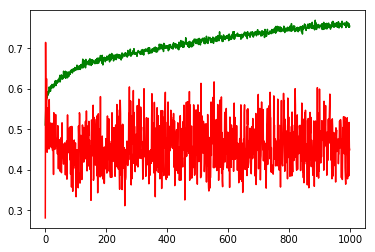

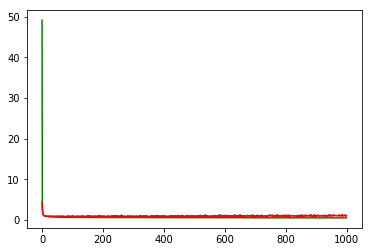

F1,score 0.5182311869666408
G-score: 0.47470507033228165
Accuracy 0.4499557147625804
Window: 140
[[174 144]
 [477 334]]
Vol pos 2.7968838339848654
Vol neg 3.0023376549481524
Real Percentage of gain: -57.917794640415615
Percentage of gain: -0.392944814932233
Total gain: -443.63469605849104
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 70  64]
 [234 211]]
579/579 [==============================] - 0s 24us/step
[0.977407888839076, 0.48531951651054345]
Percentile:  1
[[ 26  25]
 [172  85]]
308/308 [==============================] - 0s 25us/step
[1.1522428795888826, 0.36038961058313196]
Percentile:  2
[[69 51]
 [42 22]]
184/184 [==============================] - 0s 30us/step
[1.2128629943598872, 0.49456521998281067]
Percentile:  3
[[ 9  4]
 [25  5]]
43/43 [==============================] - 0s 54us/step
[1.4190189006716707, 0.32558139534883723]
Percentile:  4
[[0 0]
 [4 8]]
12/12 [==============================] - 0s 68us/step
[0.6043789386749268, 0.6666666865348816]
000

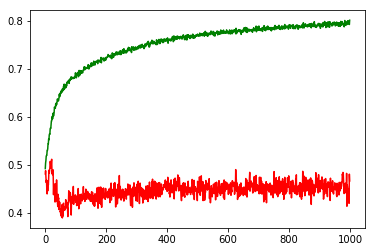

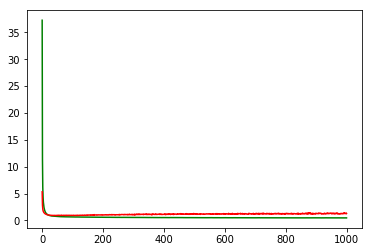

working on d,u and l,le 0.5 64 0.01 0.0001


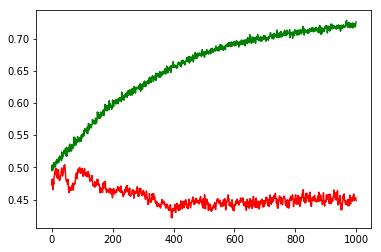

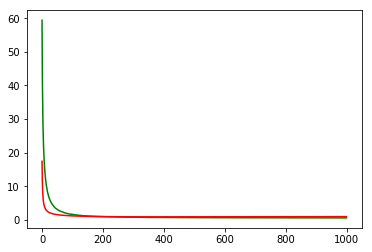

working on d,u and l,le 0.5 64 0.01 1e-05


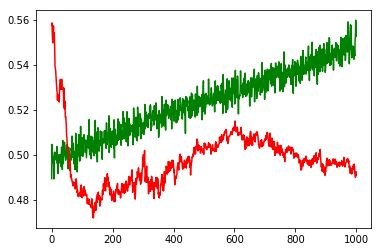

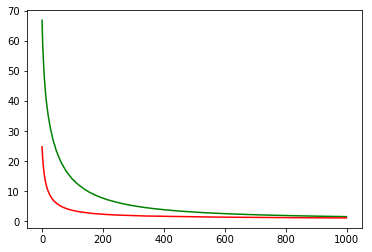

working on d,u and l,le 0.5 64 0.05 0.001


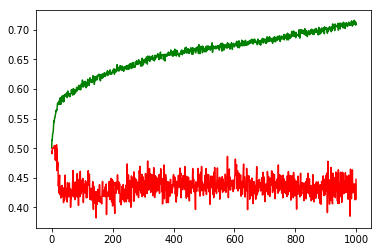

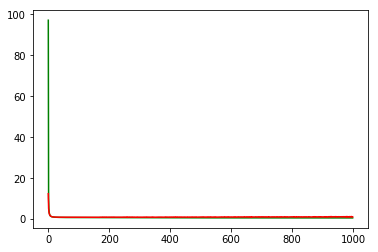

working on d,u and l,le 0.5 64 0.05 0.0001


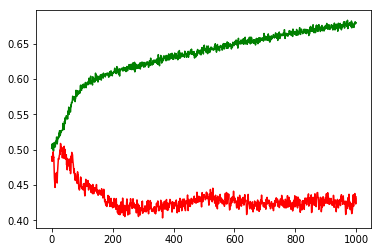

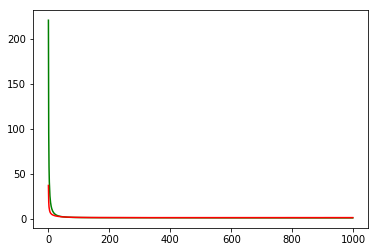

working on d,u and l,le 0.5 64 0.05 1e-05


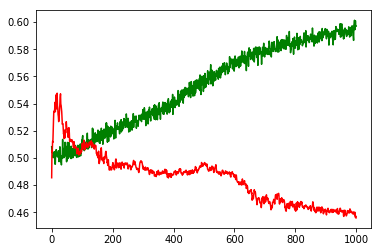

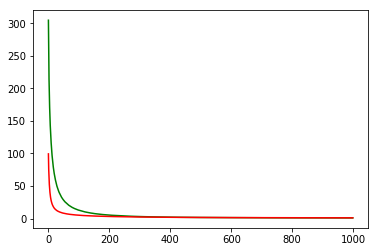

working on d,u and l,le 0.5 128 0.01 0.001


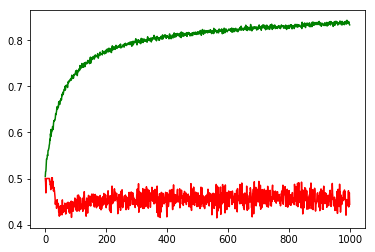

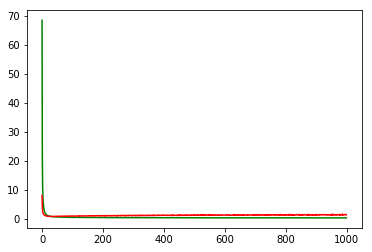

working on d,u and l,le 0.5 128 0.01 0.0001


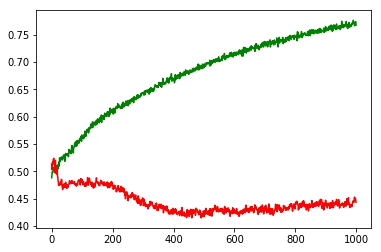

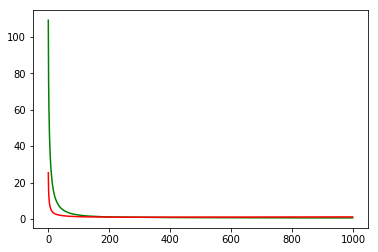

working on d,u and l,le 0.5 128 0.01 1e-05


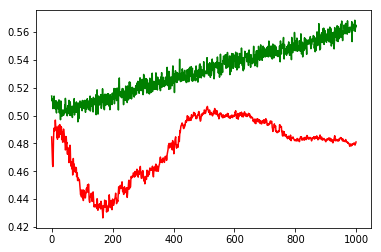

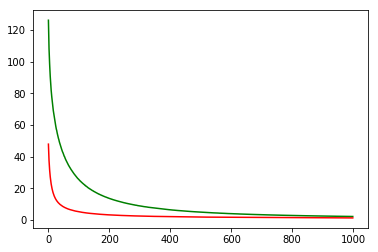

working on d,u and l,le 0.5 128 0.05 0.001


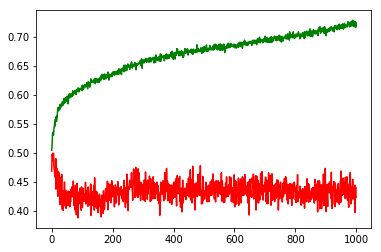

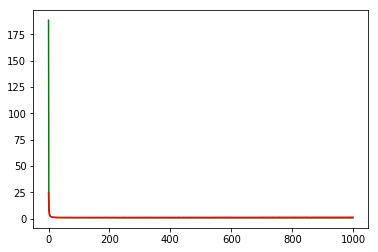

working on d,u and l,le 0.5 128 0.05 0.0001


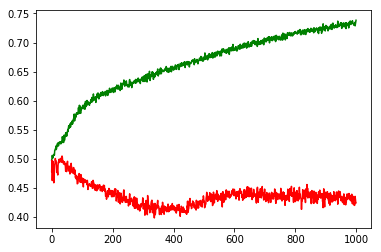

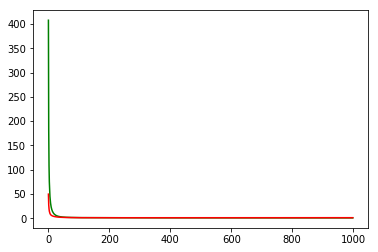

working on d,u and l,le 0.5 128 0.05 1e-05


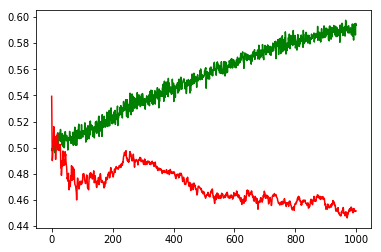

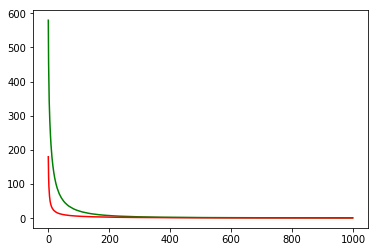

working on d,u and l,le 0.5 256 0.01 0.001


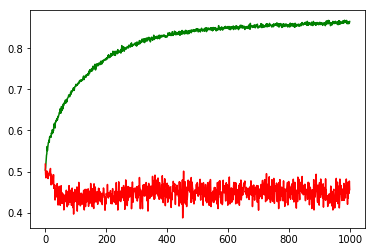

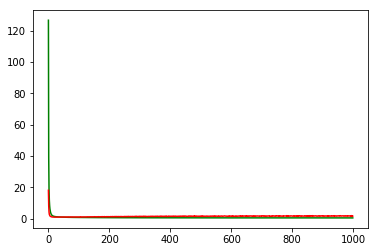

working on d,u and l,le 0.5 256 0.01 0.0001


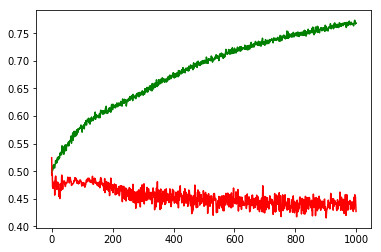

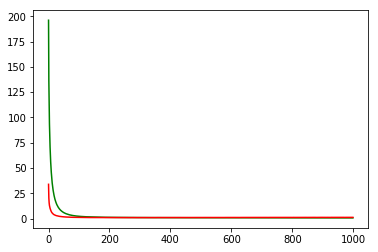

working on d,u and l,le 0.5 256 0.01 1e-05


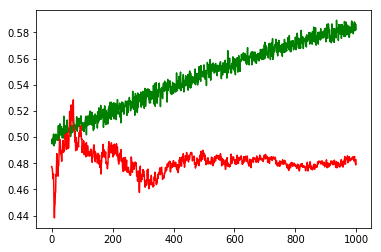

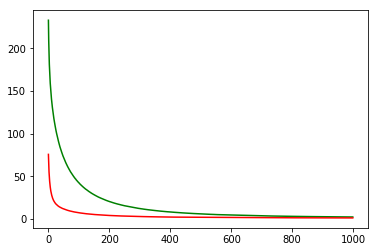

working on d,u and l,le 0.5 256 0.05 0.001


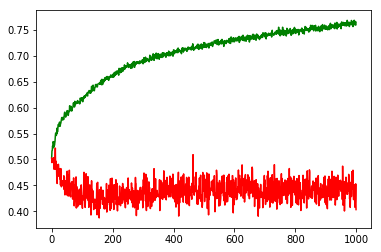

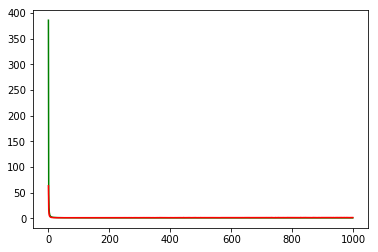

working on d,u and l,le 0.5 256 0.05 0.0001


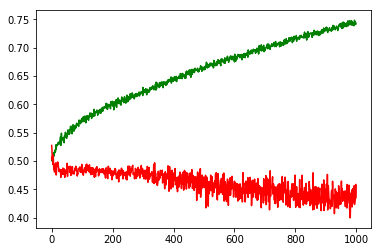

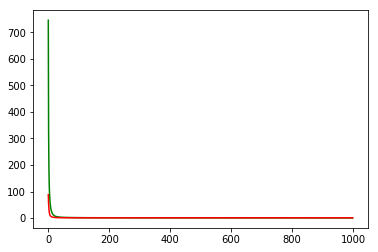

working on d,u and l,le 0.5 256 0.05 1e-05


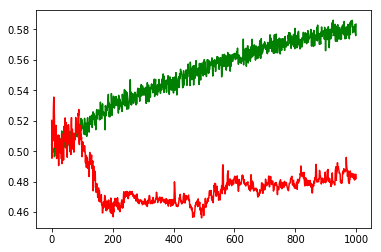

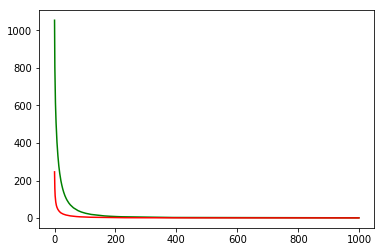

maxd,maxu,maxl,maxle: 0.5 64 0.01 0.001
Chart for BEST MODEL FOR: GILD


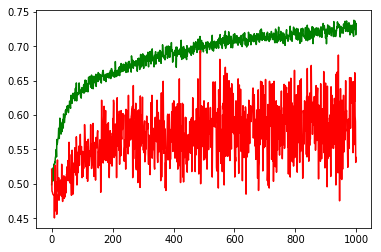

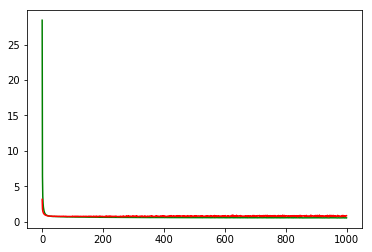

F1,score 0.3329065300896287
G-score: 0.44174643364124283
Accuracy 0.5381205686440704
Window: 140
[[477 105]
 [416 130]]
Vol pos 3.310999103322325
Vol neg 3.1548419145898494
Real Percentage of gain: 150.64117146075432
Percentage of gain: 0.32456012253132954
Total gain: 366.10381821533974
000000000000000000000000000000000000000000000000
Percentile:  0
[[305  34]
 [201  68]]
608/608 [==============================] - 0s 22us/step
[0.7425829376045027, 0.6134868421052632]
Percentile:  1
[[ 63  40]
 [158  46]]
307/307 [==============================] - 0s 32us/step
[1.0362941759611186, 0.3550488599348534]
Percentile:  2
[[12  0]
 [55 15]]
82/82 [==============================] - 0s 33us/step
[0.8111518832241617, 0.3292682897753832]
Percentile:  3
[[28 13]
 [ 0  0]]
41/41 [==============================] - 0s 49us/step
[0.597224639683235, 0.6829268307220645]
Percentile:  4
[[68 18]
 [ 0  0]]
86/86 [==============================] - 0s 66us/step
[0.6853406671867814, 0.7906976771909137]
0000000

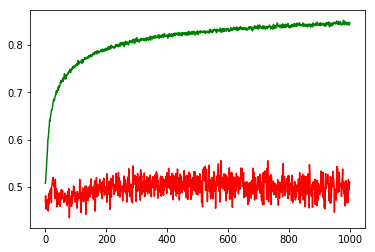

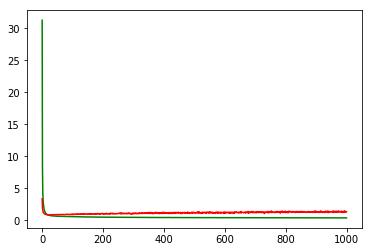

working on d,u and l,le 0.5 64 0.01 0.0001


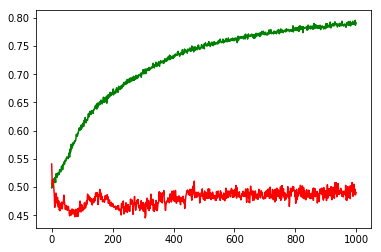

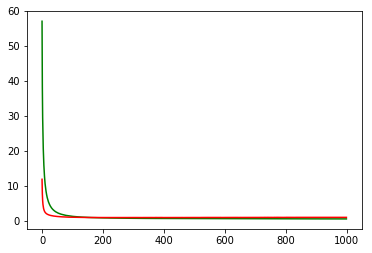

working on d,u and l,le 0.5 64 0.01 1e-05


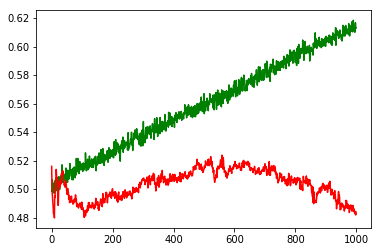

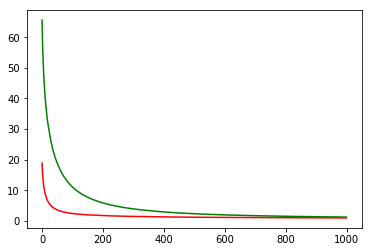

working on d,u and l,le 0.5 64 0.05 0.001


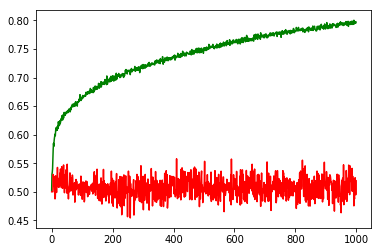

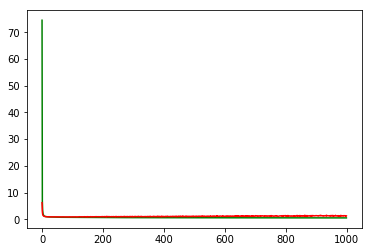

working on d,u and l,le 0.5 64 0.05 0.0001


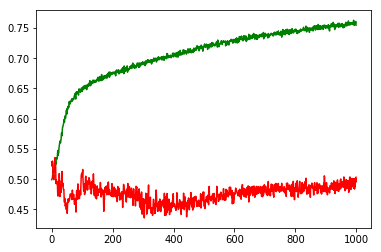

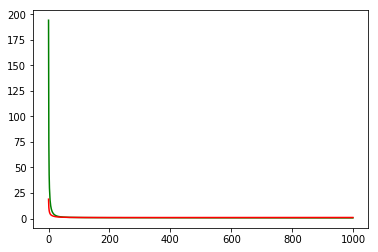

working on d,u and l,le 0.5 64 0.05 1e-05


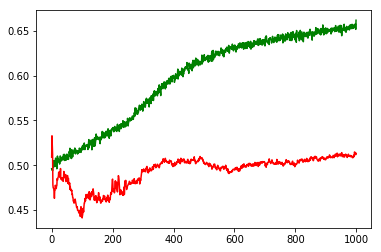

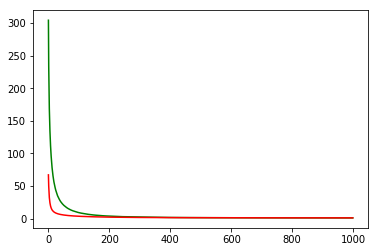

working on d,u and l,le 0.5 128 0.01 0.001


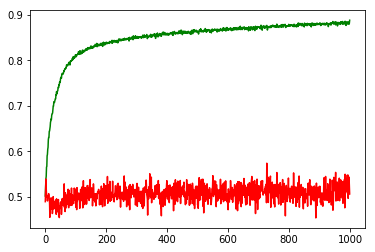

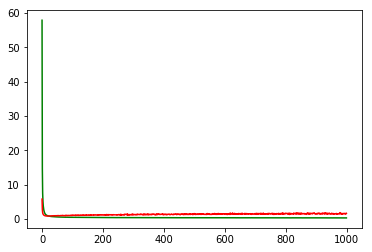

working on d,u and l,le 0.5 128 0.01 0.0001


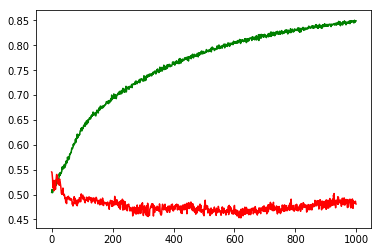

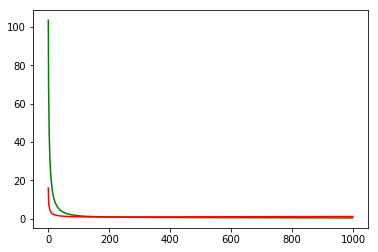

working on d,u and l,le 0.5 128 0.01 1e-05


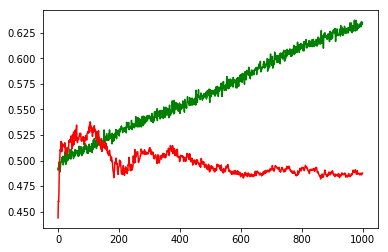

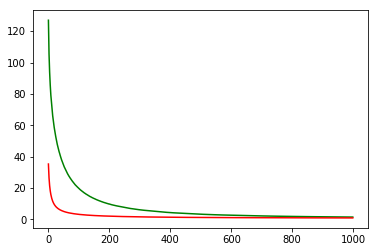

working on d,u and l,le 0.5 128 0.05 0.001


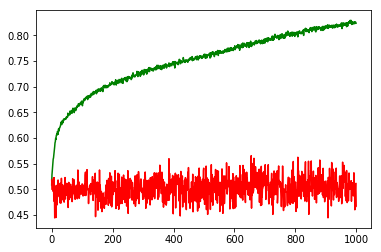

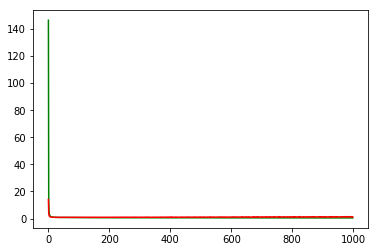

working on d,u and l,le 0.5 128 0.05 0.0001


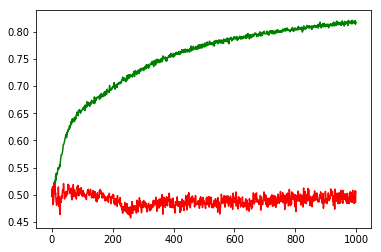

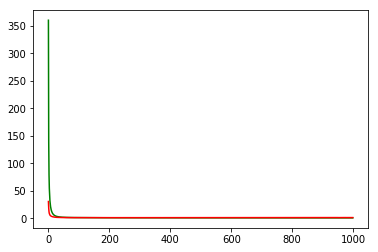

working on d,u and l,le 0.5 128 0.05 1e-05


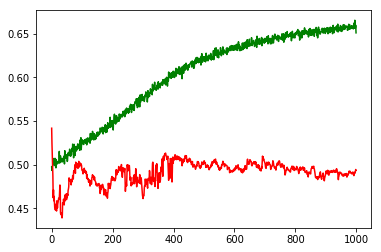

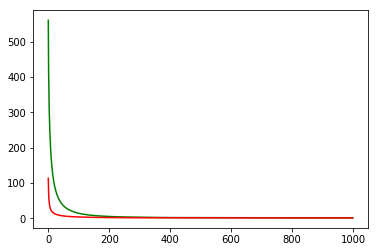

working on d,u and l,le 0.5 256 0.01 0.001


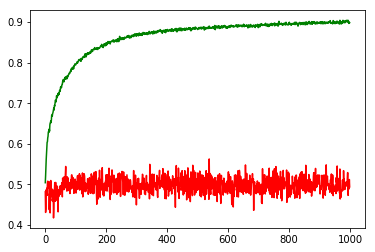

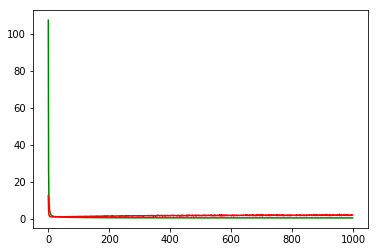

working on d,u and l,le 0.5 256 0.01 0.0001


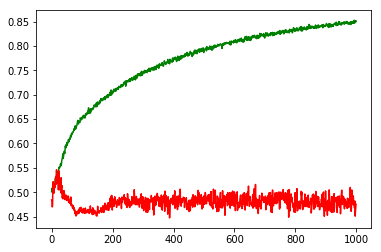

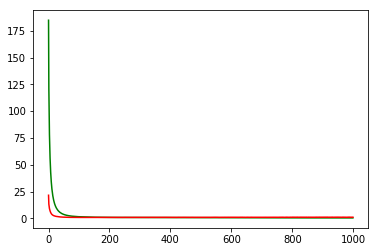

working on d,u and l,le 0.5 256 0.01 1e-05


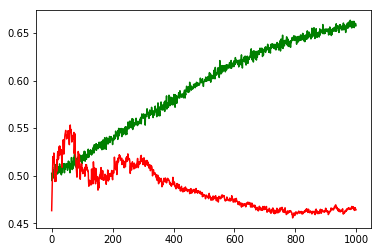

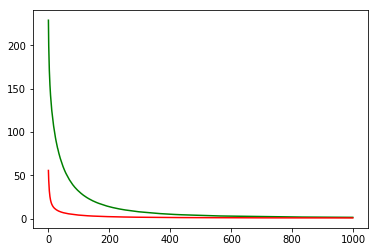

working on d,u and l,le 0.5 256 0.05 0.001


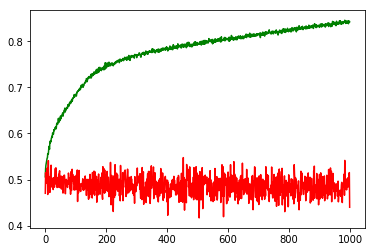

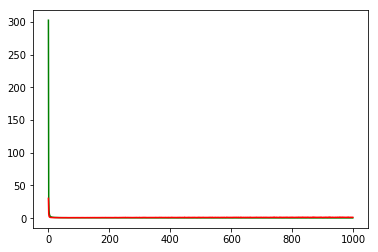

working on d,u and l,le 0.5 256 0.05 0.0001


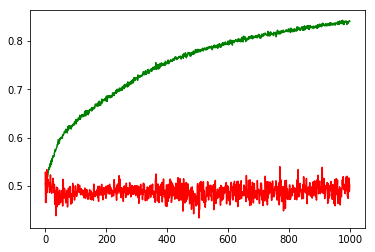

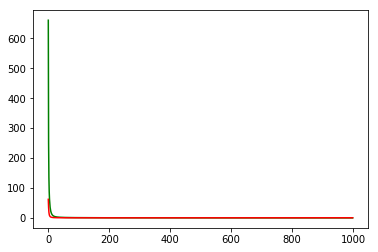

working on d,u and l,le 0.5 256 0.05 1e-05


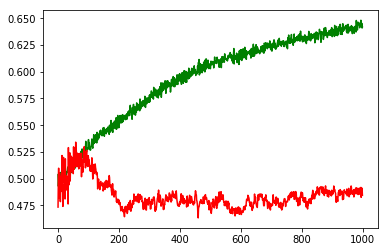

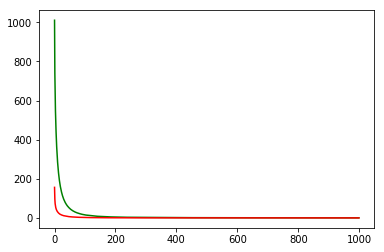

maxd,maxu,maxl,maxle: 0.5 256 0.05 0.0001
Chart for BEST MODEL FOR: COST


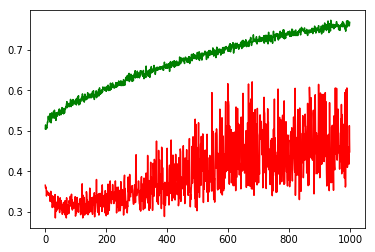

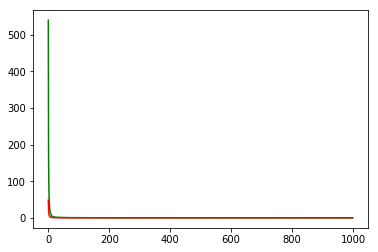

F1,score 0.517829457364341
G-score: 0.4471353141369154
Accuracy 0.4480922784864532
Window: 140
[[171 214]
 [408 334]]
Vol pos 1.3040007198035284
Vol neg 1.4556999289628316
Real Percentage of gain: -10.631294437872736
Percentage of gain: -0.21909937206220004
Total gain: -246.92499231409946
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 80 120]
 [ 83 104]]
387/387 [==============================] - 0s 40us/step
[1.18218520884366, 0.4754521963824289]
Percentile:  1
[[ 51  53]
 [117  89]]
310/310 [==============================] - 0s 31us/step
[1.0495821583655573, 0.45161290322580644]
Percentile:  2
[[ 30  38]
 [107  98]]
273/273 [==============================] - 0s 31us/step
[0.8963161488592406, 0.46886446891905187]
Percentile:  3
[[ 9  3]
 [52 28]]
92/92 [==============================] - 0s 41us/step
[0.8980034071466197, 0.40217391498710797]
Percentile:  4
[[ 0  0]
 [48 15]]
63/63 [==============================] - 0s 79us/step
[0.9632653981920273, 0.238095238095238

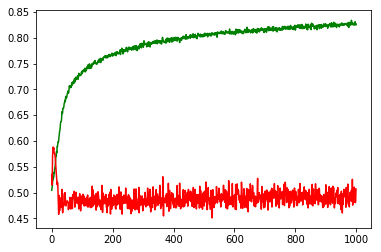

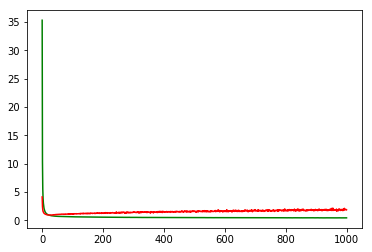

working on d,u and l,le 0.5 64 0.01 0.0001


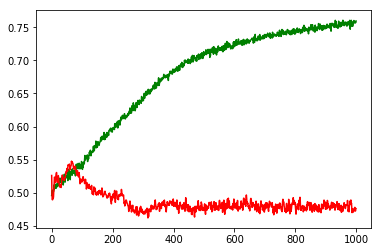

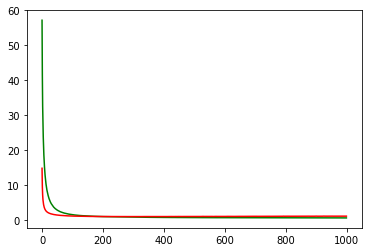

working on d,u and l,le 0.5 64 0.01 1e-05


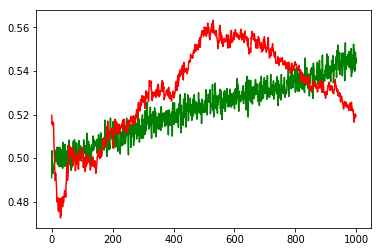

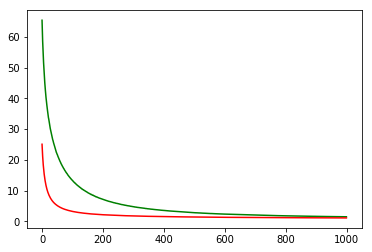

working on d,u and l,le 0.5 64 0.05 0.001


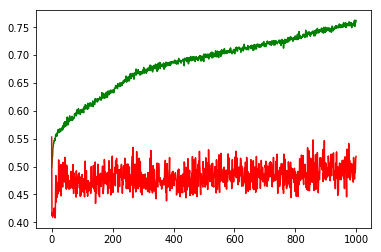

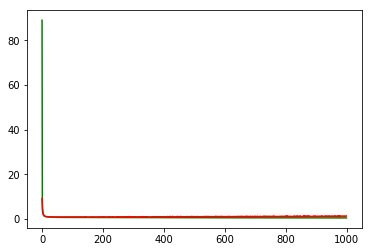

working on d,u and l,le 0.5 64 0.05 0.0001


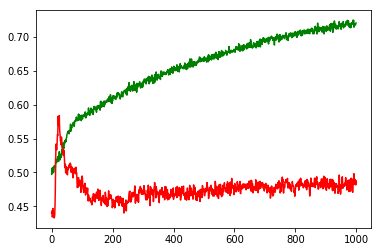

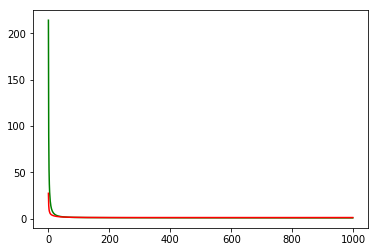

working on d,u and l,le 0.5 64 0.05 1e-05


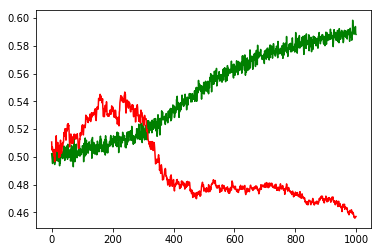

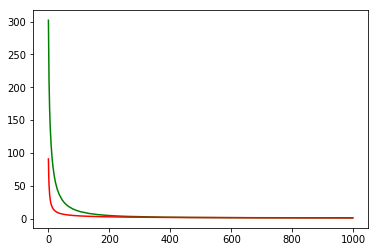

working on d,u and l,le 0.5 128 0.01 0.001


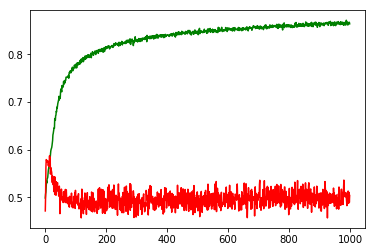

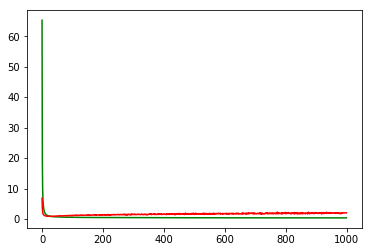

working on d,u and l,le 0.5 128 0.01 0.0001


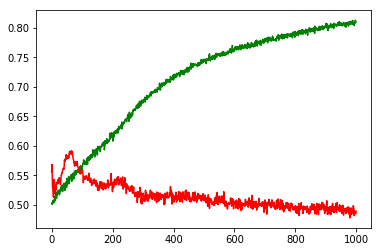

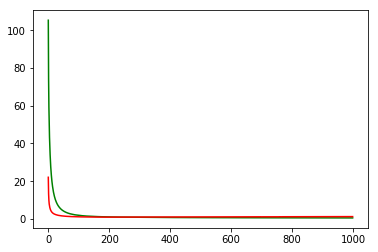

working on d,u and l,le 0.5 128 0.01 1e-05


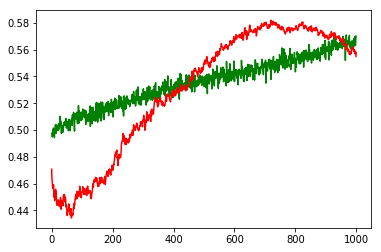

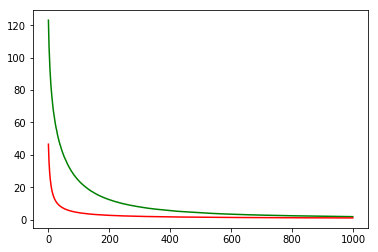

working on d,u and l,le 0.5 128 0.05 0.001


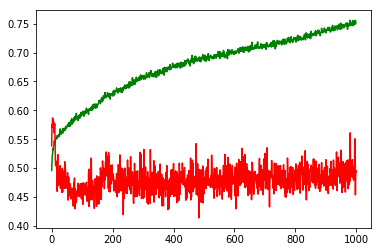

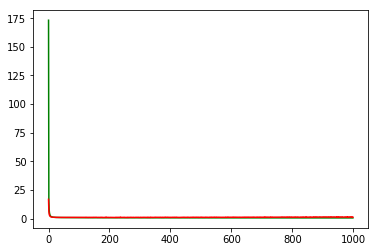

working on d,u and l,le 0.5 128 0.05 0.0001


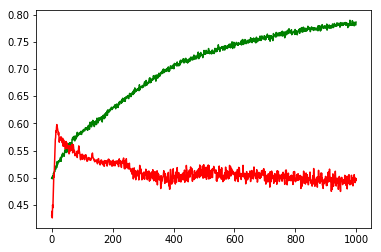

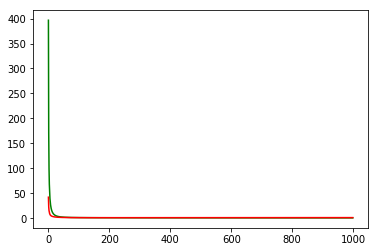

working on d,u and l,le 0.5 128 0.05 1e-05


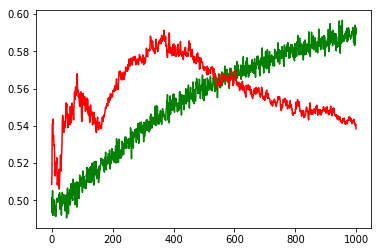

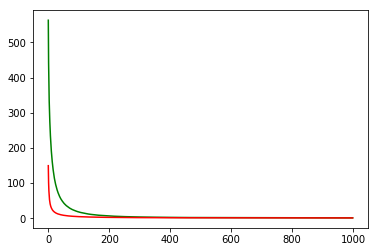

working on d,u and l,le 0.5 256 0.01 0.001


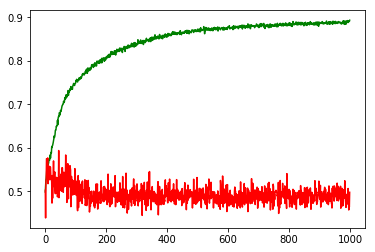

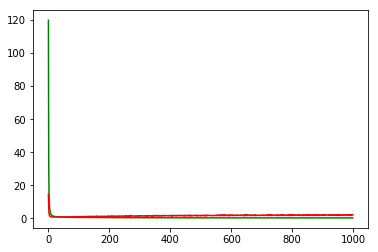

working on d,u and l,le 0.5 256 0.01 0.0001


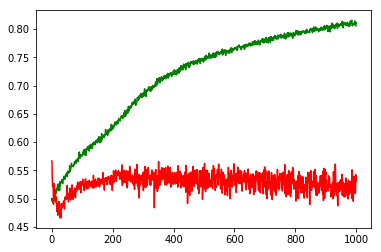

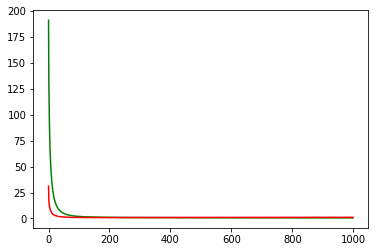

working on d,u and l,le 0.5 256 0.01 1e-05


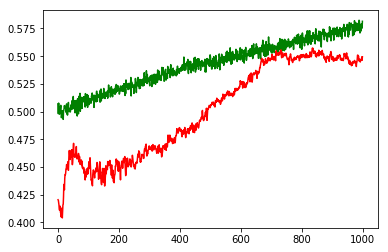

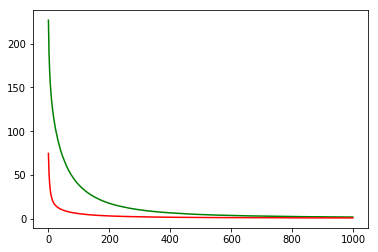

working on d,u and l,le 0.5 256 0.05 0.001


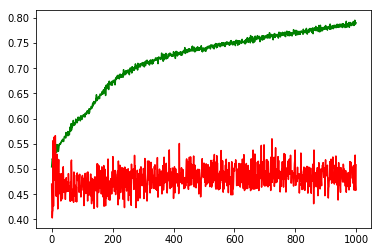

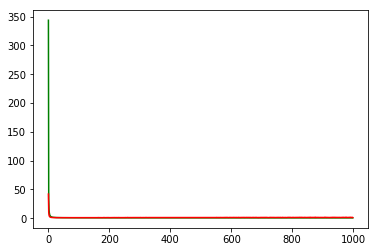

working on d,u and l,le 0.5 256 0.05 0.0001


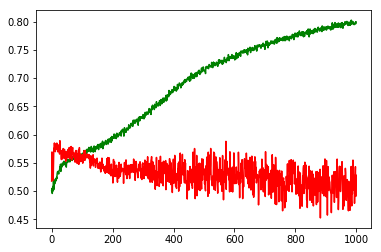

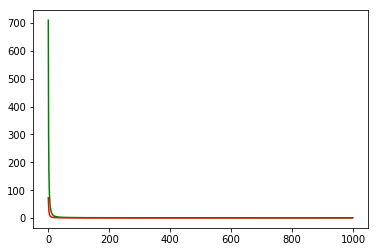

working on d,u and l,le 0.5 256 0.05 1e-05


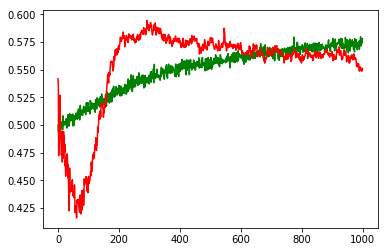

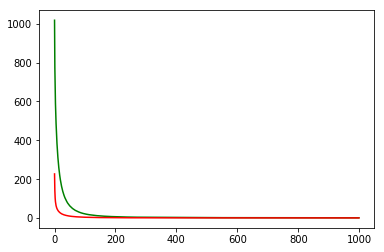

maxd,maxu,maxl,maxle: 0.5 64 0.01 0.001
Chart for BEST MODEL FOR: QCOM


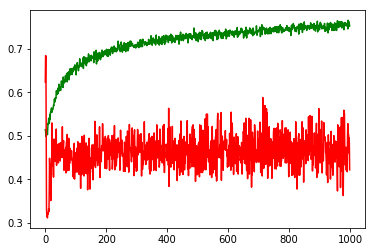

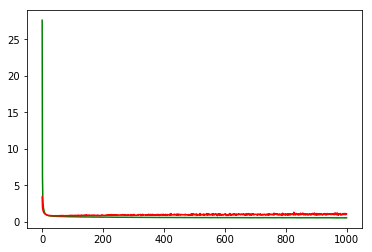

F1,score 0.47596153846153844
G-score: 0.4405238641273466
Accuracy 0.4217506629191701
Window: 140
[[180 175]
 [479 297]]
Vol pos 3.6647017160924182
Vol neg 3.123542212732411
Real Percentage of gain: -16.153504813477756
Percentage of gain: -0.26059583426252275
Total gain: -294.7338885509132
000000000000000000000000000000000000000000000000
Percentile:  0
[[112 118]
 [188 111]]
529/529 [==============================] - 0s 27us/step
[1.076927532771134, 0.42155009454612696]
Percentile:  1
[[ 15  33]
 [201  95]]
344/344 [==============================] - 0s 26us/step
[1.2283752671507902, 0.31976744186046513]
Percentile:  2
[[16  2]
 [46 44]]
108/108 [==============================] - 0s 55us/step
[0.8335944369987205, 0.5555555555555556]
Percentile:  3
[[12  0]
 [34 34]]
80/80 [==============================] - 0s 44us/step
[0.6380194902420044, 0.575]
Percentile:  4
[[25 21]
 [ 9 13]]
68/68 [==============================] - 0s 73us/step
[0.766152024269104, 0.5588235294117647]
000000000000000

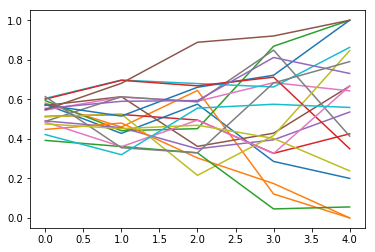

Ecco la matrice generale:
[[3916. 3560.]
 [6420. 7485.]]
Ecco le matrici per percentile
Percentile : 0
[[2197. 2085.]
 [2401. 2888.]]
Percentile : 1
[[ 798.  814.]
 [2224. 2434.]]
Percentile : 2
[[ 448.  377.]
 [1149. 1329.]]
Percentile : 3
[[274. 175.]
 [448. 586.]]
Percentile : 4
[[192. 105.]
 [183. 231.]]


In [4]:
import warnings
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MinMaxScaler
warnings.filterwarnings('ignore')
o=0
accstocksresults=[]
f1stocksresults=[]
f1scoreresults=[]
aucresults=[]
chartlist=[]
gainlist=[]
pricegainlist=[]
totalconfusion=np.zeros((2,2))
confusionlist=[]
for con in range(0,5):
    confusionlist.append(np.zeros((2,2)))

for price in prices:
    #print('New price[[[[[[[[[[[[[[[[[[[[[[[[[[[[[[[]]]]]]]]]]]]]]]]]]]]]]]]]]]]]]]')
    
   
    print('Working on...',files[o])
    
    senttemp=sentiment[o]
    senttemp=np.nan_to_num(np.asarray(senttemp, dtype=float))
    
    xtemp=price
    o+=1
    xtemp=np.nan_to_num(np.asarray(xtemp, dtype=float))
    
    #print(xtemp)
    accintime=[]
    trendwindowtime=[140]
    f1total=[]
    acctotal=[]
    auctotal=[]
    percfinal=[]
    f1scoretotal=[]
    percpostotal=[]
    percnegtotal=[]
    for t in trendwindowtime:
        #1
    #label because of the maket and append values without data
    #simo theroy past trend
        
        x=[]
        y=[]
        percentage=[]
        
        yvolatility=[]
        yprice=[]
        #print('============================================================')
        #print('Working on window:',t)
        #print(len(xtemp))
        ##QUI C E L'UNICO APPUNTO GUARDA SE CON +1 CAMBIA
        
        for i in range(0,len(price)-t-1):
            s=np.sign(price.iloc[i+t+1]['close']-price.iloc[i+1]['open'])
            percentage.append((100*(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))/price.iloc[i+1]['open']) 
            if(s==-1):
                y.append(0)
            else:
                y.append(1)
            yvolatility.append((100*abs(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))/price.iloc[i+1]['open'])
            yprice.append(abs(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))
            x.append(senttemp[i])
        
        y=np.array(y)
        x=np.array(x)
        
        scaler = MinMaxScaler() 
        scaler.fit(x)
        MinMaxScaler(copy=True, feature_range=(0, 1))
        x=scaler.transform(x)
        yvolatility=np.array(yvolatility)
       
        permindex=range(0,len(x))
        #permindex=np.random.permutation(permindex)
        train=0.8
        nt=math.ceil(len(x)*train)
        trainvalindex=permindex[0:nt]
        testindex=permindex[nt:]
        x_tv=[]
        y_tv=[]
        x_test=[]
        y_test=[]
        x_tv=x[trainvalindex]
        y_tv=y[trainvalindex]
        x_test=x[testindex]
        y_test=y[testindex]
        yvolatilitytest=yvolatility[testindex]
        #create structure for percentile valuation
        distribution=[]
        print(max(yvolatilitytest))
        print(min(yvolatilitytest))
        step=(max(yvolatilitytest)-min(yvolatilitytest))/5
        for v in range(0,5):
            pindexes=[]
            for r in range(0,len(y_test)):
                if(yvolatilitytest[r]<min(yvolatilitytest)+step+step*v and yvolatilitytest[r]>min(yvolatilitytest)+step*v):
                    pindexes.append(r)
            distribution.append(pindexes)
    

            
        lspace=[0.01,0.05]
        dropspace=[0.5]
        uspace=[64,128,256]
        learnspace=[0.001,0.0001,0.00001]
        
        
        bestsvm=None
        bestca=[]
        bestcl=[]
        maxacc=0
        cvacc=0
        maxu=0
        maxl=0
        maxd=0
        maxle=0
        #print('Model Selection...')
        #model selection
        cvacc=0
        totu=0
        for d in dropspace:
            for u in uspace:
                #print()
                for l in lspace:
                    for le in learnspace:
                    
                   
                        print('=========================================================')
                        print('working on d,u and l,le',d,u,l,le)

                        cvacclist=[]
                        #faccio cross validation
                        #start with 40% as train and 10% for validation and then i move in percentege
                        # 0-40 40-50
                        # 0-50 50-60
                        # 0-60 60-70 
                        #etc test set is completely external i do in some way error extimation changin the ticker
                        trainpoint=math.floor(len(x_tv)*0.40)
                        dimval=math.floor(trainpoint*0.25)
                        endval=trainpoint+dimval
                        
                        for i in range(0,6):
                            model=buildModel(l,u,d,le)
                            #print('-----')
                            x_train=x_tv[0:trainpoint]
                            y_train=y_tv[0:trainpoint]
                            x_val=x_tv[trainpoint:endval]
                            y_val=y_tv[trainpoint:endval]

                            trainpoint=trainpoint+dimval
                            endval=endval+dimval

                            x_train,y_train=smote(x_train,y_train)
                            if(sum(y_val)+6<len(x_val) and sum(y_val)>6):
                                x_val,y_val=smote(x_val,y_val)
                            else:
                                totu=totu+1

                            history=model.fit(x_train, y_train, epochs = 1000,batch_size =128, verbose=0, validation_data=(x_val, y_val),
                                              shuffle=True)
                            prediction=model.predict(x_val, batch_size=128, verbose=0)
                            for el in range(0,len(prediction)):
                                if(prediction[el]>0.5):
                                    prediction[el]=1
                                else:
                                    prediction[el]=0



                            if(i==0):
                                meanhvl=np.asarray(history.history['val_loss'])
                                meanhva=np.asarray(history.history['val_acc'])
                                meanhl=np.asarray(history.history['loss'])
                                meanha=np.asarray(history.history['acc'])

                            else:
                                meanhvl=np.add(meanhvl,history.history['val_loss'])
                                meanhva=np.add(meanhva,history.history['val_acc'])
                                meanha=np.add(meanha,history.history['acc'])
                                meanhl=np.add(meanhl,history.history['loss'])
                           
                            #i take the last one
                            #maxAcc=history.history['val_acc'][len(history.history['val_acc'])-1]
                            #USING G SCORE AS MODEL SELECTION METRIC
                            maxAcc=geometric_mean_score(y_val, prediction)
                            cvacclist.append(maxAcc)
                            model=None
                            history=None
                            
                            del model
                            del history
                            gc.collect()
                            tf.reset_default_graph() 
                            K.clear_session()

                        cvacc=sum(cvacclist)/len(cvacclist)
                        if(cvacc>maxacc):
                            maxacc=cvacc
                            maxu=u
                            maxl=l
                            maxle=le
                            maxd=d


                        meanhvl=meanhvl/6
                        meanhva=meanhva/6
                        meanhl=meanhl/6
                        meanha=meanha/6

                        plt.plot(meanha,'g')
                        plt.plot(meanhva,'r')
                        plt.show()
                        plt.plot(meanhl,'g')
                        plt.plot(meanhvl,'r')
                        plt.show()

                        print('=========================================================')
        model=buildModel(maxl,maxu,maxd,maxle)
        x_tv,y_tv=smote(x_tv,y_tv)
        history=model.fit(x_tv, y_tv, epochs =1000,batch_size =128, verbose=0, validation_data=(x_test, y_test),
                                          shuffle=True)
        prediction=model.predict(x_test, batch_size=128, verbose=0)
        predictionscsv = pd.DataFrame(data=prediction,columns=[files[o-1]])
        tempdate=np.array(dates[o-1])
        predictionscsv.index = tempdate[testindex]
        predictionscsv.to_csv('/home/andrea/Desktop/NLFF/technicalAnalysis/NN/Predictions/Newsetting/newwithadam/news/'+files[o-1]+'.csv')
        for el in range(0,len(prediction)):
            if(prediction[el]>0.5):
                prediction[el]=1
            else:
                prediction[el]=0
            
        
        
        print('=========================================================')
        print('=========================================================')
        print('=========================================================')
        print('=========================================================')
        print('maxd,maxu,maxl,maxle:',maxd,maxu,maxl,maxle)
        print('Chart for BEST MODEL FOR:',files[o-1])
        plt.plot(history.history['acc'],'g')
        plt.plot(history.history['val_acc'],'r')
        plt.show()
        plt.plot(history.history['loss'],'g')
        plt.plot(history.history['val_loss'],'r')
        plt.show()
        acctotal.append(history.history['val_acc'][len(history.history['val_acc'])-1])
        confmatrix=confusion_matrix(y_test, prediction,labels=[0,1])
        totalconfusion=totalconfusion+confmatrix
        volr=[]
        voln=[]
        pricegain=0
        for j in range(0,len(x_test)):
            if(y_test[j]==prediction[j]):
                volr.append(yvolatilitytest[j])
                pricegain=pricegain+yprice[j]
            else:
                voln.append(yvolatilitytest[j])
                pricegain=pricegain-yprice[j]
        
        CM = f1_score(y_test, prediction)
        fpr, tpr, thresholds = metrics.roc_curve(y_test, prediction)
        auc=metrics.auc(fpr, tpr)
        valueacc=geometric_mean_score(y_test, prediction)
        
        print('F1,score',CM)
        print('G-score:',valueacc)
        realacc=history.history['val_acc'][len(history.history['val_acc'])-1]
        accstocksresults.append(realacc)
        print('Accuracy',realacc)
        print('Window:',t)
        print(confmatrix)
        print('Vol pos',sum(volr)/len(volr))
        print('Vol neg',sum(voln)/len(voln))
        percnegtotal.append(sum(volr)/len(volr))
        percpostotal.append(sum(voln)/len(voln))
        #build structure to plot distribution onver percentile
        chart=np.zeros(5)
        for r in range(0,len(y_test)):
            for v in range(0,5):
                if(yvolatilitytest[r]<min(yvolatility)+step+step*v and yvolatilitytest[r]>min(yvolatility)+step*v):
                    chart[v]+=1
        #plt.plot(chart)
        #plt.show()
        print('Real Percentage of gain:',(pricegain*100)/(sum(price.iloc[1:6]['open'])))
        pricegainlist.append((pricegain*100)/(sum(price.iloc[1:6]['open'])))
        print('Percentage of gain:',(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        print('Total gain:',len(y_test)*(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        gainlist.append(len(y_test)*(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        print('000000000000000000000000000000000000000000000000')
        #performances for each percentile
        chartscore=[]
        for g in range(0,len(distribution)):
            print('Percentile: ',g)
            tempscore=0
            if(len(distribution[g])>0):
                predictionp=model.predict(x_test[distribution[g]])
                for el in range(0,len(predictionp)):
                    if(predictionp[el]>0.5):
                        predictionp[el]=1
                    else:
                        predictionp[el]=0
                        #labels added later
                tempmatrix=confusion_matrix(y_test[distribution[g]], predictionp,labels=[0,1])
                confusionlist[g]=confusionlist[g]+tempmatrix
                print(tempmatrix)
                print(model.evaluate(x_test[distribution[g]],y_test[distribution[g]]))
                tempscore=model.evaluate(x_test[distribution[g]],y_test[distribution[g]], verbose=0)
            chartscore.append(tempscore[1])    
        chartlist.append(chartscore)
        print('000000000000000000000000000000000000000000000000')
print('Mean acc over portfolio:',sum(accstocksresults)/len(accstocksresults))
print('Mean gain over portfolio : ', sum(gainlist)/len(gainlist))
print('Real mean gain over portfolio',sum(pricegainlist)/len(pricegainlist))
#print all the accuracy varing the percentile
for st in range(0,len(chartlist)):
    plt.plot(chartlist[st])
plt.show()
print('Ecco la matrice generale:')
print(totalconfusion)
print('Ecco le matrici per percentile')
for i in range(0,len(confusionlist)):
    print('Percentile :',i)
    print(confusionlist[i])        
   

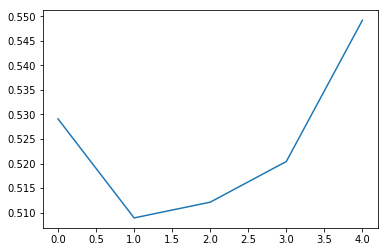

In [5]:
tot=np.zeros(5)
for st in range(0,len(chartlist)):
    tot=chartlist[st]+tot
    
tot=tot/len(chartlist)
plt.plot(tot)
plt.show()